In [270]:
2

2

In [228]:
2

2

In [1]:
import pickle
from os import makedirs as makedirs
import subprocess

import numpy as np
import pandas as pd
import itertools
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.animation import FFMpegWriter
from matplotlib.collections import PatchCollection
from multiprocessing import Pool, cpu_count
from scipy.spatial.distance import squareform, cdist, pdist

from pycwt.helpers import fft, fft_kwargs, rect
from functools import partial
from skimage.metrics import structural_similarity as ssim
from skimage.segmentation import watershed
import shapely.geometry as geo
from shapely.ops import snap
import scipy.stats as st
from sklearn import datasets, linear_model, cluster
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from tqdm import tqdm
from pyitlib import discrete_random_variable as drv
from sklearn.decomposition import NMF, FastICA
import umap

import p_utils

# Static parameters

curdir = './results/'

buffLen = p_utils.buffLen
truncDim = p_utils.truncDim	
trimLen = p_utils.trimLen

goodStates = ['Null','Fixation','Rest', 'Memory', 'Video', 'Math']
goodStates = ['Null','Instruction','Rest', 'Memory', 'Video', 'Math']

saveloc = './results/'
savename = 'PaperFigures'

sig = 0.05

['agraph.txt', 'analyzeICAHomology.m', 'analyzeICAHomology.m~', 'brainPlots.py', 'brainstructures.csv', 'centroids.csv', 'clusts.txt', 'colorTransform.txt', 'constructBrainPlotter.ipynb', 'cycleFile.txt', 'cyclesMatrixFile.txt', 'degreeArrayFile.txt', 'diag0.txt', 'diag1.txt', 'diag2.txt', 'diaghist1.txt', 'diaghist2.txt', 'DiffLarge.txt', 'DiffLarge_Diagram.txt', 'DiffLarge_Simplex.txt', 'DiffNodes.txt', 'DiffNodes_Diagram.txt', 'DiffNodes_Simplex.txt', 'DiffSmall.txt', 'DiffSmall_Diagram.txt', 'DiffSmall_Simplex.txt', 'DoAgglomGraph_v01.ipynb', 'DoCoarseGraph-Copy1.ipynb', 'DoCoarseGraph.ipynb', 'DoICAGraph.ipynb', 'EdgesLess.txt', 'EdgesLess_Diagram.txt', 'EdgesLess_Simplex.txt', 'edgesMatrixFile.txt', 'EdgesMore.txt', 'EdgesMore_Diagram.txt', 'EdgesMore_Simplex.txt', 'Figure4_UMAPMeanGrap.png', 'Figure5A.png', 'Figure5B.png', 'Figure5_Homology_Math.png', 'Figure5_Homology_MathTest.png', 'Figure5_Homology_Memory.png', 'Figure5_Homology_Video.png', 'figuresOHBM.zip', 'flatBrainMasks.

In [17]:
savename = 'PaperFigures'

3

In [2]:
metrics = {'Diagram':'Diagram', 'Simplex':'Simplex', 'Strength': 'Strength', 'Activity': 'Activity'}
basedir = {}
inputsdir = {}
localdir = {}
maxdims = {}
for  metric in metrics:
    if metric == 'Diagram':
        basedir[metric] = '../z18_GonzCast_WeightedCWT/'
        inputsdir[metric] = '../z18_GonzCast_WeightedCWT/results/rippedTesting/'
        #basedir[metric] = '../z22_GonzCast_WeightedCWT_Thresheld/'
        #inputsdir[metric] = '../z22_GonzCast_WeightedCWT_Thresheld/results/rippedTesting/'
        #basedir[metric] = '../z26_GonzCast_FullCWT/'
        #inputsdir[metric] = '../z26_GonzCast_FullCWT/results/rippedTesting/'
        maxdims[metric] = 2
    elif metric == 'Simplex':
        basedir[metric] = '../z19_GonzCast_WeightedCWT_Simplex/'
        inputsdir[metric] = '../z19_GonzCast_WeightedCWT_Simplex/results/simplexTraining/'    
        #basedir[metric] = '../z20_GonzCast_WeightedCWT_Simplex_Thresheld/'
        #inputsdir[metric] = '../z20_GonzCast_WeightedCWT_Simplex_Thresheld/results/simplexTraining/'    
        maxdims[metric] = 1
    if metric == 'Strength':
        basedir[metric] = '../z23_GonzCast_WeightedCWT_Strength/'        
        inputsdir[metric] = '../z23_GonzCast_WeightedCWT_Strength/results/strengthTraining/'
        maxdims[metric] = 0
    if metric == 'Activity':
        basedir[metric] = '../z25_GonzCast_Activations/'        
        inputsdir[metric] = '../z25_GonzCast_Activations/results/activityTraining/'
        maxdims[metric] = 2
    localdir[metric] = basedir[metric] + 'results/UMAPxyAll' + metric + '/'     
    
    
#conditions = {0:['Diagram', 0], 1:['Diagram', 1], 2:['Diagram', 2],
#              3:['Strength', 0], 4:['Simplex', 0], 5:['Simplex', 1]}


conditions = {0:['Activity', 2], 1:['Simplex', 1], 2:['Strength', 0],
              3:['Diagram', 0], 4:['Diagram', 1], 5:['Diagram', 2]}

condition_labels_all = {'Activity_2': 'Nodes', 'Strength_0': 'Strength', 'Simplex_1': 'Edges',
              'Diagram_0':'H0', 'Diagram_1':'H1', 'Diagram_2':'H2'}
              

#conditions = {0:['Diagram', 0], 1:['Diagram', 1], 2:['Diagram', 2]}
#conditions = {0:['Activity', 0], 1:['Activity', 1], 2:['Activity', 2]}


In [9]:
'{}_{}'.format(*conditions[0])

'Diagram_0'

In [63]:
int(np.round(5.6))

6

In [102]:
gg=np.array([[pts.x, pts.y] for pts in points[condition_label]])

In [104]:
gg[:2,:]

array([[-10.87094941,  -7.49204128],
       [ -9.78474166,  -8.17451533]])

In [3]:
def setFed(data):
    x = data[:,0]
    y = data[:,1]
    range1 = max([max(x) - min(x), max(y) - min(y)]) 
    deltax = (max(x) - min(x))/32
    deltay = (max(y) - min(y))/32

    xmin = min(x) - deltax
    xmax = max(x) + deltax
    ymin = min(y) - deltay
    ymax = max(y) + deltay
    
    xfrac = (xmax-xmin)/range1
    yfrac = (ymax-ymin)/range1
    
    max_grid = 256
    xsteps = int(np.round(xfrac*max_grid))
    ysteps = int(np.round(yfrac*max_grid))
    
    print(xmin, xmax, xsteps, ymin, ymax, ysteps)# Create meshgrid
    xx, yy = np.mgrid[xmin:xmax:xsteps*1j, ymin:ymax:ysteps*1j]
    #xx, yy = np.mgrid[xmin:xmax:56j, ymin:ymax:56j]

    return xx, yy, xmin, xmax, ymin, ymax

def getFed(data,xx=None,yy=None):
    x = data[:,0]
    y = data[:,1]

    values = np.vstack([x, y])
    kernel = st.gaussian_kde(values,bw_method=0.08)
    kFactor = kernel.factor

    positions = np.vstack([xx.ravel(), yy.ravel()])
    f = np.reshape(kernel(positions).T, xx.shape)

    return f, kFactor

def make_patch_spines_invisible(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)
        
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.2f}'.format(height),
                    xy=(rect.get_x() + rect.get_width(), height),
                    xytext=(0, 0),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


In [80]:
jj = np.arange(10,28)
bb = [3,6]
jj[[*bb]]

array([13, 16])

In [83]:
slice(*indexerRanges[dim])

slice(0, 327, None)

In [4]:
Nv = 18

epath = '/keilholz-lab/Jacob/TDABrains_00/data/FCStateClassif/timing.txt'
etime = pd.read_csv(epath,sep='\t',header=0).values.astype('int')
print('etime hist')
print(np.histogram(etime))
eset = np.unique(etime)
ttime = np.zeros(etime.shape)
rtime = np.zeros(etime.shape)
inite = -1
initt = -1
for i, t in enumerate(etime):
    if t == inite:
        initt += 1
        ttime[i,0] = initt
    else:
        ttime[i,0] = 0
        inite = t
        initt = 0

    if i < 508:
        rtime[i] = 1
    else:
        rtime[i] = 2
print('ttime hist')
print(np.histogram(ttime))
print(ttime.shape)
print(ttime)

trimLen = p_utils.trimLen

ce = []
ct = []
cr = []
cv = []
ci = []

for ni in range(Nv):
    ce.append(etime[trimLen:-trimLen])
    ct.append(ttime[trimLen:-trimLen])
    cr.append(rtime[trimLen:-trimLen])
    cv.append(np.zeros(ct[-1].shape)+ni)
    ci.append(np.arange(ct[-1].shape[0]))
    print(np.histogram(ce[-1]))
    print(np.histogram(ct[-1]))

nT = len(ct)

print(len(ct))
print(ct[0].shape)
print(np.concatenate(ct).shape)

CE = np.concatenate(ce).ravel()
print(['CE shape is: ', CE.shape])
types_ce = np.unique(CE)
# Set index boundaries for list of events
mxe1 = np.max(types_ce)+1
mne = 0

CV = np.concatenate(cv).ravel()
print(['CV shape is: ', CV.shape])
types_cv = np.unique(CV)
# set index boundaries for list of volunteers
mxv1 = np.max(types_cv)+1
mnv = Nv

CT = np.concatenate(ct).ravel()

CR = np.concatenate(cr).ravel()    

CI = np.concatenate(ci).ravel()
types_ci = np.unique(CI)
mxi1 = np.max(types_ci)+1


etime hist
(array([ 57,   0, 240,   0,   0, 240,   0, 240,   0, 240]), array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]))
ttime hist
(array([153,  96,  96,  96,  96,  96,  96,  96,  96,  96]), array([  0. ,  11.9,  23.8,  35.7,  47.6,  59.5,  71.4,  83.3,  95.2,
       107.1, 119. ]))
(1017, 1)
[[  0.]
 [  0.]
 [  1.]
 ...
 [117.]
 [118.]
 [119.]]
(array([ 56,   0, 121,   0,   0, 240,   0, 120,   0, 240]), array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]))
(array([128,  72,  72,  72,  72,  72,  72,  72,  72,  73]), array([  0. ,  11.9,  23.8,  35.7,  47.6,  59.5,  71.4,  83.3,  95.2,
       107.1, 119. ]))
(array([ 56,   0, 121,   0,   0, 240,   0, 120,   0, 240]), array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]))
(array([128,  72,  72,  72,  72,  72,  72,  72,  72,  73]), array([  0. ,  11.9,  23.8,  35.7,  47.6,  59.5,  71.4,  83.3,  95.2,
       107.1, 119. ]))
(array([ 56,   0, 121,   0,   0, 240,   0, 120,   0, 240]), array([1. , 1.4, 1.8, 2

In [195]:
indexerRanges

{0: [0, 327]}

In [5]:
def getIndexerRanges(nP, nW):    
    # Lookup table translating all possible nd simplices into ordinal labels
    # Possible simplices are limited by disconnected construction of the multi-layer graph
    # Goal is to store boolean sparse matrices when indexed simplex is present
    indexerRanges = {}
    i0 = 0
    i00 = 0
    for dim in range(0,1+1,1):
        for w in range(nW):
            vec = range(nP*w,nP*(w+1),1)
            for i, s in enumerate(itertools.combinations(vec,dim+1), start=i0):
                pass
            i0 = i+1
        indexerRanges[dim] = [i00,i0]
        i00 = i0
    print(indexerRanges)
    indexerA = np.arange(i+1)
    return indexerRanges, indexerA

nP = p_utils.knn
nW = 1
    
indexerRanges, indexerA = getIndexerRanges(nP,nW)

{0: [0, 328], 1: [328, 53956]}


In [9]:
voln = volunteers[0]
locU = inputsdir['Simplex']
with open(locU + str(voln) + '.pkl', 'rb') as file:
    uus = pickle.load(file)        


In [6]:
volunteers = p_utils.getSecondList(inputsdir[metric])

In [22]:
dim = 1

In [27]:
328*327/2

53628.0

In [41]:
metrics

{'Diagram': 'Diagram', 'Simplex': 'Simplex', 'Strength': 'Strength'}

In [281]:
locU = inputsdir['Diagram']
with open(locU + str(volunteers[0]) + '.pkl', 'rb') as file:
    uus = pickle.load(file)        

In [284]:
list(uus[0].keys())

['dgms',
 'cocycles',
 'num_edges',
 'dperm2all',
 'idx_perm',
 'r_cover',
 'landscape']

In [291]:
uus[0]['num_edges']

53628

In [51]:
h3[condition_label][2].shape

(777, 2)

In [6]:
# Get underlying data

vloc = '/keilholz-lab/Jacob/TDABrains_00/data/FCStateClassif/anat/'

volunteers, restDirs, taskDirs, EVtxt, Blocks, Blockstxt = p_utils.getLists(vloc=vloc)

trimLen = p_utils.trimLen

h1 = []

volunteers = p_utils.getSecondList(inputsdir[metric])
for vi, voln in tqdm(enumerate(volunteers),desc='load inputs for metric {}'.format(metric)):

    adata = np.load(vloc + voln ).T        
    adata = np.delete(adata, p_utils.missingVoxels, axis=0)

    nvox, nT = nP, nT = np.shape(adata)
    print(nP,nT)
    
    data = adata[:,trimLen:-trimLen]

    h1.append(data)        
h1 = np.concatenate(h1,axis=1)
print(h1.shape)

load inputs for metric Activity: 3it [00:00, 26.55it/s]

['SBJ01_Gordon333.npy', 'SBJ02_Gordon333.npy', 'SBJ03_Gordon333.npy', 'SBJ04_Gordon333.npy', 'SBJ06_Gordon333.npy', 'SBJ07_Gordon333.npy', 'SBJ08_Gordon333.npy', 'SBJ09_Gordon333.npy', 'SBJ10_Gordon333.npy', 'SBJ12_Gordon333.npy', 'SBJ13_Gordon333.npy', 'SBJ14_Gordon333.npy', 'SBJ15_Gordon333.npy', 'SBJ16_Gordon333.npy', 'SBJ17_Gordon333.npy', 'SBJ18_Gordon333.npy', 'SBJ19_Gordon333.npy', 'SBJ20_Gordon333.npy']
328 1017
328 1017
328 1017
328 1017
328 1017


load inputs for metric Activity: 11it [00:00, 29.05it/s]

328 1017
328 1017
328 1017
328 1017
328 1017
328 1017
328 1017


load inputs for metric Activity: 18it [00:00, 30.94it/s]

328 1017
328 1017
328 1017
328 1017
328 1017
328 1017
(328, 13986)


In [7]:
# Get underlying data
h2 = {}
for metric in metrics:    
    for dim in range(maxdims[metric]+1):
        condition_label = '{}_{}'.format(metric,dim)
        h2[condition_label] = []    
    
    volunteers = p_utils.getSecondList(inputsdir[metric])
    for vi, voln in tqdm(enumerate(volunteers),desc='load inputs for metric {}'.format(metric)):
        locU = inputsdir[metric]
        with open(locU + str(voln) + '.pkl', 'rb') as file:
            uus = pickle.load(file)        
            
        for uu in uus:
            for dim in range(maxdims[metric]+1):
                condition_label = '{}_{}'.format(metric,dim)
                if metric == 'Diagram':
                    h2[condition_label].append(uu['dgms'][dim])
                elif metric == 'Simplex' or metric == 'Strength':                    
                    ind = np.full(indexerA.shape,True)
                    ind[:indexerRanges[dim][0]] = False
                    ind[indexerRanges[dim][1]:] = False                    
                    h2[condition_label].append( uu.toarray()[0,indexerA[ind]] )                                    
                elif metric == 'Activity':
                    h2[condition_label].append(uu[dim])
                    
                    

                    

load inputs for metric Diagram: 18it [02:00,  6.71s/it]
load inputs for metric Simplex: 18it [01:33,  5.19s/it]
load inputs for metric Strength: 18it [00:03,  5.30it/s]
load inputs for metric Activity: 18it [00:09,  1.98it/s]


In [569]:
    volunteers = p_utils.getSecondList(inputsdir[metric])


In [49]:
len(h2['Strength_0'][0])

328

In [82]:
uu.toarray().shape

(1, 53956)

In [64]:
len(h3['Strength_0'])

18

In [8]:
                 
# Get UMAP data
h3 = {}
for metric in metrics:    
    # Get underlying data
    for dim in range(maxdims[metric]+1):
        condition_label = '{}_{}'.format(metric,dim)
        h3[condition_label] = []

    volunteers = p_utils.getSecondList(localdir[metric])
    for vi, vol in tqdm(enumerate(volunteers),desc='load embedding for metric {}'.format(metric)):
        embfile = localdir[metric] + str(vol) + '.pkl'
        with open(embfile,'rb') as file:
            temp = pickle.load(file)
        for dim in range(maxdims[metric]+1):
            condition_label = '{}_{}'.format(metric,dim)
            h3[condition_label].append(temp[dim])

            

load embedding for metric Diagram: 18it [00:00, 26.84it/s]
load embedding for metric Simplex: 18it [00:00, 59.75it/s]
load embedding for metric Strength: 18it [00:00, 49.46it/s]
load embedding for metric Activity: 18it [00:00, 25.51it/s]


In [30]:
h3[condition_label][-1].shape

(777, 2)

In [9]:

with open('../performance.pkl','rb') as file:    
    performance_log = pickle.load(file)

performance = {}
performance_mean = {}
for perf in performance_log:
    performance[perf] = np.full(CV.shape,np.nan,dtype='float')
    performance_mean[perf] = np.full(len(types_cv),np.nan,dtype='float')

for ii, [vv, ee, rr] in enumerate(zip(CV, CE, CR)):
    if ee>2:        
        for perf in performance_log:
            performance[perf][ii] = performance_log[perf].loc[
                volunteers[int(vv)][:5],goodStates[int(ee)]+'_'+str(int(rr))]  

for vi in types_cv.astype(int):
    for perf in performance_log:
        performance_mean[perf][vi] = np.mean( 
            (performance_log[perf].loc[volunteers[vi][:5],:].values).astype('float') )


In [9]:
psig

{}

In [78]:
import bisect

In [84]:
ccc = np.linspace(xmin,xmax,num=len(xx[condition_label]))

In [91]:
np.arange(10)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [95]:
bisect.bisect_right( np.arange(10),-.9 )

0

In [187]:
indices[3] in y

True

In [12]:
xx[condition_label].shape

(272, 255)

In [19]:
yy[condition_label].shape

(272, 255)

In [13]:
max(ysnap)

263

In [15]:
[xmin, xmax, ymin, ymax]

[-10.270013451576233,
 10.956239342689514,
 -13.784811317920685,
 6.116548836231232]

In [18]:
min(data[:,1])

-13.199477

In [10]:
Nv

18

In [23]:
[data[:4,:], np.roll(data[:4,:],1,axis=1)]

[array([[ 29.354519, -18.638933],
        [ 24.677498, -22.45608 ],
        [ 30.001205, -18.45432 ],
        [ 29.378738, -18.355759]], dtype=float32),
 array([[-18.638933,  29.354519],
        [-22.45608 ,  24.677498],
        [-18.45432 ,  30.001205],
        [-18.355759,  29.378738]], dtype=float32)]

In [206]:
xx = {}
yy = {}
for condition in conditions:
    metric, dim = [*conditions[condition]]
    condition_label = '{}_{}'.format(*conditions[condition])
    print(condition_label)

    data = np.concatenate([h3[condition_label][nv] for nv in range(Nv)])
    print('data is shape {}'.format(data.shape))
    data_vec = np.arange(data.shape[0])
    xx[condition_label], yy[condition_label], xmin, xmax, ymin, ymax = setFed(data)

Simplex_1
data is shape (13986, 2)
-11.809166848659515 7.4440712332725525 246 -33.73854976892471 -12.491871297359467 272
Activity_2
data is shape (13986, 2)
-5.430658340454102 13.16519832611084 272 -15.793440341949463 2.8120315074920654 272
Strength_0
data is shape (13986, 2)
-2.4520456790924072 10.683729648590088 139 -24.631263732910156 1.0468143820762634 272
Diagram_0
data is shape (13986, 2)
-27.17406165599823 20.54261863231659 272 -2.7340531051158905 9.797028988599777 71
Diagram_1
data is shape (13986, 2)
-6.602789402008057 7.14589786529541 106 -19.05834984779358 16.06777787208557 272
Diagram_2
data is shape (13986, 2)
-8.909237504005432 16.37398874759674 267 -16.785674810409546 8.960422277450562 272


In [10]:

e_ImgOuts = {}
v_ImgOuts = {}

points = {}
F = {}
xx = {}
yy = {}
wtr = {}


esig = {}
vsig = {}
psig = {}

entropy_outs = {}
cluster_outs = {}
significant_outs = {}

barChart = {}
barChart_full = {}

vBarOut = {}

p_routs = {}
p_distribs = {}

w_stats = {}

for condition in conditions:
    metric, dim = [*conditions[condition]]
    condition_label = '{}_{}'.format(*conditions[condition])
    print(condition_label)

    data = np.concatenate([h3[condition_label][nv] for nv in range(Nv)])
    print('data is shape {}'.format(data.shape))
    data_vec = np.arange(data.shape[0])
    xx[condition_label], yy[condition_label], xmin, xmax, ymin, ymax = setFed(data)
    if xmax-xmin > ymax-ymin:
        for nv in range(Nv):
            h3[condition_label][nv] = np.roll(h3[condition_label][nv], 1, axis=1)
        data = np.roll(data, 1, axis=1)                
        xx[condition_label], yy[condition_label], xmin, xmax, ymin, ymax = setFed(data)
    snap_fun = partial(p_utils.snapInd,myGrid=np.linspace(xmin,xmax,num=xx[condition_label].shape[0]))
    xsnap = list(map(snap_fun,data[:,0]))
    snap_fun = partial(p_utils.snapInd,myGrid=np.linspace(ymin,ymax,num=yy[condition_label].shape[1]))
    ysnap = list(map(snap_fun,data[:,1]))
    points[condition_label] = np.ravel_multi_index([xsnap,ysnap],xx[condition_label].shape)
    #points[condition_label] = geo.MultiPoint(np.array([xsnap,ysnap]).T)                        

    F[condition_label], kFactor = getFed(data, xx=xx[condition_label], yy=yy[condition_label])

    wtr[condition_label] = watershed(1-F[condition_label], mask=F[condition_label]>0.0000001)
    uwtr = np.unique(wtr[condition_label])

    entropy = np.full(len(uwtr)+1,1,dtype='float')

    esig[condition_label] = sig/(len(uwtr)*len(types_ce))
    vsig[condition_label] = sig/(1*len(types_cv))

    entropy_outs[condition_label] = np.full(len(CV),1,dtype='float')
    cluster_outs[condition_label] = np.full(len(CV),0,dtype='int')        
    significant_outs[condition_label] = np.full(len(CV),False)        

    e_routs = pd.DataFrame(columns=types_ce,dtype=float)
    e_ImgOuts[condition_label] = np.zeros(wtr[condition_label].shape)

    p_routs[condition_label] = {}    
    for e in types_ce:
        p_routs[condition_label][e] = pd.DataFrame(columns=list(performance.keys()),dtype=float)        

    numEinW = np.zeros(mxe1)

    v_routs = pd.DataFrame(columns=types_cv,dtype=float)
    v_ImgOuts[condition_label] = -np.ones(wtr[condition_label].shape)

    barChart[condition_label] = {}
    barChart_full[condition_label] = {}
    barChart_temp = {}

    boxPlot = np.full((max(uwtr)+1,max(types_ce)+1),np.nan).astype('float')
    boxPlot[:,0] = np.arange(max(uwtr)+1)
    boxPlot_all = np.full((max(uwtr)+1,max(types_ce)+1),0).astype('float')
    boxPlot_all[:,0] = np.arange(max(uwtr)+1)
    print(boxPlot_all.shape)
    proportions = np.full((max(uwtr)+1,max(types_ce)+1),np.nan).astype('float')
    proportions[:,0] = np.arange(max(uwtr)+1)
    proportions_all = np.full((max(uwtr)+1,max(types_ce)+1),0).astype('float')
    proportions_all[:,0] = np.arange(max(uwtr)+1)
    proportions_ref = {}
    lineDraw = {}
    lineDraw_full = {}
    lineDraw_temp = {}
    e_sum_w = {}    
    for e in types_ce:
        barChart[condition_label][e] = 0            
        barChart_full[condition_label][e] = 0                        
        lineDraw[e] = set()
        lineDraw_full[e] = set()
        proportions_ref[e] = np.sum(CE==e)
        e_sum_w[e] = 0
    e_all_w = {}
    p_distribs[condition_label] = {}

    w_stats[condition_label] = {}

    vBarOut[condition_label] = np.zeros(len(types_cv))

    print('Set has {} clusters'.format(len(uwtr)))
    for w in uwtr:
        #print('Doing wtr region # ' + str(w))
        #rows, cols = np.nonzero(wtr[condition_label]==w)
        #pts = [[xx[condition_label][rows[i],0], yy[condition_label][0,cols[i]]] for i in range(len(rows)) ]
        #obj = geo.MultiPoint(pts)
        #wpolys = obj.convex_hull
        #wouts = [i for i,k in enumerate(points[condition_label]) if k.intersects(wpolys)]        
        indices_set  = set(np.nonzero((wtr[condition_label]==w).ravel())[0])
        wouts = [i for i,k in enumerate(points[condition_label]) if k in indices_set ]                        

        cluster_outs[condition_label][wouts] = w                

        if not wouts:
            #print('no points under wtr region # ' + str(w))
            e_routs.loc[w,:] = np.nan 
            v_routs.loc[w,:] = np.nan 
            entropy[w] = 1#np.nan                
            continue
        else:
            w_stats[condition_label][w] = {}
            #print('Site {} of watershed holds {} points'.format(w,len(wouts)))
            #pass

        rands = [np.random.choice(CE, size=len(wouts), replace=False) for _ in range(300)]
        for e in types_ce:
            dist = np.array([np.sum(rr==e) for rr in rands]).ravel()
            epts = np.array([CE[pt]==e for pt in wouts])
            wpts = np.array(wouts)[epts]
            obs = np.sum(epts)
            rmea = np.mean(dist)
            rstd = np.std(dist)
            zstat = -(rmea-obs)/rstd                
            p_value = st.norm.sf(zstat)
            e_routs.loc[w,e] = p_value            
            barChart_temp[e] = obs
            boxPlot_all[w,e] = obs/rmea
            proportions_all[w,e] = obs/proportions_ref[e]
            lineDraw_temp[e] = np.array(data_vec[wpts])                

            w_stats[condition_label][w][e] = {'points':wpts, 'npoints':len(wpts), 
                                              'sig_bool':p_value<esig[condition_label],
                                              'pvalue':p_value}

            numEinW[e] = obs             

        sum_w = np.sum(numEinW)
        normalizer = np.log2(np.sum(numEinW>0))
        entropy[w] = -np.sum([obs/sum_w * np.log2(obs/sum_w) / normalizer for obs in numEinW if obs != 0])
        entropy_outs[condition_label][wouts] = entropy[w]

        rands = [np.random.choice(CV, size=len(wouts), replace=False) for _ in range(300)]
        for v in types_cv:
            dist = np.array([np.sum(rr==v) for rr in rands]).ravel()
            obs = np.sum([CV[ind]==v for ind in wouts])
            rmea = np.mean(dist)
            rstd = np.std(dist)
            # For volunteers, test if not less-than mean
            zstat = (rmea-obs)/rstd 
            p_value = st.norm.sf(zstat)
            v_routs.loc[w,v] = p_value                    

        e_all = e_routs.columns.values[np.array(e_routs.loc[w,:].values < esig[condition_label]).astype('bool')]
        e_all_w[w] = e_all
        if any(e_all):                                
            e_best = e_routs.columns.values[np.argmin(e_routs.loc[w,:].values)]
            for ei in list(e_all):
                boxPlot[w,ei] = boxPlot_all[w,ei]
                barChart_full[condition_label][ei] += barChart_temp[ei]                    
                proportions[w,ei] = proportions_all[w,ei]
                lineDraw_full[ei].update(list(lineDraw_temp[ei]))               
                sigInds = (cluster_outs[condition_label]==w) & (CE==ei)                    
                significant_outs[condition_label][sigInds] = True
                e_sum_w[ei] += 1

            if np.sum(e_routs.loc[w,:].values < esig[condition_label])>1:
                e = mxe1
            else:
                e = e_best
                barChart[condition_label][e] += barChart_temp[e]                    
                lineDraw[e].update(list(lineDraw_temp[e]))                
        else:
            e_best = e = mne

        e_ImgOuts[condition_label][wtr[condition_label]==w] = e

        # Testing how many volunteers appear less than expected inside cluster
        vsum = np.sum(v_routs.loc[w,:].values < vsig[condition_label])
        v = vsum#mxv1            
        v_ImgOuts[condition_label][wtr[condition_label]==w] = v
        vBarOut[condition_label][v] += len(wouts)
        w_stats[condition_label][w]['vols'] = v

    print('total points in vBarOut is {}'.format(np.sum(vBarOut[condition_label])))

    psig[condition_label] = {}
    for e in types_ce[2:]:
        if e_sum_w[e]!=0:
            psig[condition_label][e] = sig/e_sum_w[e]
        else:
            psig[condition_label][e] = 0            

    # check performance
    for w in uwtr:
        indices_set  = set(np.nonzero((wtr[condition_label]==w).ravel())[0])
        wouts = [i for i,k in enumerate(points[condition_label]) if k in indices_set ]        
        p_distribs[condition_label][w] = {}

        cluster_outs[condition_label][wouts] = w                

        if not wouts:            
            continue
        else:
            pass

        # With respect to the number of points for a given experiment lying within a 
        # cluster significant for that experiment, test the hypothesis that a performance metric
        # is less than or greater than the mean performance metric for that experiment
        for e in types_ce[2:]:
            lenw = np.sum(CE[wouts]==e)
            if lenw > 0 and any(e_all_w[w]==e):
                ThisDataVec = data_vec[CE==e]
                rands = [np.random.choice(ThisDataVec, size=lenw, replace=False) for _ in range(300)]            
                p_distribs[condition_label][w][e] = {}
                for perf in performance:
                    distrabution = np.array([np.mean(performance[perf][rrs]) for rrs in rands]).ravel()
                    rmea = np.mean(distrabution)
                    rstd = np.std(distrabution)
                    epts = np.array([performance[perf][pt] for pt in wouts if CE[pt] == e])
                    obs = np.mean(epts)
                    zstat = -(rmea-obs)/rstd
                    p_value = st.norm.sf(np.abs(zstat)) * 2 
                    p_distribs[condition_label][w][e][perf] = {'rmea':rmea, 'rstd':rstd, 'obs':obs, 'p':p_value}
                    if p_value < psig[condition_label][e]:
                        p_routs[condition_label][e].loc[w,perf] = ((-1) ** (zstat<0)) # p_value -> sig less than or greater than

    for e in types_ce[2:]:    
        p_routs[condition_label][e].fillna(0, inplace=True)                


Activity_2
data is shape (13986, 2)
-1.508700668811798 18.0506688952446 272 -17.201524555683136 1.6673772931098938 262
-17.201524555683136 1.6673772931098938 262 -1.508700668811798 18.0506688952446 272
(38, 6)
Set has 38 clusters
total points in vBarOut is 13986.0
Simplex_1
data is shape (13986, 2)
-35.42512798309326 -12.758838653564453 272 -5.4712464809417725 15.611497640609741 253
-5.4712464809417725 15.611497640609741 253 -35.42512798309326 -12.758838653564453 272
(110, 6)
Set has 110 clusters


/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:156: RuntimeWarning: invalid value encountered in double_scalars


total points in vBarOut is 13986.0
Strength_0
data is shape (13986, 2)
-8.046372890472412 6.758054256439209 146 -19.541361689567566 8.07121455669403 272
(65, 6)
Set has 65 clusters
total points in vBarOut is 13986.0
Diagram_0
data is shape (13986, 2)
-18.716076374053955 18.29796838760376 272 -18.230595350265503 13.548775434494019 234
-18.230595350265503 13.548775434494019 234 -18.716076374053955 18.29796838760376 272
(273, 6)
Set has 273 clusters
total points in vBarOut is 13986.0
Diagram_1
data is shape (13986, 2)
-17.835771799087524 15.057768106460571 272 -15.791253983974457 6.638427197933197 185
-15.791253983974457 6.638427197933197 185 -17.835771799087524 15.057768106460571 272
(189, 6)
Set has 189 clusters
total points in vBarOut is 13986.0
Diagram_2
data is shape (13986, 2)
-25.531288266181946 7.638572335243225 272 -4.122138798236847 11.600766956806183 129
-4.122138798236847 11.600766956806183 129 -25.531288266181946 7.638572335243225 272
(76, 6)
Set has 76 clusters
total points 

In [164]:
w=uwtr[-10]
indices_set  = set(np.nonzero((wtr[condition_label]==w).ravel())[0])
wouts = [i for i,k in enumerate(points[condition_label]) if k in indices_set ]                        
len(wouts)

48

In [165]:
rands = [np.random.choice(CE, size=len(wouts), replace=False) for _ in range(300)]
e=3
dist = np.array([np.sum(rr==e) for rr in rands]).ravel()
epts = np.array([CE[pt]==e for pt in wouts])
wpts = np.array(wouts)[epts]
obs = np.sum(epts)
rmea = np.mean(dist)
rstd = np.std(dist)
zstat = -(rmea-obs)/rstd                
p_value = st.norm.sf(zstat)

In [166]:
len(dist)

300

In [140]:
len(wouts)

1

In [147]:
np.std(dist)

0.23120457511813117

In [139]:
np.random.choice(CE, size=len(wouts), replace=False)

array([3])

In [299]:
h3[condition_label][nv].shape

(777, 2)

In [148]:
results_array[0].keys()

dict_keys(['vBarOut', 'barChart_full', 'vals'])

In [295]:
conditions[3]

['Diagram', 0]

In [175]:
zstat = 3#(rmea-obs)/rstd 
print(st.norm.sf(zstat))

0.0013498980316300933


In [69]:
[np.sum(vBarOut[ccc]) for ccc in vBarOut]

[17071.0, 15436.0, 15836.0, 16905.0, 16187.0, 16239.0]

In [70]:
len(CT)

13986

### Figure 1: Experimental-wise and volunteer-wise Separability

In [11]:
getfiles = p_utils.getSecondList(vloc = './figures/', prefix='resultsSaves')

In [12]:
results_array = []
for gotfile in tqdm(getfiles):
    with open('./figures/' + gotfile + '.pkl', 'rb') as file:
        results_array.append(pickle.load(file))

100%|██████████| 128/128 [00:08<00:00, 15.05it/s]


In [16]:
len_ra = len(results_array)

In [17]:
len_ra

127

In [29]:
len(results_array)

127

In [15]:
results_array.pop(87)

{'vBarOut': {'Simplex_1': array([13986.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.]),
  'Activity_2': array([13986.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.]),
  'Strength_0': array([13986.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.]),
  'Diagram_0': array([13986.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.]),
  'Diagram_1': array([13986.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.]),
  'Diagram_2': array([13986.,     0.,     0.,     0.,    

In [554]:
getfiles[87]

'resultsSaves_randInt652'

In [548]:
results_array = results_array[:-1]

/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:50: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the param

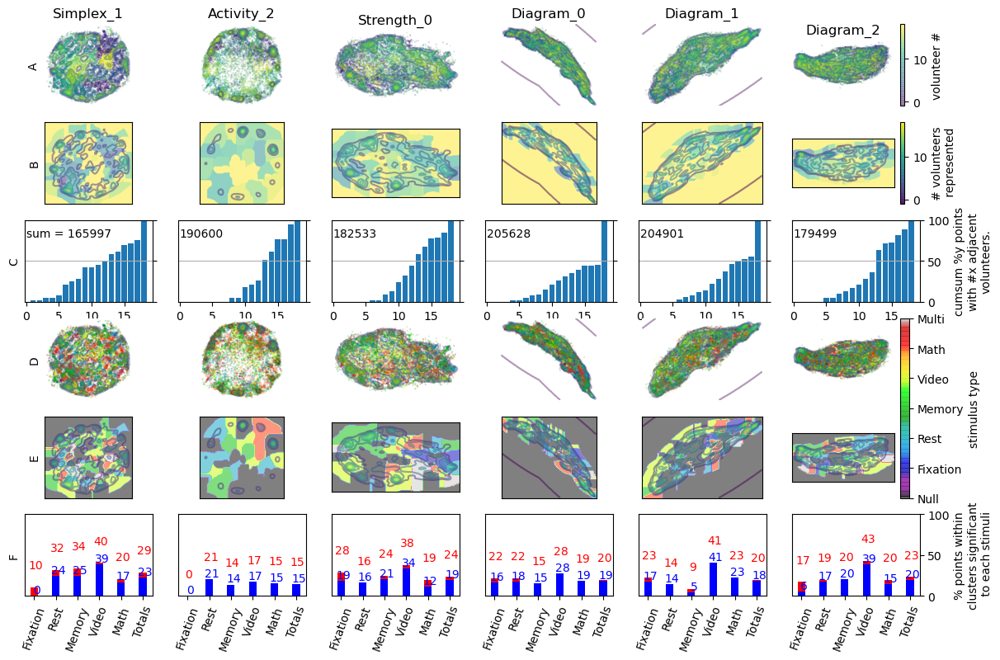

In [87]:

# Do the plots

name = './figures/' + savename + '_H' + str(dim) + '.png'
fig = plt.figure(num = dim,figsize=[2*7,2*4.5])

maxVBarOut = np.max(list([vBarOut[clbl].astype(int)] for clbl in vBarOut))

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    
    ax = plt.subplot(6, 6, 1+i) 
    X , Y, c, s = [], [], [], []
    for nv in range(Nv):        
        X.append(h3[condition_label][nv][:,0])
        Y.append(h3[condition_label][nv][:,1])
        c.append(cv[nv])
        s.append((ct[nv]!=-11).astype('int')*1)
    ppl = plt.scatter(np.concatenate(Y).ravel(),-np.concatenate(X).ravel(),
                c=np.concatenate(c).ravel(),s=np.concatenate(s).ravel(),
                marker='.',alpha=0.2,cmap='viridis',vmin=-1,vmax=mxv1)
    #cnt = ax.contour(yy[condition_label],-xx[condition_label], F[condition_label], alpha=0.3)
    ax.contour(yy[condition_label],-xx[condition_label],F[condition_label], alpha=0.4, linestyles='-')
    ax.set_aspect('equal','box')            
    if i==5:
        cbar = plt.colorbar(ax=[ax])
        cbar.ax.set_ylabel('volunteer #')
    if i==0:
        ax.set_ylabel('A')
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.set_title(condition_label)


    ax = plt.subplot(6, 6, 7+i) 
    img = ax.imshow(Nv-v_ImgOuts[condition_label], cmap='viridis',alpha=0.5,vmin=-1,vmax=mxv1)      
    #cbar.set_ticks( [-1] + list(types_cv) + [mxv1] )
    #cbar.ax.set_xticklabels(['None'] + list('Vol_{}'.format(v) for v in types_cv) + ['Multi'], rotation=90)
    ax.contour(F[condition_label], alpha=0.5)
    #plt.suptitle( (savename + '\n' + 'Dim {} | nVol {}'.format( dim, Nv) + '\n' + 'ExpSig {:.3e} | VolSig {:.3e} | bandwidth {:.2f}'.format( esig[condition_label],vsig[condition_label],kFactor[condition_label]) ) )        
    if i==5:
        cbar = plt.colorbar(img, ax=ax)
        cbar.ax.set_ylabel('# volunteers\n represented')
        #ax.set_ylabel('Volnt. clusters')
    if i==0:
        ax.set_ylabel('B')
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    
    
    ax = plt.subplot(6, 6, 13+i)     
    labels = types_cv
    x = np.arange(len(labels))+1  # the label locations
    #width = 0.35  # the width of the bars
    v_frac = np.cumsum(vBarOut[condition_label][::-1].astype(int))
    v_frac2 = v_frac/np.max(v_frac)*100
    v_num = np.sum(np.multiply(vBarOut[condition_label][::-1],np.arange(1,19))).astype('int')
    rects1 = ax.bar(x , v_frac2)#, width, color='r')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylim(bottom=0, top=100)
    ax.set_xticks([0,5,10,15])
    ax.grid(b=True,which='both',axis='y')    
    if i == 5:
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        ax.set_ylabel('cumsum %y points\nwith #x adjacent\nvolunteers.')        
    else:        
        ax.yaxis.tick_right()
        ax.set_yticklabels([])    
    if i==0:
        ax.yaxis.set_label_position("left")
        ax.set_ylabel('C')
        ax.text(0,80,'sum = ' + str(v_num))
    else:
        ax.text(0,80,str(v_num))
    
    
    ax = plt.subplot(6, 6, 19+i) 
    X , Y, c, s = [], [], [], []
    for nv in range(Nv):        
        X.append(h3[condition_label][nv][:,0])
        Y.append(h3[condition_label][nv][:,1])
        c.append(ce[nv].ravel())
        s.append((ce[nv]!=-11).astype('int')*1)
    ppl = plt.scatter(np.concatenate(Y).ravel(),-np.concatenate(X).ravel(),
                c=np.concatenate(c).ravel(),s=np.concatenate(s).ravel(),
                marker='.',alpha=0.2,cmap='nipy_spectral',vmin=0,vmax=mxe1)
    #cnt = ax.contour(yy[condition_label], -xx[condition_label], F[condition_label], alpha=0.3)
    ax.contour(yy[condition_label],-xx[condition_label],F[condition_label], alpha=0.4, linestyles='-')
    if i==5:        
        axs = []
        axs.append(ax)
    if i==0:
        ax.set_ylabel('D')
    ax.set_aspect('equal','box')     
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    
    
    ax = plt.subplot(6, 6, 25+i) 
    img = ax.imshow(e_ImgOuts[condition_label], cmap='nipy_spectral',alpha=0.5,vmin=0,vmax=mxe1)
    ax.contour(F[condition_label], alpha=0.5)        
    if i==5:
        axs.append(ax)
        cbar = plt.colorbar(img, ax=axs)
        cbar.set_ticks([0] + list(types_ce) + [mxe1])
        cbar.ax.set_yticklabels( goodStates + ['Multi'])
        cbar.ax.set_ylabel('stimulus type')
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    if i==0:
        ax.set_ylabel('E')

    
    ax = plt.subplot(6, 6, 31+i)     
    labels = goodStates[1:]
    labels.append('Totals')
    x = np.arange(len(labels))  # the label locations
    width = 0.35  # the width of the bars
    e_frac_full = list(barChart_full[condition_label][e]/np.sum(CE==e)*100 for e in types_ce)
    tot_full = np.sum([barChart_full[condition_label][e] for e in barChart_full[condition_label]])/len(CE)*100
    e_frac_full.append(tot_full)
    e_frac = list(barChart[condition_label][e]/np.sum(CE==e)*100 for e in types_ce)
    tot = np.sum([barChart[condition_label][e] for e in barChart[condition_label]])/len(CE)*100
    e_frac.append(tot)
    rects1 = ax.bar(x , e_frac_full, width, color='r')
    rects2 = ax.bar(x , e_frac, width, color='b')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    if i == 5:
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        ax.set_ylabel('% points within\nclusters significant\n to each stimuli')        
    else:
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        ax.set_yticks([],[])
    if i==0:
        ax.yaxis.set_label_position("left")
        ax.set_ylabel('F')
    #ax.set_title(( savename + 'Dim {} | nVol {}'.format( dim,Nv) ))
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation = 70)     
    ax.set_ylim(bottom=0, top=100)
    for rect in rects1:
        height = rect.get_height()
        ax.annotate('{:.0f}'.format(height),
                        xy=(rect.get_x() + rect.get_width(), min(80,height+20)),
                        xytext=(-2, 0),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom', c='r')
    for rect in rects2:
        height = rect.get_height()
        ax.annotate('{:.0f}'.format(height),
                        xy=(rect.get_x() + rect.get_width(), height),
                        xytext=(-1, 0),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom', c='b')
    
    #autolabel(rects1)
    #autolabel(rects2)
    
    
    
#fig.tight_layout()    
#plt.savefig('/home/Jacob/Figure1_Activity.png')
plt.show()


In [ ]:
# Initialize data Mat            
dataMat = {}
for metric in metrics:
    print('Current metric is {}'.format(metric))
    for dim in range(maxdim+1):
        dataMat[dim] = np.full([lan,lan],1000.0)
        dataMat[dim][np.diag_indices(lan)] = 0

    locBeg = saveloc + '{}AllDist_HN/Begun/'.format(metric)
    makedirs(locBeg ,exist_ok=True)
    begun = p_utils.getSecondList(locBeg)

    locFin = saveloc + '{}AllDist_HN/Finished/'.format(metric)
    makedirs(locFin ,exist_ok=True)
    finished = p_utils.getSecondList(locFin)

# Load distances
try:

    print('Pulling existing save data')
    locEnd = saveloc + '{}AllDist_HN/Saved/'.format(metric)
    file = locEnd + 'aggMatrix.pkl'
    with open(file, 'rb') as loadfile:
        dataMat = pickle.load(loadfile)

except FileNotFound:
    for metric in metrics:
        for fin in tqdm(finished,desc='Load data'):
            fname = locFin + fin + '.npy'
            tempD = np.load(fname)
            fname = locBeg + fin + '.npy'
            otherInds = np.load(fname)
            if len(tempD):
                for dim in range(maxdim+1):
                    try:
                        dataMat[dim][allNames_dict[fin],otherInds] = tempD[:,dim].ravel()
                        dataMat[dim][otherInds,allNames_dict[fin]] = tempD[:,dim].ravel()
                    except ValueError:
                        print([dim, ': ', fname, tempD.shape, otherInds.shape])


/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:35: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the param

/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:106: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:107: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:123: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:124: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the p

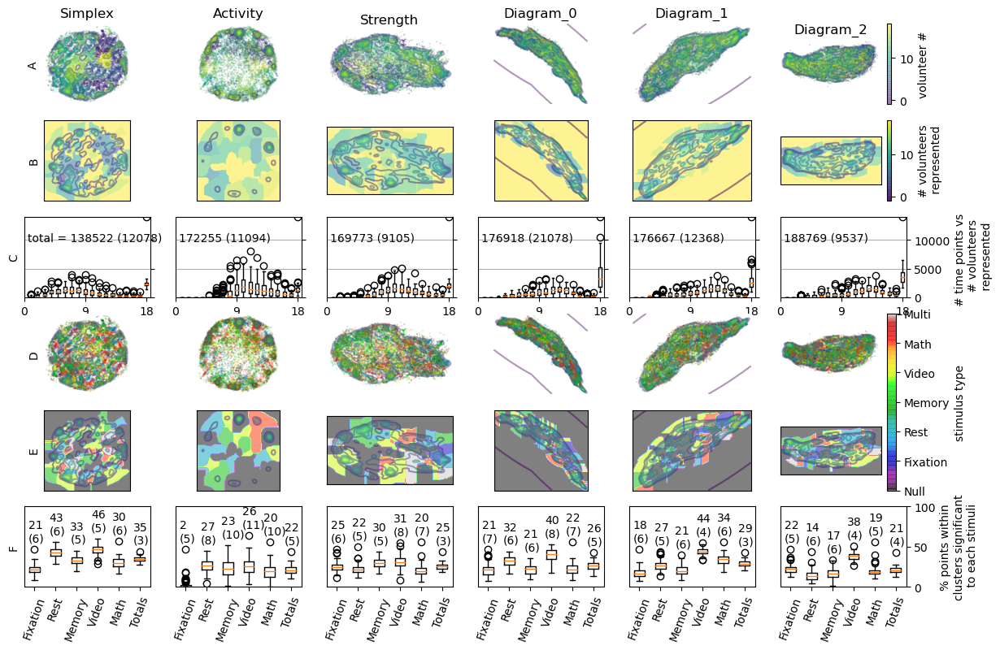

In [530]:
# Do the plots

name = './figures/' + savename + '_H' + str(dim) + '.png'
fig = plt.figure(num = dim,figsize=[2*7,2*4.5])

maxVBarOut = np.max(list([vBarOut[clbl].astype(int)] for clbl in vBarOut))

mxVBarMat = 0
for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    temp = np.max(np.array([ ra['vBarOut'][condition_label] for ra in results_array]))
    mxVBarMat = max(mxVBarMat,temp)

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    
    ax = plt.subplot(6, 6, 1+i) 
    X , Y, c, s = [], [], [], []
    for nv in range(Nv):        
        X.append(h3[condition_label][nv][:,0])
        Y.append(h3[condition_label][nv][:,1])
        c.append(cv[nv])
        s.append((ct[nv]!=-11).astype('int')*1)
    ppl = plt.scatter(np.concatenate(Y).ravel(),-np.concatenate(X).ravel(),
                c=np.concatenate(c).ravel(),s=np.concatenate(s).ravel(),
                marker='.',alpha=0.2,cmap='viridis',vmin=-1,vmax=mxv1)
    #cnt = ax.contour(yy[condition_label],-xx[condition_label], F[condition_label], alpha=0.3)
    ax.contour(yy[condition_label],-xx[condition_label],F[condition_label], alpha=0.4, linestyles='-')
    ax.set_aspect('equal','box')            
    if i==5:
        cbar = plt.colorbar(ax=[ax])
        cbar.ax.set_ylabel('volunteer #')
    if i==0:
        ax.set_ylabel('A')
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.set_title(condition_labels_all[condition_label])


    ax = plt.subplot(6, 6, 7+i) 
    img = ax.imshow(Nv-v_ImgOuts[condition_label], cmap='viridis',alpha=0.5,vmin=-1,vmax=mxv1)      
    #cbar.set_ticks( [-1] + list(types_cv) + [mxv1] )
    #cbar.ax.set_xticklabels(['None'] + list('Vol_{}'.format(v) for v in types_cv) + ['Multi'], rotation=90)
    ax.contour(F[condition_label], alpha=0.5)
    #plt.suptitle( (savename + '\n' + 'Dim {} | nVol {}'.format( dim, Nv) + '\n' + 'ExpSig {:.3e} | VolSig {:.3e} | bandwidth {:.2f}'.format( esig[condition_label],vsig[condition_label],kFactor[condition_label]) ) )        
    if i==5:
        cbar = plt.colorbar(img, ax=ax)
        cbar.ax.set_ylabel('# volunteers\n represented')
        #ax.set_ylabel('Volnt. clusters')
    if i==0:
        ax.set_ylabel('B')
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    
    
    ax = plt.subplot(6, 6, 13+i)     
    labels = types_cv
    x = np.arange(len(labels))+1  # the label locations
    #width = 0.35  # the width of the bars
    vBarMatrix = np.array([ ra['vBarOut'][condition_label] for ra in results_array])
    vBarSum = np.array( [ np.sum(np.multiply(
        np.arange(Nv,0,-1),ra['vBarOut'][condition_label])) for ra in results_array] )        
    rects1 = ax.boxplot(vBarMatrix[:,::-1])#, width, color='r')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylim(bottom=0, top=mxVBarMat)
    ax.set_xticks([0,9,18])
    ax.set_xticklabels([0,9,18])
    ax.grid(b=True,which='both',axis='y')    
    if i == 5:
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        ax.set_ylabel('# time points vs \n # volunteers\n represented')        
    else:        
        ax.yaxis.tick_right()
        ax.set_yticklabels([])    
    if i==0:
        ax.yaxis.set_label_position("left")
        ax.set_ylabel('C')
        ax.text(0.5,mxVBarMat*0.7,'total = {} ({})'.format(int(np.mean(vBarSum)), int(np.std(vBarSum))) )
    else:
        ax.text(0.5,mxVBarMat*0.7,'{} ({})'.format(int(np.mean(vBarSum)), int(np.std(vBarSum))))
    
    
    ax = plt.subplot(6, 6, 19+i) 
    X , Y, c, s = [], [], [], []
    for nv in range(Nv):        
        X.append(h3[condition_label][nv][:,0])
        Y.append(h3[condition_label][nv][:,1])
        c.append(ce[nv].ravel())
        s.append((ce[nv]!=-11).astype('int')*1)
    ppl = plt.scatter(np.concatenate(Y).ravel(),-np.concatenate(X).ravel(),
                c=np.concatenate(c).ravel(),s=np.concatenate(s).ravel(),
                marker='.',alpha=0.2,cmap='nipy_spectral',vmin=0,vmax=mxe1)
    #cnt = ax.contour(yy[condition_label], -xx[condition_label], F[condition_label], alpha=0.3)
    ax.contour(yy[condition_label],-xx[condition_label],F[condition_label], alpha=0.4, linestyles='-')
    if i==5:        
        axs = []
        axs.append(ax)
    if i==0:
        ax.set_ylabel('D')
    ax.set_aspect('equal','box')     
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    
    
    ax = plt.subplot(6, 6, 25+i) 
    img = ax.imshow(e_ImgOuts[condition_label], cmap='nipy_spectral',alpha=0.5,vmin=0,vmax=mxe1)
    ax.contour(F[condition_label], alpha=0.5)        
    if i==5:
        axs.append(ax)
        cbar = plt.colorbar(img, ax=axs)
        cbar.set_ticks([0] + list(types_ce) + [mxe1])
        cbar.ax.set_yticklabels( goodStates + ['Multi'])
        cbar.ax.set_ylabel('stimulus type')
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    if i==0:
        ax.set_ylabel('E')

    
    ax = plt.subplot(6, 6, 31+i)     
    labels = goodStates[1:]
    labels.append('Totals')
    x = np.arange(len(labels))+1  # the label locations
    width = 0.35  # the width of the bars    
    barchart = []
    for ra in results_array:
        barchart.append([])
        for e in ra['barChart_full'][condition_label]:
            barchart[-1].append(ra['barChart_full'][condition_label][e]/np.sum(CE==e)*100)
        barchart[-1].append(np.sum(list(ra['barChart_full'][condition_label].values()))/len(CE)*100)
    barchart = np.array(barchart)
    rects = ax.boxplot(barchart)
    # Add some text for labels, title and custom x-axis tick labels, etc.
    if i == 5:
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        ax.set_ylabel('% points within\nclusters significant\n to each stimuli')        
    else:
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        ax.set_yticks([],[])
    if i==0:
        ax.yaxis.set_label_position("left")
        ax.set_ylabel('F')
    #ax.set_title(( savename + 'Dim {} | nVol {}'.format( dim,Nv) ))
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation = 70)     
    ax.set_ylim(bottom=0, top=100)
    for xinds in x:
        mean_bc = int(np.round(np.mean(barchart[:,xinds-1])))
        std_bc = int(np.round(np.std(barchart[:,xinds-1])))
        max_bc = np.max(barchart[:,xinds-1])
        ax.text(xinds-0.3,max_bc+10, '{}\n({})'.format(mean_bc,std_bc))
    
#fig.tight_layout()    
#plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure2.png')
plt.show()


In [ ]:
for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    temp = np.max(np.array([ ra['vBarOut'][condition_label] for ra in results_array]))

In [543]:
sum(CE==5)

4320

In [553]:
for ri, ra in enumerate(results_array):
    print([ri,ra['barChart_full'][condition_label][5]/sumCE[5]]) 

[0, 0.14930555555555555]
[1, 0.18287037037037038]
[2, 0.26435185185185184]
[3, 0.21921296296296297]
[4, 0.2439814814814815]
[5, 0.1400462962962963]
[6, 0.1935185185185185]
[7, 0.16550925925925927]
[8, 0.15393518518518517]
[9, 0.12777777777777777]
[10, 0.17685185185185184]
[11, 0.21481481481481482]
[12, 0.16319444444444445]
[13, 0.1935185185185185]
[14, 0.22083333333333333]
[15, 0.18009259259259258]
[16, 0.13287037037037036]
[17, 0.14074074074074075]
[18, 0.12523148148148147]
[19, 0.17175925925925925]
[20, 0.13935185185185187]
[21, 0.19212962962962962]
[22, 0.16458333333333333]
[23, 0.14560185185185184]
[24, 0.20092592592592592]
[25, 0.18773148148148147]
[26, 0.2310185185185185]
[27, 0.19837962962962963]
[28, 0.21944444444444444]
[29, 0.1597222222222222]
[30, 0.16435185185185186]
[31, 0.2023148148148148]
[32, 0.1849537037037037]
[33, 0.19768518518518519]
[34, 0.17430555555555555]
[35, 0.20555555555555555]
[36, 0.1648148148148148]
[37, 0.2064814814814815]
[38, 0.20625]
[39, 0.27916666666

/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:35: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:82: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:83: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the param

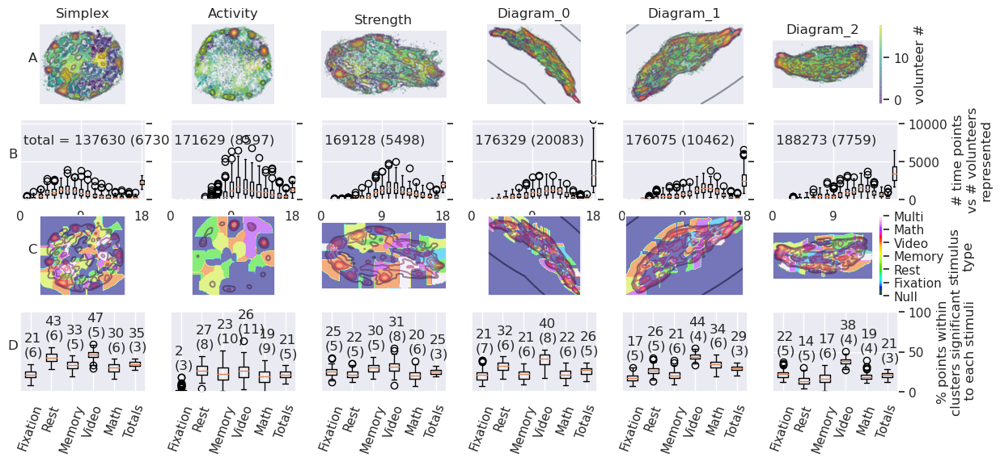

In [560]:
# Do the plots

name = './figures/' + savename + '_H' + str(dim) + '.png'
fig = plt.figure(num = dim,figsize=[2*7,2*4.5])

maxVBarOut = np.max(list([vBarOut[clbl].astype(int)] for clbl in vBarOut))

mxVBarMat = 0
for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    temp = np.max(np.array([ ra['vBarOut'][condition_label] for ra in results_array]))
    mxVBarMat = max(mxVBarMat,temp)

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    
    ax = plt.subplot(6, 6, 13+i) 
    X , Y, c, s = [], [], [], []
    for nv in range(Nv):        
        X.append(h3[condition_label][nv][:,0])
        Y.append(h3[condition_label][nv][:,1])
        c.append(cv[nv])
        s.append((ct[nv]!=-11).astype('int')*1)
    ppl = plt.scatter(np.concatenate(Y).ravel(),-np.concatenate(X).ravel(),
                c=np.concatenate(c).ravel(),s=np.concatenate(s).ravel(),
                marker='.',alpha=0.2,cmap='viridis',vmin=-1,vmax=mxv1)
    #cnt = ax.contour(yy[condition_label],-xx[condition_label], F[condition_label], alpha=0.3)
    ax.contour(yy[condition_label],-xx[condition_label],F[condition_label], alpha=0.4, linestyles='-')
    ax.set_aspect('equal','box')            
    if i==5:
        cbar = plt.colorbar(ax=[ax])
        cbar.ax.set_ylabel('volunteer #')
    if i==0:
        ax.set_ylabel('A ',rotation=0)
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.set_title(condition_labels_all[condition_label])

    ax = plt.subplot(6, 6, 19+i) 
    labels = types_cv
    x = np.arange(len(labels))+1  # the label locations
    #width = 0.35  # the width of the bars
    vBarMatrix = np.array([ ra['vBarOut'][condition_label] for ra in results_array])
    vBarSum = np.array( [ np.sum(np.multiply(
        np.arange(Nv,0,-1),ra['vBarOut'][condition_label])) for ra in results_array] )        
    rects1 = ax.boxplot(vBarMatrix[:,::-1])#, width, color='r')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylim(bottom=0, top=mxVBarMat)
    ax.set_xticks([0,9,18])
    ax.set_xticklabels([0,9,18])
    ax.grid(b=True,which='both',axis='y')    
    if i == 5:
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        ax.set_ylabel('# time points\nvs # volunteers\nrepresented')        
        ax.set_xticks([0,9])
        ax.set_xticklabels([0,9])
    else:        
        ax.yaxis.tick_right()
        ax.set_yticklabels([])    
    if i==0:
        ax.yaxis.set_label_position("left")
        ax.set_ylabel('B ', rotation=0)
        ax.text(0.5,mxVBarMat*0.7,'total = {} ({})'.format(int(np.mean(vBarSum)), int(np.std(vBarSum))) )
    else:
        ax.text(0.5,mxVBarMat*0.7,'{} ({})'.format(int(np.mean(vBarSum)), int(np.std(vBarSum))))
    
    ax = plt.subplot(6, 6, 25+i) 
    axs = []
    img = ax.imshow(e_ImgOuts[condition_label], cmap='gist_ncar',alpha=0.5,vmin=0,vmax=mxe1)
    ax.contour(F[condition_label], alpha=0.5)        
    if i==5:
        axs.append(ax)
        cbar = plt.colorbar(img, ax=axs)
        cbar.set_ticks([0] + list(types_ce) + [mxe1])
        cbar.ax.set_yticklabels( goodStates + ['Multi'])
        cbar.ax.set_ylabel('stimulus\ntype')
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    if i==0:
        ax.set_ylabel('C ', rotation=0)
    
    ax = plt.subplot(6, 6, 31+i)     
    labels = goodStates[1:]
    labels.append('Totals')
    x = np.arange(len(labels))+1  # the label locations
    width = 0.35  # the width of the bars    
    barchart = []
    for ra in results_array:
        barchart.append([])
        for e in ra['barChart_full'][condition_label]:
            barchart[-1].append(ra['barChart_full'][condition_label][e]/np.sum(CE==e)*100)
        barchart[-1].append(np.sum(list(ra['barChart_full'][condition_label].values()))/len(CE)*100)
    barchart = np.array(barchart)
    rects = ax.boxplot(barchart)
    # Add some text for labels, title and custom x-axis tick labels, etc.
    if i == 5:
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        ax.set_ylabel('% points within\nclusters significant\n to each stimuli')        
    else:
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        ax.set_yticks([],[])
    if i==0:
        ax.yaxis.set_label_position("left")
        ax.set_ylabel('D ', rotation=0)
    #ax.set_title(( savename + 'Dim {} | nVol {}'.format( dim,Nv) ))
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation = 70)     
    ax.set_ylim(bottom=0, top=100)
    for xinds in x:
        mean_bc = int(np.round(np.mean(barchart[:,xinds-1])))
        std_bc = int(np.round(np.std(barchart[:,xinds-1])))
        max_bc = np.max(barchart[:,xinds-1])
        ax.text(xinds-0.3,max_bc+10, '{}\n({})'.format(mean_bc,std_bc))
    
#fig.tight_layout()    
plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure2_Poster.png')
plt.show()


In [582]:
plt.style.use('default')

In [590]:
goodStates[0] = 'None'

In [27]:
2

2

/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:42: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:60: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the param

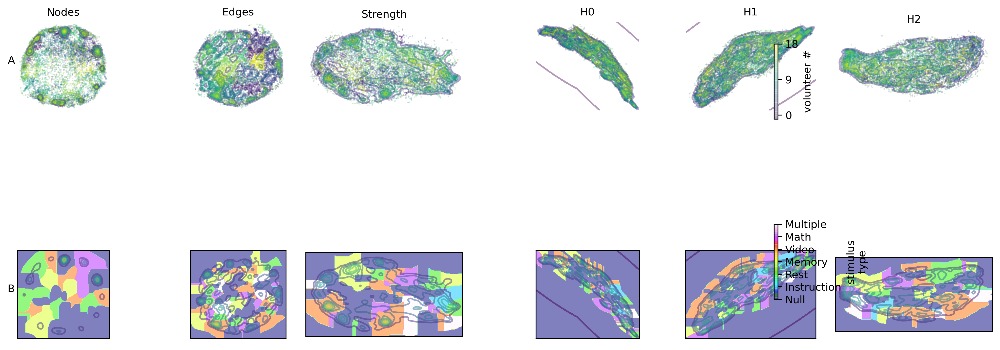

In [204]:
# Do the plots

name = './figures/' + savename + '_H' + str(dim) + '.png'
fig = plt.figure(num = dim,figsize=[7*2,2*4.5], dpi=300)

axA = []
axB = []

maxVBarOut = np.max(list([vBarOut[clbl].astype(int)] for clbl in vBarOut))

mxVBarMat = 0
for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    temp = np.max(np.array([ ra['vBarOut'][condition_label] for ra in results_array]))
    mxVBarMat = max(mxVBarMat,temp)

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    
    ax = plt.subplot(6, 6, 13+i) 
    plt.set_cmap('viridis')
    X , Y, c, s = [], [], [], []
    for nv in range(Nv):        
        X.append(h3[condition_label][nv][:,0])
        Y.append(h3[condition_label][nv][:,1])
        c.append(cv[nv])
        s.append((ct[nv]!=-11).astype('int')*1)
    ppl = plt.scatter(np.concatenate(Y).ravel(),-np.concatenate(X).ravel(),
                c=np.concatenate(c).ravel(),s=np.concatenate(s).ravel(),
                marker='.',alpha=0.2,cmap='viridis',vmin=-1,vmax=mxv1)
    #cnt = ax.contour(yy[condition_label],-xx[condition_label], F[condition_label], alpha=0.3)
    ax.contour(yy[condition_label],-xx[condition_label],F[condition_label], alpha=0.4, linestyles='-')
    ax.set_aspect('equal','box')            
    axA.append(ax)
    if i==5:
        cbar = plt.colorbar(ax=axA)
        cbar.ax.set_ylabel('volunteer #')
        cbar.set_ticks([0,9,18], [0,9,18])
    if i==0:
        ax.set_ylabel('A ',rotation=0)
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.set_title(condition_labels_all[condition_label], fontsize=10)

    
    ax = plt.subplot(6, 6, 25+i)  
    axB.append(ax)    
    img = ax.imshow(e_ImgOuts[condition_label], cmap='gist_ncar',alpha=0.5,vmin=0,vmax=mxe1)
    ax.contour(F[condition_label], alpha=0.5)        
    if i==5:
        cbar = plt.colorbar(img, ax=axB)
        cbar.set_ticks([0] + list(types_ce) + [mxe1])
        cbar.ax.set_yticklabels( goodStates + ['Multiple'])
        cbar.ax.set_ylabel('stimulus\ntype')
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    if i==0:
        ax.set_ylabel('B ', rotation=0)
    
#fig.tight_layout()    
plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresAugust/Figure2_SampleEmbed.png')
plt.show()


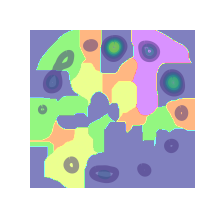

In [214]:
# Do the plots

fig = plt.figure(num = 100, dpi=300)

axA = []
axB = []

maxVBarOut = np.max(list([vBarOut[clbl].astype(int)] for clbl in vBarOut))

mxVBarMat = 0
for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    temp = np.max(np.array([ ra['vBarOut'][condition_label] for ra in results_array]))
    mxVBarMat = max(mxVBarMat,temp)

condition=conditions[0]

condition_label = '{}_{}'.format(*condition)

ax = plt.subplot(6, 6, 1) 
    
axB.append(ax)    
img = ax.imshow(e_ImgOuts[condition_label], cmap='gist_ncar',alpha=0.5,vmin=0,vmax=mxe1)
ax.contour(F[condition_label], alpha=0.5)        

ax.axis('off')

plt.savefig('./figuresAugust/Methods_Projection.png',dpi=300, transparent=True)
plt.show()


In [22]:
vBar_list = []

for ri, ra in enumerate(results_array):
    for condition in conditions:
        condition_label = '{}_{}'.format(*conditions[condition])        
        temp = ra['vBarOut'][condition_label]
        for vi, vn in enumerate(temp[::-1], start=1):
            vBar_list.append([ri, condition_labels_all[condition_label], vi, vn/len(CE)])            
        vBar_list.append([ri, condition_labels_all[condition_label], 19, temp[0]/len(CE)])
        #vBar_list.append([ri, condition_label, 20, temp[0]])
vbframe = pd.DataFrame(data=vBar_list,columns=['iter','Condition','# represented volunteers','% time points'])

In [708]:
vn


5018.0

In [23]:
vbframe.loc[1,:]

iter                            0
Condition                   Nodes
# represented volunteers        2
% time points                   0
Name: 1, dtype: object

In [20]:
import seaborn as sns; sns.set()
#fmri = sns.load_dataset("fmri")

In [91]:
fmri

,subject,timepoint,event,region,signal
0,s13,18,stim,parietal,-0.017552
1,s5,14,stim,parietal,-0.080883
2,s12,18,stim,parietal,-0.081033
3,s11,18,stim,parietal,-0.046134
4,s10,18,stim,parietal,-0.037970
...,...,...,...,...,...
1059,s0,8,cue,frontal,0.018165
1060,s13,7,cue,frontal,-0.029130
1061,s12,7,cue,frontal,-0.004939
1062,s11,7,cue,frontal,-0.025367


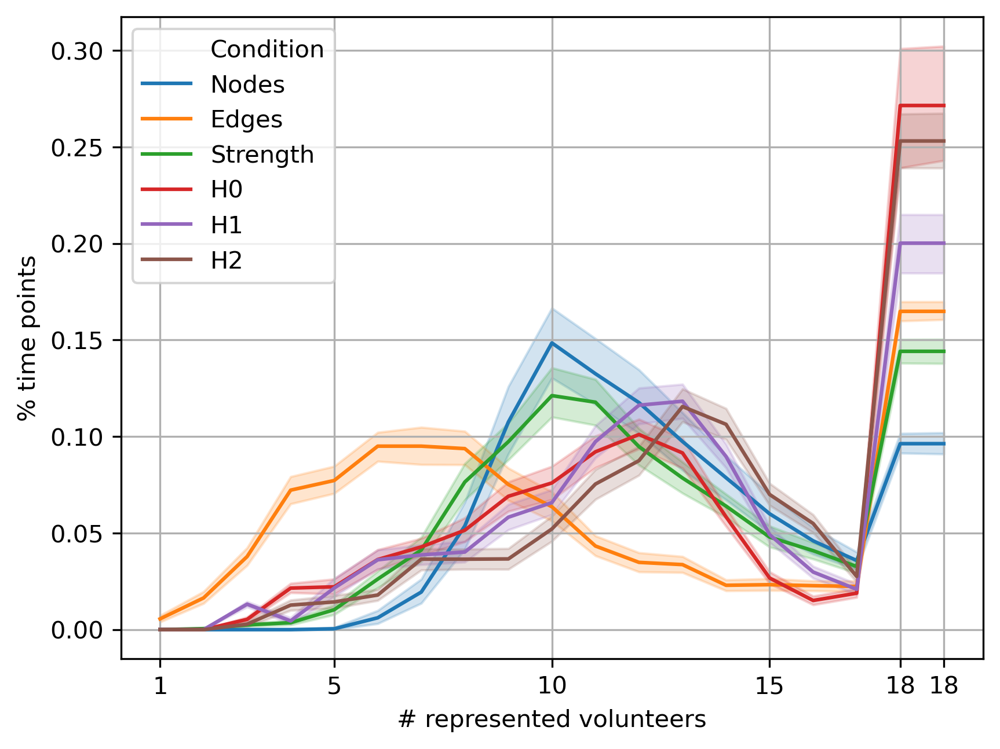

In [217]:
fig = plt.figure(dpi=300)

ax = sns.lineplot(x="# represented volunteers", y="% time points", hue="Condition", data=vbframe)
plt.xticks([1,5,10,15,18,19],[1,5,10,15,18,18])
plt.grid(True)

plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresAugust/Figure3_Volunteers.png')

plt.show()

In [607]:
help(sns.lineplot)

Help on function lineplot in module seaborn.relational:

lineplot(x=None, y=None, hue=None, size=None, style=None, data=None, palette=None, hue_order=None, hue_norm=None, sizes=None, size_order=None, size_norm=None, dashes=True, markers=None, style_order=None, units=None, estimator='mean', ci=95, n_boot=1000, seed=None, sort=True, err_style='band', err_kws=None, legend='brief', ax=None, **kwargs)
    Draw a line plot with possibility of several semantic groupings.
    
    The relationship between ``x`` and ``y`` can be shown for different subsets
    of the data using the ``hue``, ``size``, and ``style`` parameters. These
    parameters control what visual semantics are used to identify the different
    subsets. It is possible to show up to three dimensions independently by
    using all three semantic types, but this style of plot can be hard to
    interpret and is often ineffective. Using redundant semantics (i.e. both
    ``hue`` and ``style`` for the same variable) can be helpfu

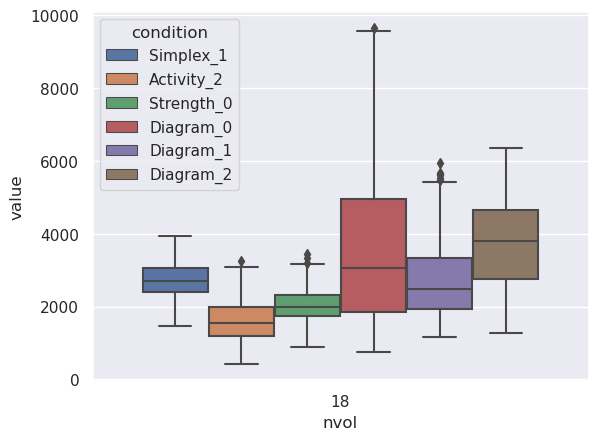

In [121]:
sns.boxplot(data=vbframe.loc[vbframe.loc[:,'nvol']==18,:], hue='condition', y="value", x='nvol')

In [ ]:
results_arr

In [174]:
help(sns.boxenplot)

Help on function boxenplot in module seaborn.categorical:

boxenplot(x=None, y=None, hue=None, data=None, order=None, hue_order=None, orient=None, color=None, palette=None, saturation=0.75, width=0.8, dodge=True, k_depth='proportion', linewidth=None, scale='exponential', outlier_prop=None, showfliers=True, ax=None, **kwargs)
    Draw an enhanced box plot for larger datasets.
    
    This style of plot was originally named a "letter value" plot because it
    shows a large number of quantiles that are defined as "letter values".  It
    is similar to a box plot in plotting a nonparametric representation of a
    distribution in which all features correspond to actual observations. By
    plotting more quantiles, it provides more information about the shape of
    the distribution, particularly in the tails. For a more extensive
    explanation, you can read the paper that introduced the plot:
    
    https://vita.had.co.nz/papers/letter-value-plot.html
    
    
    Input data can be 

In [550]:
sum(sumCE)

13986

In [28]:
def cohend(d1, d2):
    # calculate the size of samples
    n1, n2 = len(d1), len(d2)
    # calculate the variance of the samples
    s1, s2 = np.var(d1, ddof=1), np.var(d2, ddof=1)
    # calculate the pooled standard deviation
    s = np.sqrt(((n1 - 1) * s1 + (n2 - 1) * s2) / (n1 + n2 - 2))
    # calculate the means of the samples
    u1, u2 = np.mean(d1), np.mean(d2)
    # calculate the effect size
    return (u1 - u2) / s

In [31]:
goodStates

['Null', 'Instruction', 'Rest', 'Memory', 'Video', 'Math']

In [67]:
rands = ['No\nrandomization.\n',
        'Identify\nany\nsignificant\nclusters,\nand then\nrandomize\nlabels.\n',
        'Randomize\nlabels,\nand then\nidentify\nany\nsignificant\nclusters.']


eBar_list = []

sumCE = []
for e in range(6):
    sumCE.append(np.sum(CE==e))
    
for ri, ra in enumerate(results_array):
    for condition in conditions:
        condition_label = '{}_{}'.format(*conditions[condition])        
        
        temp = ra['barChart_full'][condition_label]
        tempsum = 0
        for ei in temp:
            eBar_list.append([ri, condition_labels_all[condition_label], goodStates[ei],
                              temp[ei]/sumCE[ei]*100, rands[0]])            
            tempsum+=temp[ei]
        eBar_list.append([ri, condition_labels_all[condition_label], 'All',
                          tempsum/len(CE)*100, rands[0]])            
        
        temp = ra['barChart_randsub'][condition_label]
        tempsum = 0        
        for ei in temp:
            eBar_list.append([ri, condition_labels_all[condition_label], goodStates[ei],
                              temp[ei]/sumCE[ei]*100, rands[1]])            
            tempsum+=temp[ei]
        eBar_list.append([ri, condition_labels_all[condition_label], 'All',
                          tempsum/len(CE)*100, rands[1]])                    
        
        temp = ra['barChart_randtot'][condition_label]
        tempsum = 0        
        for ei in temp:
            eBar_list.append([ri, condition_labels_all[condition_label], goodStates[ei],
                              temp[ei]/sumCE[ei]*100, rands[2]])            
            tempsum+=temp[ei]
        eBar_list.append([ri, condition_labels_all[condition_label], 'All',
                          tempsum/len(CE)*100, rands[2]])            
        
ebframe = pd.DataFrame(data=eBar_list,columns=['iter','metric','stimulus','% of points','controls'])

In [107]:
cohens_list = {}
for stim in np.unique(ebframe.loc[:,'stimulus']):
    cohens_list[stim] = {}
    for met in np.unique(ebframe.loc[:,'metric']):
        
        locA = (ebframe.loc[:,'stimulus']==stim ).values & \
        (ebframe.loc[:,'metric']==met).values & \
        (ebframe.loc[:,'controls']==rands[0]).values
        
        locB = (ebframe.loc[:,'stimulus']==stim ).values & \
        (ebframe.loc[:,'metric']==met).values & \
        (ebframe.loc[:,'controls']==rands[1]).values
        
        cohens_list[stim][met] = cohend(ebframe.loc[:,'% of points'][locA],
                                       ebframe.loc[:,'% of points'][locB])

        

In [108]:
cohens_list

{'All': {'Edges': 6.1240773873853005,
  'H0': 2.4883364883330397,
  'H1': 4.545251376697769,
  'H2': 3.4087296114245116,
  'Nodes': 1.3545055874700211,
  'Strength': 3.553389963886905},
 'Instruction': {'Edges': 1.9246254795329876,
  'H0': 1.8935561090454758,
  'H1': 2.3935269569997284,
  'H2': 3.278024100269489,
  'Nodes': 0.22391504961222927,
  'Strength': 2.968702260264945},
 'Math': {'Edges': 2.0739374333205425,
  'H0': 1.3094182532009881,
  'H1': 2.315492854815863,
  'H2': 1.6811791189627538,
  'Nodes': 0.4455734269864615,
  'Strength': 1.0432546391817046},
 'Memory': {'Edges': 2.8748903971421673,
  'H0': 1.3509227556069194,
  'H1': 1.3861107227899951,
  'H2': 0.9432989843115235,
  'Nodes': 0.6028873704591993,
  'Strength': 2.003521455026794},
 'Rest': {'Edges': 4.74456906844889,
  'H0': 3.270182693067537,
  'H1': 2.8207188435254533,
  'H2': 1.3249507280666726,
  'Nodes': 1.5170491383501827,
  'Strength': 2.830435824301684},
 'Video': {'Edges': 5.661377287904339,
  'H0': 3.2029506

In [96]:
list(grid.axes[3].get_xticklabels())[0].get_text()

'Nodes'

In [114]:
'{:.3}'.format(cohens_list[ax.get_title().split('= ')[1]][bb.get_text()])

'3.41'

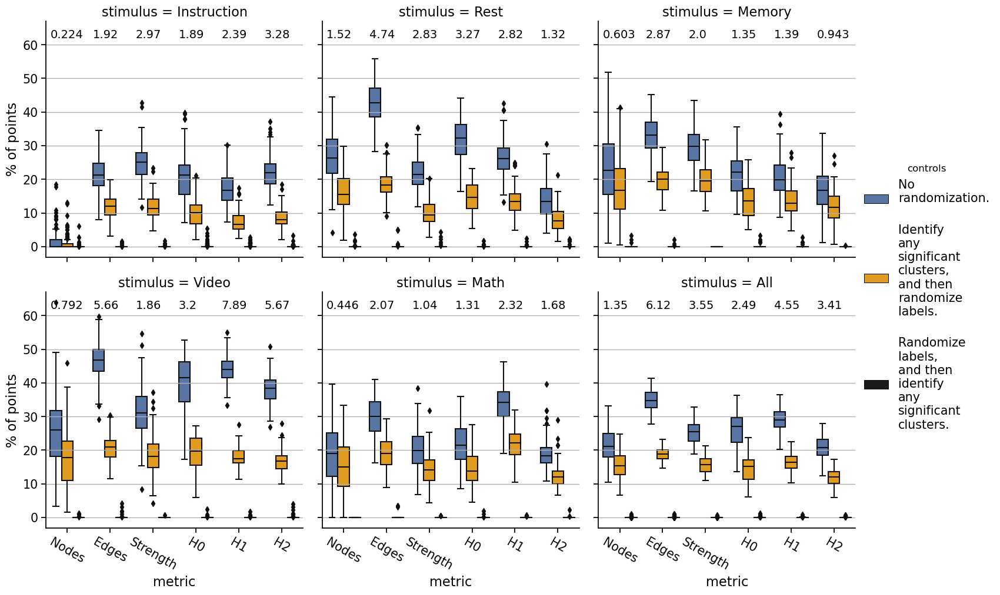

In [121]:
plt.style.use('default')
with sns.plotting_context("notebook",font_scale=1.35):
    grid = sns.catplot(x="metric", y="% of points", hue="controls", col='stimulus', kind='box',
                       data=ebframe, col_wrap=3, palette=['b','orange','k'])
    grid.set_xticklabels(rotation=-30)
    
for axi, ax in enumerate(grid.axes):
    for aa,bb in zip(list(grid.axes[3].get_xticks()), list(grid.axes[3].get_xticklabels())):
        this = '{:.3}'.format(cohens_list[ax.get_title().split('= ')[1]][bb.get_text()])
        ax.text(aa-0.4,62,this,fontsize=14)
    ax.grid(axis='y')
    
plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresAugust/Figure4_Experiments.png')

plt.show()

In [191]:
type(ax)

seaborn.axisgrid.FacetGrid

In [622]:
results_array[0].keys()

dict_keys(['vBarOut', 'barChart_full', 'vals'])

In [167]:
2

2

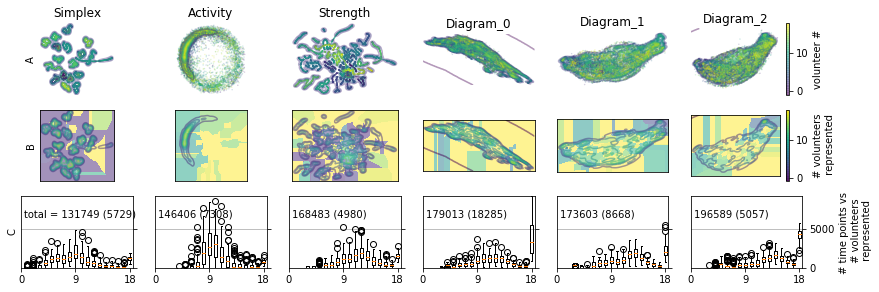

In [17]:
# Do the plots

name = './figures/' + savename + '_H' + str(dim) + '.png'
fig = plt.figure(num = dim,figsize=[2*7,1*4.5])

maxVBarOut = np.max(list([vBarOut[clbl].astype(int)] for clbl in vBarOut))

mxVBarMat = 0
for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    temp = np.max(np.array([ ra['vBarOut'][condition_label] for ra in results_array]))
    mxVBarMat = max(mxVBarMat,temp)

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    
    ax = plt.subplot(3, 6, 1+i) 
    X , Y, c, s = [], [], [], []
    for nv in range(Nv):        
        X.append(h3[condition_label][nv][:,0])
        Y.append(h3[condition_label][nv][:,1])
        c.append(cv[nv])
        s.append((ct[nv]!=-11).astype('int')*1)
    ppl = plt.scatter(np.concatenate(Y).ravel(),-np.concatenate(X).ravel(),
                c=np.concatenate(c).ravel(),s=np.concatenate(s).ravel(),
                marker='.',alpha=0.2,cmap='viridis',vmin=-1,vmax=mxv1)
    #cnt = ax.contour(yy[condition_label],-xx[condition_label], F[condition_label], alpha=0.3)
    ax.contour(yy[condition_label],-xx[condition_label],F[condition_label], alpha=0.4, linestyles='-')
    ax.set_aspect('equal','box')            
    if i==5:
        cbar = plt.colorbar(ax=[ax])
        cbar.ax.set_ylabel('volunteer #')
    if i==0:
        ax.set_ylabel('A')
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.set_title(condition_labels_all[condition_label])


    ax = plt.subplot(3, 6, 7+i) 
    img = ax.imshow(Nv-v_ImgOuts[condition_label], cmap='viridis',alpha=0.5,vmin=-1,vmax=mxv1)      
    #cbar.set_ticks( [-1] + list(types_cv) + [mxv1] )
    #cbar.ax.set_xticklabels(['None'] + list('Vol_{}'.format(v) for v in types_cv) + ['Multi'], rotation=90)
    ax.contour(F[condition_label], alpha=0.5)
    #plt.suptitle( (savename + '\n' + 'Dim {} | nVol {}'.format( dim, Nv) + '\n' + 'ExpSig {:.3e} | VolSig {:.3e} | bandwidth {:.2f}'.format( esig[condition_label],vsig[condition_label],kFactor[condition_label]) ) )        
    if i==5:
        cbar = plt.colorbar(img, ax=ax)
        cbar.ax.set_ylabel('# volunteers\n represented')
        #ax.set_ylabel('Volnt. clusters')
    if i==0:
        ax.set_ylabel('B')
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    
    
    ax = plt.subplot(3, 6, 13+i)     
    labels = types_cv
    x = np.arange(len(labels))+1  # the label locations
    #width = 0.35  # the width of the bars
    vBarMatrix = np.array([ ra['vBarOut'][condition_label] for ra in results_array])
    vBarSum = np.array( [ np.sum(np.multiply(
        np.arange(Nv,0,-1),ra['vBarOut'][condition_label])) for ra in results_array] )        
    rects1 = ax.boxplot(vBarMatrix[:,::-1])#, width, color='r')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylim(bottom=0, top=mxVBarMat)
    ax.set_xticks([0,9,18])
    ax.set_xticklabels([0,9,18])
    ax.grid(b=True,which='both',axis='y')    
    if i == 5:
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        ax.set_ylabel('# time points vs \n # volunteers\n represented')        
    else:        
        ax.yaxis.tick_right()
        ax.set_yticklabels([])    
    if i==0:
        ax.yaxis.set_label_position("left")
        ax.set_ylabel('C')
        ax.text(0.5,mxVBarMat*0.7,'total = {} ({})'.format(int(np.mean(vBarSum)), int(np.std(vBarSum))) )
    else:
        ax.text(0.5,mxVBarMat*0.7,'{} ({})'.format(int(np.mean(vBarSum)), int(np.std(vBarSum))))
    
        
#fig.tight_layout()    
#plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure2A.png')
plt.show()


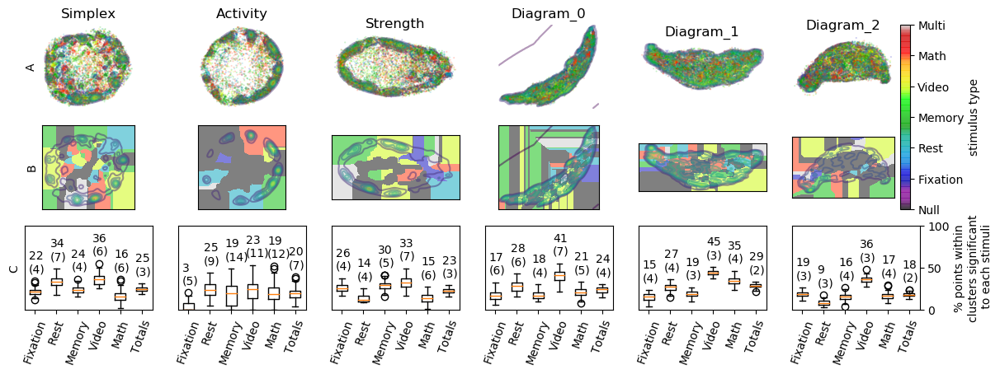

In [964]:

name = './figures/' + savename + '_H' + str(dim) + '.png'
fig = plt.figure(num = dim,figsize=[2*7,1*4.5])

maxVBarOut = np.max(list([vBarOut[clbl].astype(int)] for clbl in vBarOut))

mxVBarMat = 0
for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    temp = np.max(np.array([ ra['vBarOut'][condition_label] for ra in results_array]))
    mxVBarMat = max(mxVBarMat,temp)

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    
    ax = plt.subplot(3, 6, 1+i) 
    X , Y, c, s = [], [], [], []
    for nv in range(Nv):        
        X.append(h3[condition_label][nv][:,0])
        Y.append(h3[condition_label][nv][:,1])
        c.append(ce[nv].ravel())
        s.append((ce[nv]!=-11).astype('int')*1)
    ppl = plt.scatter(np.concatenate(Y).ravel(),-np.concatenate(X).ravel(),
                c=np.concatenate(c).ravel(),s=np.concatenate(s).ravel(),
                marker='.',alpha=0.2,cmap='nipy_spectral',vmin=0,vmax=mxe1)
    #cnt = ax.contour(yy[condition_label], -xx[condition_label], F[condition_label], alpha=0.3)
    ax.contour(yy[condition_label],-xx[condition_label],F[condition_label], alpha=0.4, linestyles='-')
    if i==5:        
        axs = []
        axs.append(ax)
    if i==0:
        ax.set_ylabel('A')
    ax.set_aspect('equal','box')     
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.set_title(condition_labels_all[condition_label])
    
    
    ax = plt.subplot(3, 6, 7+i) 
    img = ax.imshow(e_ImgOuts[condition_label], cmap='nipy_spectral',alpha=0.5,vmin=0,vmax=mxe1)
    ax.contour(F[condition_label], alpha=0.5)        
    if i==5:
        axs.append(ax)
        cbar = plt.colorbar(img, ax=axs)
        cbar.set_ticks([0] + list(types_ce) + [mxe1])
        cbar.ax.set_yticklabels( goodStates + ['Multi'])
        cbar.ax.set_ylabel('stimulus type')
    ax.set_xticks([],[])
    ax.set_yticks([],[])
    if i==0:
        ax.set_ylabel('B')

    
    ax = plt.subplot(3, 6, 13+i)     
    labels = goodStates[1:]
    labels.append('Totals')
    x = np.arange(len(labels))+1  # the label locations
    width = 0.35  # the width of the bars    
    barchart = []
    for ra in results_array:
        barchart.append([])
        for e in ra['barChart_full'][condition_label]:
            barchart[-1].append(ra['barChart_full'][condition_label][e]/np.sum(CE==e)*100)
        barchart[-1].append(np.sum(list(ra['barChart_full'][condition_label].values()))/len(CE)*100)
    barchart = np.array(barchart)
    rects = ax.boxplot(barchart)
    # Add some text for labels, title and custom x-axis tick labels, etc.
    if i == 5:
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        ax.set_ylabel('% points within\nclusters significant\n to each stimuli')        
    else:
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        ax.set_yticks([],[])
    if i==0:
        ax.yaxis.set_label_position("left")
        ax.set_ylabel('C')
    #ax.set_title(( savename + 'Dim {} | nVol {}'.format( dim,Nv) ))
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation = 70)     
    ax.set_ylim(bottom=0, top=100)
    for xinds in x:
        mean_bc = int(np.round(np.mean(barchart[:,xinds-1])))
        std_bc = int(np.round(np.std(barchart[:,xinds-1])))
        max_bc = np.max(barchart[:,xinds-1])
        ax.text(xinds-0.3,max_bc+10, '{}\n({})'.format(mean_bc,std_bc))
    
#fig.tight_layout()    
plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure2B.png')
plt.show()


In [186]:
x,max_bc+20

(array([1, 2, 3, 4, 5, 6]), 59.76851851851852)

In [185]:
ax.text(1,50,'r')

Text(1, 50, 'r')

In [183]:
help(ax.text)

Help on method text in module matplotlib.axes._axes:

text(x, y, s, fontdict=None, withdash=<deprecated parameter>, **kwargs) method of matplotlib.axes._subplots.AxesSubplot instance
    Add text to the axes.
    
    Add the text *s* to the axes at location *x*, *y* in data coordinates.
    
    Parameters
    ----------
    x, y : scalars
        The position to place the text. By default, this is in data
        coordinates. The coordinate system can be changed using the
        *transform* parameter.
    
    s : str
        The text.
    
    fontdict : dictionary, optional, default: None
        A dictionary to override the default text properties. If fontdict
        is None, the defaults are determined by your rc parameters.
    
    withdash : boolean, optional, default: False
        Creates a `~matplotlib.text.TextWithDash` instance instead of a
        `~matplotlib.text.Text` instance.
    
    Returns
    -------
    text : `.Text`
        The created `.Text` instance.
   

In [43]:
xx

5.276724890829695

In [58]:
plt.savefig('/home/Jacob/Figure1.png')

<Figure size 432x288 with 0 Axes>

In [36]:
e_frac

[18.75,
 32.36914600550964,
 28.61111111111111,
 44.21296296296296,
 9.212962962962964,
 0.24903474903474904]

In [98]:
e_ImgOuts[condition_label].shape

(256, 256)


### Figure 2: Line plots

-10.320848524570465 15.818637907505035 220 -12.976284980773926 19.320043563842773 272
-9.905508160591125 6.276187539100647 126 -17.898987889289856 16.951812863349915 272
-8.9069844186306 7.958552449941635 150 -20.975101590156555 9.615551114082336 272
-10.270013451576233 10.956239342689514 272 -13.784811317920685 6.116548836231232 255
0.32099831104278564 21.910089254379272 272 -21.820657432079315 -3.4384577870368958 232
-22.276130735874176 -3.1899089217185974 247 -20.288429737091064 0.6976473405957222 272


FileNotFoundError: [Errno 2] No such file or directory: './figures/PaperFigures_Trajectories_H0.png'

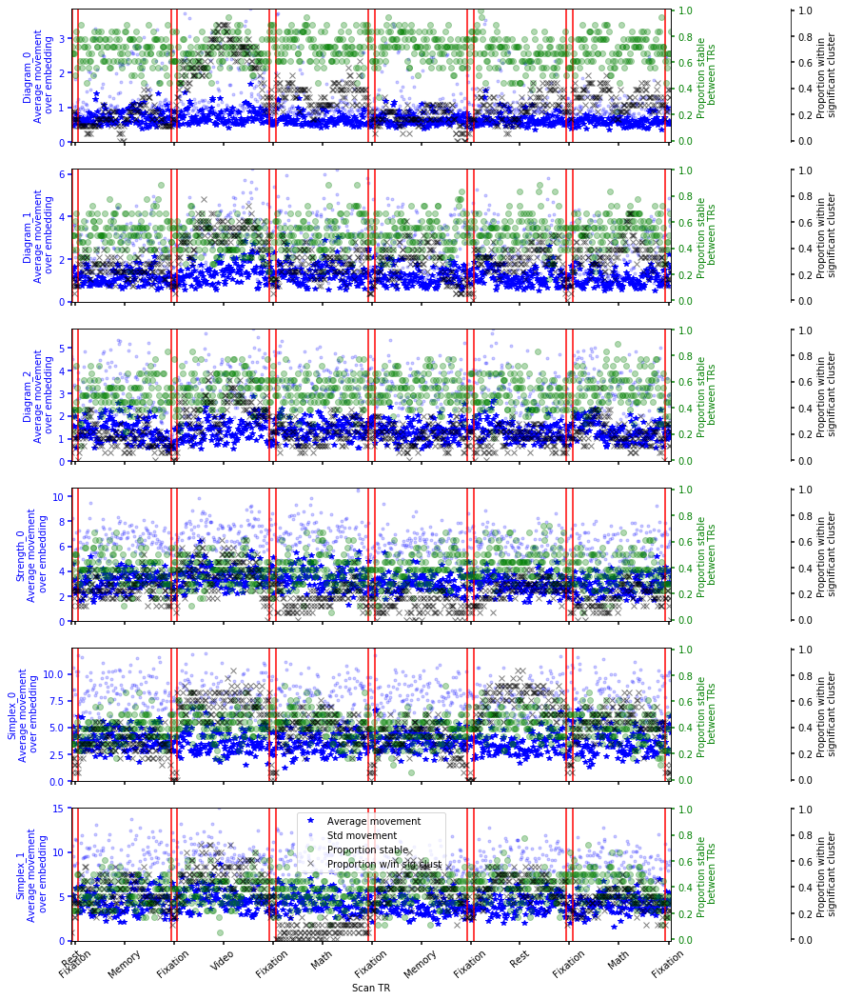

In [62]:
xlines = np.diff(ce[0].ravel())
xlines = np.arange(len(xlines))[xlines.ravel()!=0]+0.5
xticks = np.array([0]+list(xlines)+[len(ce[0])])
xticks = xticks[:-1]+np.diff(xticks)/2
xtick_labels = ce[0][xticks.astype('int')]        
xtick_labels = [goodStates[xt] for xt in np.concatenate(xtick_labels)]

fig, hosts = plt.subplots(nrows=6,ncols=1,sharex='row')
name = './figures/' + savename + '_Trajectories_H' + str(dim) + '.png'
#plt.suptitle( (savename + '_trajectories \n' + 'Dim {} | nVol {}'.format( dim,Nv) ) )        
fig.set_figwidth(7*2)
fig.set_figheight(9*2)
fig.subplots_adjust(right=0.75)

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    
    ax = hosts[i]
    
    Xm = np.reshape(CI,[-1,len(types_cv)],order='F')
    Ym = np.reshape(cluster_outs[condition_label],[-1,len(types_cv)],order='F')    
    Sigm = np.reshape(significant_outs[condition_label],[-1,len(types_cv)],order='F')

    '''
    moves = []    
    for nv in range(Nv):
        temp = h3[condition_label][nv]
        tempx = np.diff(h3[condition_label][nv][:,0])
        tempy = np.diff(h3[condition_label][nv][:,1])
        moves.append(np.sqrt(np.add(tempx**2,tempy**2)))
    '''  

    data = np.concatenate([h3[condition_label][nv] for nv in range(Nv)])
    _, _, xmin, xmax, ymin, ymax = setFed(data)    
    fun_x = lambda vec: ((vec-xmin)/(xmax-xmin))
    fun_y = lambda vec: ((vec-ymin)/(ymax-ymin))
    
    moves = []        
    for nv in range(Nv):
        data = np.concatenate([h3[condition_label][nv]])        
        #tempx = np.diff(fun_x(data[:,0]))
        #tempy = np.diff(fun_y(data[:,1]))                   
        tempx = np.diff(data[:,0])
        tempy = np.diff(data[:,1])                   
        moves.append(np.sqrt(np.add(tempx**2,tempy**2)))        

    movesA = np.array(moves)
    movesA = np.abs(movesA)
    movesM = np.mean(movesA,axis=0)
    movesS = np.std(movesA,axis=0)
    movesX = np.arange(len(movesM))+0.5

    hops = np.mean(np.diff(Ym,axis=0) == 0, axis=1)    

    sigsY = np.mean(Sigm, axis=1)
    sigsX = np.arange(len(sigsY))

    # Plot trajectories    

    par1 = hosts[i].twinx()
    par2 = hosts[i].twinx()

    par2.spines["right"].set_position(("axes", 1.2))
    make_patch_spines_invisible(par2)
    par2.spines["right"].set_visible(True)

    #movesS = movesS*0

    p1, = hosts[i].plot(movesX, movesM, "b*", label="Average movement")
    #p1m, = host.plot(movesX, movesM + movesS, "b.", alpha=0.2, label="Std movement")
    p1p, = hosts[i].plot(movesM + movesS, "b.", alpha=0.2, label="Std movement")
    #p1p = host.fill_between(movesX, movesM - movesS, movesM + movesS, color='gray', alpha=0.2, label="StdDev movement")
    p2, = par1.plot(movesX, hops, "go", alpha=0.3, label="Proportion stable")
    p3, = par2.plot(sigsX, sigsY, "kx", alpha=0.5, label="Proportion w/in sig clust")

    hosts[i].set_xlim(min(sigsX), max(sigsX) )
    bottom = 0#min(np.subtract(movesM,movesS))
    top = max(np.add(movesM,movesS))
    hosts[i].set_ylim(bottom,top)
    par1.set_ylim(-0.01, 1.01)
    par2.set_ylim(-0.01, 1.01)

    hosts[i].set_ylabel(condition_label + "\n Average movement \n over embedding")
    par1.set_ylabel("Proportion stable \n between TRs")
    par2.set_ylabel("Proportion within \n significant cluster")

    hosts[i].yaxis.label.set_color(p1.get_color())
    par1.yaxis.label.set_color(p2.get_color())
    par2.yaxis.label.set_color(p3.get_color())

    hosts[i].set_xticks(xticks)
    if i == 5:
        hosts[i].set_xlabel("Scan TR")
        hosts[i].set_xticklabels(xtick_labels, rotation=40)
        hosts[i].legend(lines, [l.get_label() for l in lines])
    else:
        hosts[i].set_xticklabels('')

    tkw = dict(size=4, width=1.5)
    hosts[i].tick_params(axis='y', colors=p1.get_color(), **tkw)
    par1.tick_params(axis='y', colors=p2.get_color(), **tkw)
    par2.tick_params(axis='y', colors=p3.get_color(), **tkw)
    hosts[i].tick_params(axis='x', **tkw)

    lines = [p1, p1p, p2, p3]

    X = np.tile(xlines[None,:],[2,1])
    Y = np.zeros(X.shape)
    Y[0,:] = bottom
    Y[1,:] = top
    hosts[i].plot(X,Y,'r-')

plt.savefig('/home/Jacob/Figure2.png')
plt.show()


###  Figure 3: Performance Metrics

In [142]:
hatches = [ ['.', '.', '\\', '/', '-'] , ['.', '.', '+', 'x', '*'] ]

In [ ]:
hatches = [ ['.', '.', '.', '-', 'x', '.'] , ['.', '.', '.', '|', '+', '*'] ]

In [28]:
pts.shape

(950, 2)

In [ ]:
wtr.sha

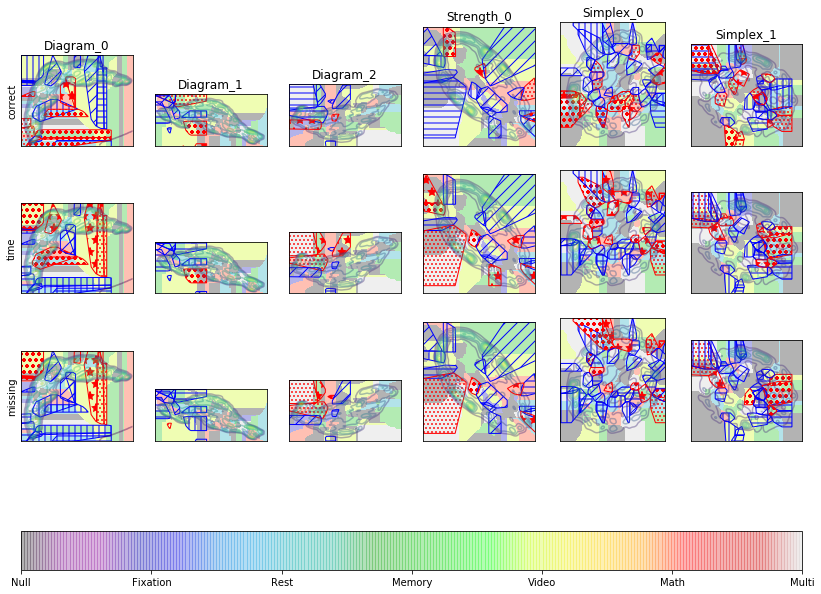

In [163]:
name = './figures/' + savename + '_H' + str(dim) + '.png'
fig = plt.figure(num = 3,figsize=[7*2,5.5*2])

colors = ['b','r']
markers = ['.','.','.','2','3','4']
hatches = [ ['.', '.', '.', '--', '||', '//'] , ['.', '.', '.', '...', 'oo', '*'] ]

axs = []

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    metric, dim = [*conditions[condition]]
    
    for pi, perf in enumerate(performance,start=0):
        ax = plt.subplot(3, 6, 1+i + 6*pi )        
        img = ax.imshow(e_ImgOuts[condition_label], cmap='nipy_spectral',alpha=0.3,vmin=0,vmax=mxe1)
        if i==0:
            ax.set_ylabel(perf)
        if pi==0:
            ax.set_title(condition_label)            
            
        #if pi == 2:
        axs.append(ax)
        ax.contour(F[condition_label],alpha=0.4)      
        ax.set_xticks([],[])
        ax.set_yticks([],[])
        
        for ei, e in enumerate(types_ce[2:], start=0):
            #temp = wtr[condition_label]*0
    
            for w in p_routs[condition_label][e].index:
                val = int(p_routs[condition_label][e].loc[w,[perf]][0])
                if not np.isnan(val):
                    pts = np.argwhere(wtr[condition_label]==w)
                    
                    #ax.scatter(pts[:,0],pts[:,1],c=colors[val],marker='.',s=1)                                                                       
                    #pts = np.roll(pts,1,axis=1)
                    
                    if len(pts)>2:
                        gpts = geo.MultiPoint(pts).convex_hull
                        poly = list(gpts.exterior.coords)
                        val = int(val==1)
                        ax.add_patch(Polygon(poly, closed=True, fill=False, hatch=hatches[val][e],
                                            edgecolor=colors[val], linestyle='-'))
                #temp[wtr==w] = val
            #img = ax.imshow(temp, cmap='coolwarm', vmin=-1, vmax=1)
            
    if i == 5:
        cbar = plt.colorbar(img, ax=axs, location='bottom')
        cbar.set_ticks([0] + list(types_ce) + [mxe1])
        cbar.ax.set_xticklabels( goodStates + ['Multi'])
        
#fig.tight_layout()
#plt.savefig(name)
plt.show()                

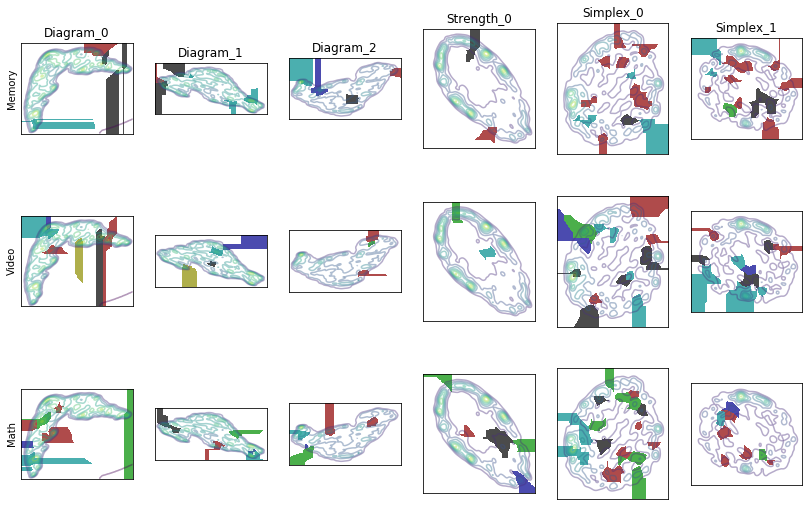

In [63]:
name = './figures/' + savename + '_H' + str(dim) + '.png'
fig = plt.figure(num = 33,figsize=[7*2,4.5*2])

colors = ['b','r']
cscale = [75,175]
markers = ['.','.','.','2','3','4']
hatches = [ ['.', '.', '.', '--', '||', '//'] , ['.', '.', '.', '...', 'oo', '*'] ]

axs = []

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    metric, dim = [*conditions[condition]]
    
    for ei, e in enumerate(types_ce[2:], start=0):
        ax = plt.subplot(3, 6, 1+i + 6*ei )        
        #img = ax.imshow(e_ImgOuts[condition_label], cmap='nipy_spectral',alpha=0.3,vmin=0,vmax=mxe1)
        if i==0:
            ax.set_ylabel(goodStates[e])
        if ei==0:
            ax.set_title(condition_label)                    
        axs.append(ax)

        nx, ny = wtr[condition_label].shape
        temp = np.full([nx,ny,3],255)
        for pi, perf in enumerate(performance,start=0):
            for w in p_routs[condition_label][e].index:
                val = int(p_routs[condition_label][e].loc[w,[perf]][0]==1)
                pts = np.argwhere(wtr[condition_label]==w)                                    
                temp[pts[:,0],pts[:,1],np.full(pts[:,0].shape,pi)] = cscale[val]
        img = ax.imshow(temp)
        ax.contour(F[condition_label],alpha=0.4)      
        ax.set_xticks([],[])
        ax.set_yticks([],[])
        
#fig.tight_layout()
plt.savefig('/home/Jacob/Figure3.png')
plt.show()                

In [225]:
val

0

In [223]:
temp[2,2,:]


array([255, 255, 255])

In [218]:
help(plt.imshow)

Help on function imshow in module matplotlib.pyplot:

imshow(X, cmap=None, norm=None, aspect=None, interpolation=None, alpha=None, vmin=None, vmax=None, origin=None, extent=None, shape=<deprecated parameter>, filternorm=1, filterrad=4.0, imlim=<deprecated parameter>, resample=None, url=None, *, data=None, **kwargs)
    Display an image, i.e. data on a 2D regular raster.
    
    Parameters
    ----------
    X : array-like or PIL image
        The image data. Supported array shapes are:
    
        - (M, N): an image with scalar data. The data is visualized
          using a colormap.
        - (M, N, 3): an image with RGB values (0-1 float or 0-255 int).
        - (M, N, 4): an image with RGBA values (0-1 float or 0-255 int),
          i.e. including transparency.
    
        The first two dimensions (M, N) define the rows and columns of
        the image.
    
        Out-of-range RGB(A) values are clipped.
    
    cmap : str or `~matplotlib.colors.Colormap`, optional
        The 

In [167]:
list(wtr.keys())

['Diagram_0', 'Diagram_1', 'Diagram_2', 'Strength_0', 'Simplex_0', 'Simplex_1']

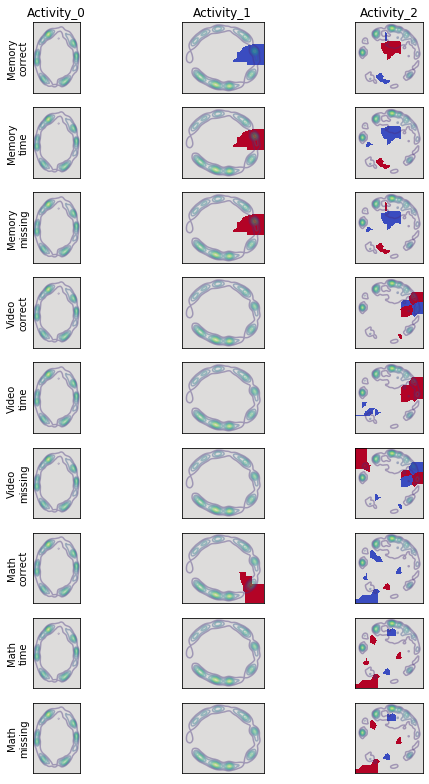

In [15]:
name = './figures/' + savename + '_H' + str(dim) + '.png'
fig = plt.figure(num = 32,figsize=[7*2,5.5*2])

colors = ['b','r']
markers = ['.','.','.','2','3','4']
hatches = [ ['.', '.', '.', '--', '||', '//'] , ['.', '.', '.', '...', 'oo', '*'] ]

axs = []

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    metric, dim = [*conditions[condition]]
    
    for ei, e in enumerate(types_ce[2:], start=0):            
        for pi, perf in enumerate(performance,start=0):        
            ax = plt.subplot(9, 6, 1+i + 6*(pi+3*ei) )                
            temp = wtr[condition_label]*0
    
            for w in p_routs[condition_label][e].index:
                val = int(p_routs[condition_label][e].loc[w,[perf]][0])
                temp[wtr[condition_label]==w] = val
            img = ax.imshow(temp, cmap='coolwarm', vmin=-1, vmax=1)
            ax.contour(F[condition_label],alpha=0.4)              
            ax.set_xticks([],[])
            ax.set_yticks([],[])
            if i==0:
                ax.set_ylabel(goodStates[e] + '\n' + perf )
            if pi==0 and ei==0:
                ax.set_title(condition_label)            
            
        
fig.tight_layout()
#plt.savefig('/home/Jacob/Figure3b_DiagramThresh.png')
plt.show()                

In [305]:
p_routs[condition_label][e].loc[w,perf]

0.0

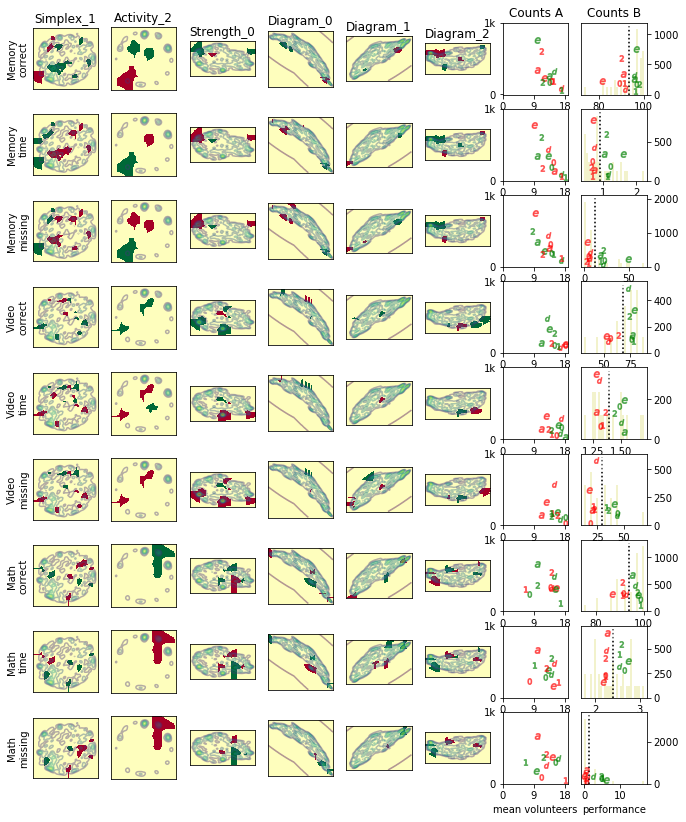

In [48]:
fig = plt.figure(num = 32,figsize=[5.5*2,7*2])

colors = ['b','r']
markers = ['.','.','.','2','3','4']
hatches = [ ['.', '.', '.', '--', '||', '//'] , ['.', '.', '.', '...', 'oo', '*'] ]

axs = []

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    metric, dim = [*conditions[condition]]

    for ei, e in enumerate(types_ce[2:], start=0):            
        for pi, perf in enumerate(performance,start=0):        
            ax = plt.subplot(9, 8, 1+i + 8*(pi+3*ei) )
            temp = wtr[condition_label]*0

            for w in p_routs[condition_label][e].index:
                val = int(p_routs[condition_label][e].loc[w,[perf]][0])
                temp[wtr[condition_label]==w] = val
            img = ax.imshow(temp, cmap='RdYlGn', vmin=-1, vmax=1)
            ax.contour(F[condition_label],alpha=0.4)              
            ax.set_xticks([],[])
            ax.set_yticks([],[])
            if i==0:
                ax.set_ylabel(goodStates[e] + '\n' + perf )
            if pi==0 and ei==0:
                ax.set_title(condition_label)                                

colors = ['r','g']
markers = ['$e$','$a$','$d$','$0$','$1$','$2$']

vals = {}
for ei, e in enumerate(types_ce[2:], start=0):            
    vals[e] = {}    
    for pi, perf in enumerate(performance):
        vals[e][perf] = {}
        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])            
            vals[e][perf][condition_label] = {'v-1':[], 'v0':[], 'v1':[], 
                                              'n-1':0, 'n0':0, 'n1':0,
                                             'p-1':[], 'p0':[], 'p1':[]}

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    for ei, e in enumerate(types_ce[2:], start=0):            
        for w in p_routs[condition_label][e].index:
            for pi, perf in enumerate(performance):
                perf_type = p_routs[condition_label][e].loc[w,perf]
                if perf_type == 0:
                    vals[e][perf][condition_label]['v0'].append(Nv-w_stats[condition_label][w]['vols'])        
                    vals[e][perf][condition_label]['n0'] += w_stats[condition_label][w][e]['npoints']
                    vals[e][perf][condition_label]['p0'].append(w_stats[condition_label][w][e]['points'])                            
                elif perf_type == -1:
                    vals[e][perf][condition_label]['v-1'].append(Nv-w_stats[condition_label][w]['vols'])        
                    vals[e][perf][condition_label]['n-1'] += w_stats[condition_label][w][e]['npoints']
                    vals[e][perf][condition_label]['p-1'].append(w_stats[condition_label][w][e]['points'])                            
                elif perf_type == 1:
                    vals[e][perf][condition_label]['v1'].append(Nv-w_stats[condition_label][w]['vols'])        
                    vals[e][perf][condition_label]['n1'] += w_stats[condition_label][w][e]['npoints']
                    vals[e][perf][condition_label]['p1'].append(w_stats[condition_label][w][e]['points'])        

xlims = [0,19]
ylims = [-1,0]                    

axs = []    
for pi, perf in enumerate(performance):
    for ei, e in enumerate(types_ce[2:], start=0):            
        ax = plt.subplot(9,8, 7 + 8*(pi+3*ei))  
        if pi==0 and ei==0:
            ax.set_title('Counts A')
        if pi==2 and ei==2:
            ax.set_xlabel('mean volunteers')        
        axs.append(ax)
        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])
            for k in [-1,1]:
                yyy = vals[e][perf][condition_label]['n' + str(k)]
                if yyy>0:
                    xxx = np.mean(vals[e][perf][condition_label]['v' + str(k)])
                    ax.plot(xxx,yyy,c=colors[int(k==1)],marker=markers[i],alpha=0.5)   
                    #print([e,perf,condition_label, yy])
        temp = ax.get_ylim()
        ylims[1] = max(ylims[1],temp[1])
        ax.yaxis.set_label_position("right")

ylims[1] *= 1.05       
for ax in axs:
    ax.set_ylim(ylims)
    ax.set_xlim(xlims)
    ax.set_xticks([0,9,18])
    ax.set_yticks([0,1000])
    ax.set_yticklabels([0,'1k'])

xlims = [-1,0]
ylims = [-1,0]                    

pars = []      
for pi, perf in enumerate(performance):
    for ei, e in enumerate(types_ce[2:], start=0):            
        ax = plt.subplot(9, 8, 8 + 8*(pi+3*ei))        
        if pi==0 and ei==0:
            ax.set_title('Counts B')
        if pi==2 and ei==2:
            ax.set_xlabel('performance')
        counts, bins, img = ax.hist(performance[perf][CE==e],bins=30,alpha=0.2,color='y')
        perf_mean = np.mean(performance[perf][CE==e])
        ax.plot([perf_mean]*2,[0,max(counts)],c='k',alpha=0.7,linestyle=':')
        #par = ax.twinx()
        #pars.append(par)
        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])
            for k in [-1,1]:
                yyy = vals[e][perf][condition_label]['n' + str(k)]
                if yyy>0:
                    inds = vals[e][perf][condition_label]['p' + str(k)]
                    inds = np.concatenate(inds)                    
                    xxx = np.mean(performance[perf][inds])
                    ax.plot(xxx,yyy,c=colors[int(k==1)],marker=markers[i],alpha=0.5)   
                    #print([e,perf,condition_label, yy])
        ax.plot([perf_mean]*2,[0,ax.get_ylim()[1]],c='k',alpha=0.7,linestyle=':')
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        #temp = par.get_xlim()
        #xlims[0] = min(xlims[0],temp[0])
        #xlims[1] = max(xlims[1],temp[1])
        #temp = par.get_ylim()        
        #ylims[0] = min(ylims[0],temp[0])
        #ylims[1] = max(ylims[1],temp[1])

#ylims[1] *= 1.05       
#xlims[1] *= 1.05        
#for ax in pars:
    #ax.set_ylim(ylims)
    #ax.set_xlim(xlims)            

#######    

#fig.tight_layout()
#name = './figures/Figure3_randInt{}.png'.format(intiger)
#plt.savefig(name)
#plt.close()                
#plt.savefig('/home/Jacob/Figure2_Activity.png')
plt.show()

In [ ]:
pickle.dump([vBarOut,barChart,barChart_full,vals],file)

In [ ]:
    ra[2][condition_label]
gg=np.array([ list(ra[2][condition_label].values()) for ra in results_array])
np.sum(CE==e)*100
plt.boxplot(gg)

np.sum(list(ra[2][condition_label].values()))

barchart = []
for ra in results_array:
    barchart.append([])
    for e in ra[2][condition_label]:
        barchart[-1].append(ra[2][condition_label][e]/np.sum(CE==e)*100)
    barchart[-1].append(np.sum(list(ra[2][condition_label].values()))/len(CE)*100)



list(ra[2][condition_label].values())


e_frac_full = list(barChart_full[condition_label][e]/np.sum(CE==e)*100 for e in types_ce)
tot_full = np.sum([barChart_full[condition_label][e] for e in barChart_full[condition_label]])/len(CE)*100
e_frac_full.append(tot_full)
e_frac = list(barChart[condition_label][e]/np.sum(CE==e)*100 for e in types_ce)
tot = np.sum([barChart[condition_label][e] for e in barChart[condition_label]])/len(CE)*100

In [304]:
condition_label

'Diagram_2'

In [202]:
np.mean([re[3][e][perf][condition_label]['n' + str(k)] for re in results_array])

345.72972972972974

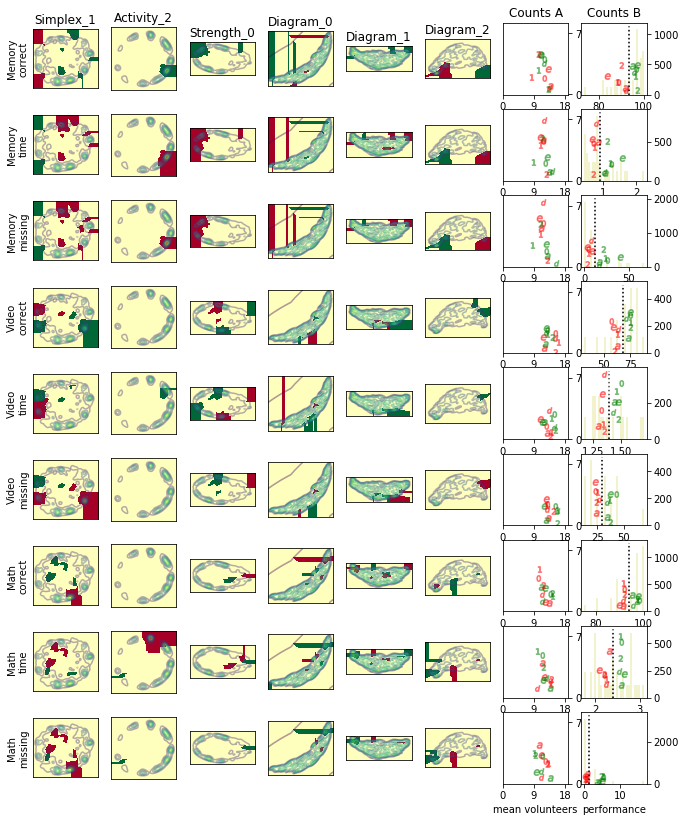

In [484]:
fig = plt.figure(num = 32,figsize=[5.5*2,7*2])

colors = ['b','r']
markers = ['.','.','.','2','3','4']
hatches = [ ['.', '.', '.', '--', '||', '//'] , ['.', '.', '.', '...', 'oo', '*'] ]

axs = []

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    metric, dim = [*conditions[condition]]

    for ei, e in enumerate(types_ce[2:], start=0):            
        for pi, perf in enumerate(performance,start=0):        
            ax = plt.subplot(9, 8, 1+i + 8*(pi+3*ei) )
            temp = wtr[condition_label]*0

            for w in p_routs[condition_label][e].index:
                val = int(p_routs[condition_label][e].loc[w,[perf]][0])
                temp[wtr[condition_label]==w] = val
            img = ax.imshow(temp, cmap='RdYlGn', vmin=-1, vmax=1)
            ax.contour(F[condition_label],alpha=0.4)              
            ax.set_xticks([],[])
            ax.set_yticks([],[])
            if i==0:
                ax.set_ylabel(goodStates[e] + '\n' + perf )
            if pi==0 and ei==0:
                ax.set_title(condition_label)                                

colors = ['r','g']
markers = ['$e$','$a$','$d$','$0$','$1$','$2$']

xlims = [0,19]
ylims = [-1,0]                    

axs = []    
for pi, perf in enumerate(performance):
    for ei, e in enumerate(types_ce[2:], start=0):            
        ax = plt.subplot(9,8, 7 + 8*(pi+3*ei))  
        if pi==0 and ei==0:
            ax.set_title('Counts A')
        if pi==2 and ei==2:
            ax.set_xlabel('mean volunteers')        
        axs.append(ax)
        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])
            for k in [-1,1]:
                yyy = np.mean([re[3][e][perf][condition_label]['n' + str(k)] for re in results_array])
                #yyy = vals[e][perf][condition_label]['n' + str(k)]
                if yyy>0:
                    xxx = np.mean(np.concatenate([re[3][e][perf][condition_label]['v' + str(k)]
                                                  for re in results_array]))
                    #xxx = np.mean(vals[e][perf][condition_label]['v' + str(k)])
                    ax.plot(xxx,yyy,c=colors[int(k==1)],marker=markers[i],alpha=0.4)   
                    #print([e,perf,condition_label, yy])
        temp = ax.get_ylim()
        ylims[1] = max(ylims[1],temp[1])
        ax.yaxis.tick_right()

ylims[1] *= 1.05       
for ax in axs:
    ax.set_ylim(ylims)
    ax.set_xlim(xlims)
    ax.set_xticks([0,9,18])
    ax.set_yticks([0,750])
    ax.set_yticklabels([0,750])

xlims = [-1,0]
ylims = [-1,0]                    

pars = []      
for pi, perf in enumerate(performance):
    for ei, e in enumerate(types_ce[2:], start=0):            
        ax = plt.subplot(9, 8, 8 + 8*(pi+3*ei))        
        if pi==0 and ei==0:
            ax.set_title('Counts B')
        if pi==2 and ei==2:
            ax.set_xlabel('performance')
        counts, bins, img = ax.hist(performance[perf][CE==e],bins=30,alpha=0.2,color='y')
        perf_mean = np.mean(performance[perf][CE==e])
        ax.plot([perf_mean]*2,[0,max(counts)],c='k',alpha=0.7,linestyle=':')
        #par = ax.twinx()
        #pars.append(par)
        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])
            for k in [-1,1]:
                yyy = np.mean([re[3][e][perf][condition_label]['n' + str(k)] for re in results_array])
                #yyy = vals[e][perf][condition_label]['n' + str(k)]
                if yyy>0:
                    #inds = vals[e][perf][condition_label]['p' + str(k)]
                    #inds = np.concatenate(inds)                    
                    inds = np.concatenate(
                        [np.concatenate(re[3][e][perf][condition_label]['p' + str(k)]).ravel()
                                           for re in results_array 
                       if re[3][e][perf][condition_label]['p' + str(k)]] )
                    xxx = np.mean(performance[perf][inds])
                    ax.plot(xxx,yyy,c=colors[int(k==1)],marker=markers[i],alpha=0.4)   
                    #print([e,perf,condition_label, yy])
        ax.plot([perf_mean]*2,[0,ax.get_ylim()[1]],c='k',alpha=0.7,linestyle=':')
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        #temp = par.get_xlim()
        #xlims[0] = min(xlims[0],temp[0])
        #xlims[1] = max(xlims[1],temp[1])
        #temp = par.get_ylim()        
        #ylims[0] = min(ylims[0],temp[0])
        #ylims[1] = max(ylims[1],temp[1])

#ylims[1] *= 1.05       
#xlims[1] *= 1.05        
#for ax in pars:
    #ax.set_ylim(ylims)
    #ax.set_xlim(xlims)            

#######    

#fig.tight_layout()
#name = './figures/Figure3_randInt{}.png'.format(intiger)
#plt.savefig(name)
#plt.close()                
plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure3_All.png')
plt.show()

In [627]:
results_array[0].keys()


dict_keys(['vBarOut', 'barChart_full', 'vals'])

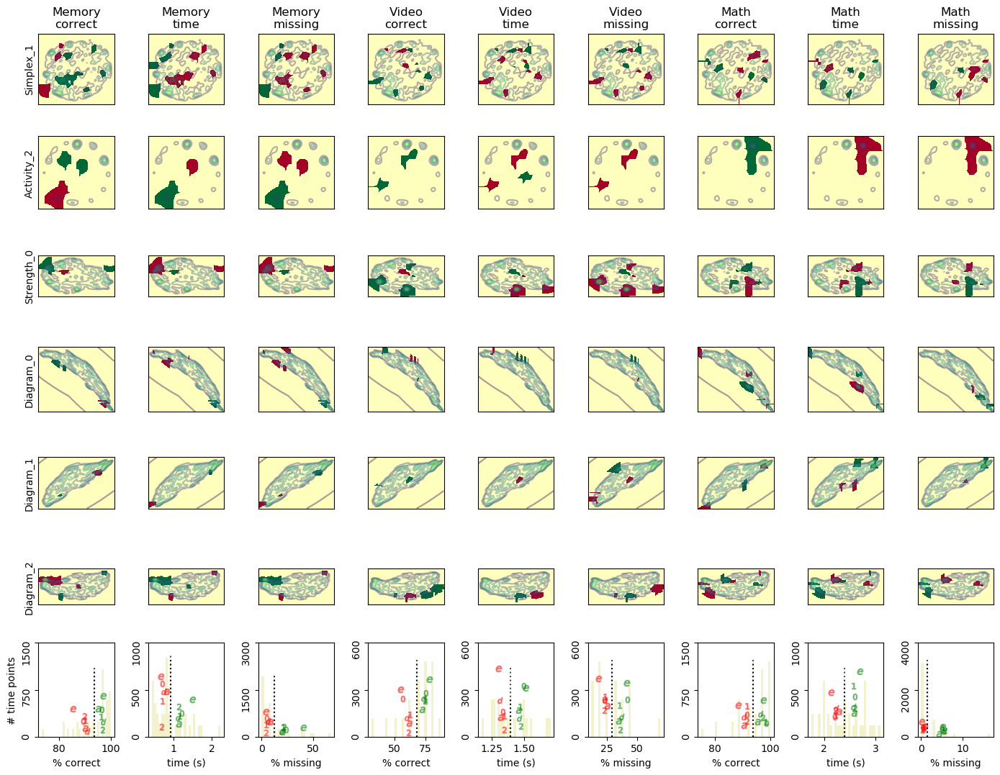

In [218]:
fig = plt.figure(num = 32,figsize=[7*2,5.5*2])

colors = ['b','r']
markers = ['.','.','.','2','3','4']
hatches = [ ['.', '.', '.', '--', '||', '//'] , ['.', '.', '.', '...', 'oo', '*'] ]

axs = []

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    metric, dim = [*conditions[condition]]

    for ei, e in enumerate(types_ce[2:], start=0):            
        for pi, perf in enumerate(performance,start=0):        
            ax = plt.subplot(7, 9, 1 + 9*i + (pi+3*ei) )
            temp = wtr[condition_label]*0

            for w in p_routs[condition_label][e].index:
                val = int(p_routs[condition_label][e].loc[w,[perf]][0])
                temp[wtr[condition_label]==w] = val
            img = ax.imshow(temp, cmap='RdYlGn', vmin=-1, vmax=1)
            ax.contour(F[condition_label],alpha=0.4)              
            ax.set_xticks([],[])
            ax.set_yticks([],[])
            if pi==0 and ei==0:
                ax.set_ylabel(condition_label)
            if i==0:
                ax.set_title(goodStates[e] + '\n' + perf )

colors = ['r','g']
markers = ['$e$','$a$','$d$','$0$','$1$','$2$']

xlims = [-1,0]
ylims = [-1,0]                    

pars = []      
for pi, perf in enumerate(performance):
    for ei, e in enumerate(types_ce[2:], start=0):            
        ax = plt.subplot(7, 9, 1 + 9*(i+1) + (pi+3*ei) )
        if pi==0 and ei==0:
            ax.set_ylabel('# time points')
            ax.yaxis.set_label_position("left")
        if pi==0:
            ax.set_xlabel('% correct')
        if pi==1:
            ax.set_xlabel('time (s)')
        if pi==2:
            ax.set_xlabel('% missing')
        counts, bins, img = ax.hist(performance[perf][CE==e],bins=30,alpha=0.2,color='y')
        perf_mean = np.mean(performance[perf][CE==e])
        ax.plot([perf_mean]*2,[0,max(counts)],c='k',alpha=0.7,linestyle=':')
        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])
            for k in [-1,1]:
                yyy = np.mean([re['vals'][e][perf][condition_label]['n' + str(k)] for re in results_array])
                if yyy>0:
                    inds = np.concatenate(
                        [np.concatenate(re['vals'][e][perf][condition_label]['p' + str(k)]).ravel()
                                           for re in results_array 
                       if re['vals'][e][perf][condition_label]['p' + str(k)]] )
                    xxx = np.mean(performance[perf][inds])
                    ax.plot(xxx,yyy,c=colors[int(k==1)],marker=markers[i],alpha=0.4)   
        ax.plot([perf_mean]*2,[0,ax.get_ylim()[1]],c='k',alpha=0.7,linestyle=':')
        ax.yaxis.tick_left()
        yticks = ax.get_yticks().astype(int)
        ax.set_yticks([min(yticks), np.mean(yticks).astype(int), max(yticks)])
        ax.set_yticklabels([min(yticks), np.mean(yticks).astype(int), max(yticks)], rotation=90)

fig.tight_layout()
#name = './figures/Figure3_randInt{}.png'.format(intiger)
#plt.savefig(name)
#plt.close()                
#plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure3_All.png')
plt.show()

In [521]:
yticks

array([   0., 2000., 4000.])

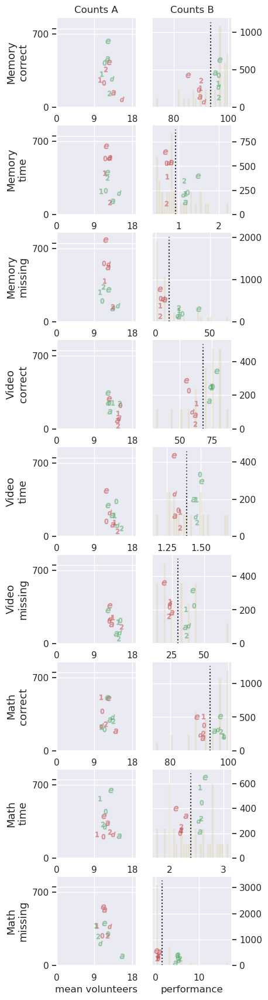

In [571]:
fig = plt.figure(num = 32,figsize=[5.5*3,7*3])

axs = []

colors = ['r','g']
markers = ['$e$','$a$','$d$','$0$','$1$','$2$']

xlims = [0,19]
ylims = [-1,0]                    

axs = []    
for pi, perf in enumerate(performance):
    for ei, e in enumerate(types_ce[2:], start=0):            
        ax = plt.subplot(9,8, 7 + 8*(pi+3*ei))  
        if pi==0 and ei==0:
            ax.set_title('Counts A')
        if pi==2 and ei==2:
            ax.set_xlabel('mean volunteers')                    
        ax.set_ylabel(goodStates[e] + '\n' + perf , fontsize = 13)
        axs.append(ax)
        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])
            for k in [-1,1]:
                yyy = np.mean([re['vals'][e][perf][condition_label]['n' + str(k)] for re in results_array])
                #yyy = vals[e][perf][condition_label]['n' + str(k)]
                if yyy>0:
                    xxx = np.mean(np.concatenate([re['vals'][e][perf][condition_label]['v' + str(k)]
                                                  for re in results_array]))
                    #xxx = np.mean(vals[e][perf][condition_label]['v' + str(k)])
                    ax.plot(xxx,yyy,c=colors[int(k==1)],marker=markers[i],alpha=0.4)   
                    #print([e,perf,condition_label, yy])
        temp = ax.get_ylim()
        ylims[1] = max(ylims[1],temp[1])
        ax.yaxis.tick_left()

ylims[1] *= 1.05       
for ax in axs:
    ax.set_ylim(ylims)
    ax.set_xlim(xlims)
    ax.set_xticks([0,9,18])
    ax.set_yticks([0,700,750])
    ax.set_yticklabels([0,700,''])

xlims = [-1,0]
ylims = [-1,0]                    

pars = []      
for pi, perf in enumerate(performance):
    for ei, e in enumerate(types_ce[2:], start=0):            
        ax = plt.subplot(9, 8, 8 + 8*(pi+3*ei))        
        if pi==0 and ei==0:
            ax.set_title('Counts B')
        if pi==2 and ei==2:
            ax.set_xlabel('performance')
        counts, bins, img = ax.hist(performance[perf][CE==e],bins=30,alpha=0.2,color='y')
        perf_mean = np.mean(performance[perf][CE==e])
        ax.plot([perf_mean]*2,[0,max(counts)],c='k',alpha=0.7,linestyle=':')
        #par = ax.twinx()
        #pars.append(par)
        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])
            for k in [-1,1]:
                yyy = np.mean([re['vals'][e][perf][condition_label]['n' + str(k)] for re in results_array])
                #yyy = vals[e][perf][condition_label]['n' + str(k)]
                if yyy>0:
                    #inds = vals[e][perf][condition_label]['p' + str(k)]
                    #inds = np.concatenate(inds)                    
                    inds = np.concatenate(
                        [np.concatenate(re['vals'][e][perf][condition_label]['p' + str(k)]).ravel()
                                           for re in results_array 
                       if re['vals'][e][perf][condition_label]['p' + str(k)]] )
                    xxx = np.mean(performance[perf][inds])
                    ax.plot(xxx,yyy,c=colors[int(k==1)],marker=markers[i],alpha=0.4)   
                    #print([e,perf,condition_label, yy])
        ax.plot([perf_mean]*2,[0,ax.get_ylim()[1]],c='k',alpha=0.7,linestyle=':')
        ax.yaxis.set_label_position("right")
        ax.yaxis.tick_right()
        #temp = par.get_xlim()
        #xlims[0] = min(xlims[0],temp[0])
        #xlims[1] = max(xlims[1],temp[1])
        #temp = par.get_ylim()        
        #ylims[0] = min(ylims[0],temp[0])
        #ylims[1] = max(ylims[1],temp[1])

#ylims[1] *= 1.05       
#xlims[1] *= 1.05        
#for ax in pars:
    #ax.set_ylim(ylims)
    #ax.set_xlim(xlims)            

#######    

#fig.tight_layout()
#name = './figures/Figure3_randInt{}.png'.format(intiger)
#plt.savefig(name)
#plt.close()                
plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure3_Points_Poster.png')
plt.show()

In [568]:
performance[perf][CE==e]

array([nan, nan, nan, ..., nan, nan, nan])

In [278]:
e=3
perf='time'
inds = np.concatenate(
    [np.concatenate(re[3][e][perf][condition_label]['p' + str(k)]).ravel()
                       for re in results_array 
   if re[3][e][perf][condition_label]['p' + str(k)]] )

In [271]:
results_array[4][3][3][perf][condition_label]['p' + str(k)][0]

37

In [273]:
inds[:5]

array([ 427,  465,  878, 1570, 1576])

In [279]:
np.mean(performance[perf][inds])

0.8400645787812576

### Figure 4: Movie

In [71]:
# Get underlying data
h_alt = []

volunteers = p_utils.getSecondList(inputsdir[metric])
for vi, voln in tqdm(enumerate(volunteers),desc='load inputs for metric {}'.format(metric)):
    with open('./results/rippedTraining/' + str(voln) + '.pkl', 'rb') as file:
        uus = pickle.load(file)        

    for uu in uus:
        dim = 1
        mxInd = np.argmax(np.diff(uu['dgms'][dim],axis=1))
        h_alt.append(uu['cocycles'][dim][mxInd][:,:2])
        

load inputs for metric Strength: 18it [02:11,  7.31s/it]


In [72]:
nT = len(ct)

In [69]:
clusterer = cluster.AgglomerativeClustering(
    distance_threshold=0.4, linkage='single', affinity='precomputed',n_clusters=None)

In [67]:
t0 = np.random.randint(len(CT))

In [79]:
t = t0+777
print('t = {}'.format(t))
vi = int(CV[t])

totRegions = 333

# Many operations require 333 Gordan atlas Indices, so we build 1d and 2d base vectors 
g1 = np.full(totRegions,True)
g1[p_utils.missingVoxels] = False

# There are seperate analyses for several kinds of metric spaces. 
# We treat them individually

# Plot A) Simplicies over brains

cvec = np.arange(len(CT))[cluster_outs['Strength_0'] == cluster_outs['Strength_0'][t]]
# colorTransform is len 333 to match expectations of Gordon atlas 
# for each node, value is 1 minus the mean edge (distance) between nodes
colorTransform = 1-np.mean(np.array([h2['Strength_0'][ii] for ii in cvec]),axis=0)
colorTransformAll = np.zeros(totRegions)
colorTransformAll[g1] = colorTransform
print('colorTransformAll is shape {}'.format(colorTransformAll.shape))
colorName = 'colorTransform.txt'
np.savetxt(colorName, colorTransformAll, delimiter=',', fmt='%1.5f')

cvec = np.arange(len(CT))[cluster_outs['Simplex_0'] == cluster_outs['Simplex_0'][t]]
# for each node, value is 1 minus the minimum edge (distance) between nodes
maxEdge = 1-np.mean(np.array([h2['Simplex_0'][ii] for ii in cvec]),axis=0)

# Express cycle limit in terms of actual coherence
cycleLimit = 1-0.2
print('cycleLimit = {}'.format(cycleLimit))

cvec = np.arange(len(CT))[cluster_outs['Simplex_1'] == cluster_outs['Simplex_1'][t]]
# Values are 1 minus the edge (distance) between nodes,
# Quantity is averaged over time points in cvec
cyclesMatrix = 1-np.mean(np.array([h2['Simplex_1'][ii] for ii in cvec]),axis=0)
cycles = cyclesMatrix.copy()
# Push cycles more distant than threshold to max distance = 1
cycles[cycles<cycleLimit] = 0
cycles = squareform(cycles)
cycr, cycc = np.nonzero(np.tril(cycles))
# Add one to index for matlab, and scale cycle values w.r.t. cycleLimit
cycles_out = np.array([cycr+1,cycc+1,(cycles[cycr,cycc]-(cycleLimit))/(1-cycleLimit)]).T 
print('cycles_out is shape {}'.format(cycles_out.shape))
cycleName = 'cycleFile.txt' 
np.savetxt(cycleName, cycles_out, delimiter=',', fmt='%1.5f')


# Plot B) Plot simplicial data as matrix
degreeArray_name = 'degreeArrayFile.txt'
degreeArray = np.array([maxEdge,colorTransform]).T
print('degreeArray is shape {}'.format(degreeArray.shape))
np.savetxt(degreeArray_name, degreeArray, delimiter=',', fmt='%1.5f')


edgesMatrix_name = 'edgesMatrixFile.txt'
edgesMatrix = squareform(cyclesMatrix)
#cyclesMatrix[np.diag_indices(len(cyclesMatrix))] = 1
print('edgesMatrix is shape {}'.format(edgesMatrix.shape))
np.savetxt(edgesMatrix_name, edgesMatrix, delimiter=',', fmt='%1.5f')


# plot C) Persistance Diagrams
cvec = np.arange(len(CT))[cluster_outs['Diagram_0'] == cluster_outs['Diagram_0'][t]]
diag0 = np.concatenate([h2['Diagram_0'][ii] for ii in cvec])[:,1]
print('diag0 is shape {}'.format(diag0.shape))
diag0_name = 'diag0.txt'
np.savetxt(diag0_name, diag0, delimiter=',', fmt='%1.5f')

cvec = np.arange(len(CT))[cluster_outs['Diagram_1'] == cluster_outs['Diagram_1'][t]]
diag1 = np.concatenate([h2['Diagram_1'][ii] for ii in cvec])
#hist1,_,_ = np.histogram2d(diag1[:,0],diag1[:,1],bins=128)
print('diag1 is shape {}'.format(diag1.shape))
diag1_name = 'diag1.txt'
np.savetxt(diag1_name, diag1, delimiter=',', fmt='%1.5f')

cvec = np.arange(len(CT))[cluster_outs['Diagram_2'] == cluster_outs['Diagram_2'][t]]
diag2 = np.concatenate([h2['Diagram_2'][ii] for ii in cvec])
#hist2,_,_ = np.histogram2d(diag2[:,0],diag2[:,1],bins=128)
print('diag2 is shape {}'.format(diag2.shape))
diag2_name = 'diag2.txt'
np.savetxt(diag2_name, diag2, delimiter=',', fmt='%1.5f')



# Plot D) Persistance Diagrams over Brains
simpleClustering_name = 'simpleClusts.txt'
cvec = np.arange(len(CT))[cluster_outs['Diagram_0'] == cluster_outs['Diagram_0'][t]]
simpleClustsMatrix = np.mean(np.array([h2['Simplex_1'][ii] for ii in cvec]),axis=0)
simpleClusts = clusterer.fit(squareform(simpleClustsMatrix))
simpleClustsAll = np.zeros(totRegions,dtype=int) 
simpleClustsAll[g1] = simpleClusts.labels_+1
print('simpleClustsAll is shape {}, and has {} unique clusters'.format(
    simpleClustsAll.shape, len(np.unique(simpleClustsAll))))
np.savetxt(simpleClustering_name, simpleClustsAll, delimiter=',', fmt='%1.5f')

                             
homology_name = 'homology.txt'
homology = np.zeros(edgesMatrix.shape)
cvec = np.arange(len(CT))[cluster_outs['Diagram_1'] == cluster_outs['Diagram_1'][t]]
for cvc in cvec:
    homology[h_alt[cvc][:,0],h_alt[cvc][:,1]] += 1
homology = homology+homology.T
homologyLimit = sorted(np.tril(homology).ravel())[-50]
print('homology limit is {}'.format(homologyLimit))
homology -= homologyLimit
homology /= np.max(homology)
homology[homology<0] = 0
homr, homc = np.nonzero(np.tril(homology))
# Add one to index for matlab, and scale cycle values w.r.t. cycleLimit
homology_out = np.array([homr+1,homc+1,homology[homr,homc]]).T 
print('homology_out is shape {}'.format(homology_out.shape))
np.savetxt(homology_name, homology_out, delimiter=',', fmt='%1.5f')

t = 2282
colorTransformAll is shape (333,)
cycleLimit = 0.8
cycles_out is shape (279, 3)
degreeArray is shape (328, 2)
edgesMatrix is shape (328, 328)
diag0 is shape (177448,)
diag1 is shape (70885, 2)
diag2 is shape (79651, 2)
simpleClustsAll is shape (333,), and has 97 unique clusters
homology limit is 13.0
homology_out is shape (46, 3)


In [ ]:
nodesktop -r 'path(pathdef_2020); plotConnectome('cycleFile.txt','colorTransform.txt','temp.png',5)

In [80]:
'"path(pathdef_2020); plotConnectome("t{:04}.png",5,1); exit"'.format(t0+777)

'"path(pathdef_2020); plotConnectome("t2282.png",5,1); exit"'

In [78]:
subprocess.run(['matlab' , '-nodesktop', '-r', '"path(pathdef_2020); plotConnectome("t{:04}.png",5,1); exit"'.format(t0)])

CompletedProcess(args=['matlab', '-nodesktop', '-r', '"path(pathdef_2020); plotConnectome("t1505.png",5,1); exit"'], returncode=0)

###  Compare

In [122]:
def calcWeightedJaccard(inputs):
    A = 1-inputs[0]
    B = 1-inputs[1]

    numerator = np.min([A,B], axis=0)
    denomerator = np.max([A,B],axis=0)
    
    dist = 1-(np.sum(numerator)/np.sum(denomerator))

    return dist


In [20]:
#### Note: only aggregates from the same stimulus conditions+

# find correct fast video group

conditions_extended = conditions.copy()
for condition in conditions:
    conditions_extended[condition+6] = conditions[condition]

pars = []      
res_type = 3

outGraph_less = {}
outGraph_more = {}

for ei, e in enumerate(types_ce[2:], start=0):            
    outGraph_less[e] = {}
    outGraph_more[e] = {}

    for pi, perf in enumerate(performance):
        outGraph_less[e][perf] = {}
        outGraph_more[e][perf] = {}

        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])
            print(condition_label)

            k = -1
            inds = np.concatenate(
                [np.concatenate(re[res_type][e][perf][condition_label]['p' + str(k)]).ravel()
                                   for re in results_array 
               if re[res_type][e][perf][condition_label]['p' + str(k)]] )
            outGraph_less[e][perf][condition_label] = np.mean(np.array(list([h2['Simplex_1'][ind] for ind in inds])),axis=0)

            k=1
            inds = np.concatenate(
                [np.concatenate(re[res_type][e][perf][condition_label]['p' + str(k)]).ravel()
                                   for re in results_array 
               if re[res_type][e][perf][condition_label]['p' + str(k)]] )
            outGraph_more[e][perf][condition_label] = np.mean(np.array(list([h2['Simplex_1'][ind] for ind in inds])),axis=0)

Simplex_1


KeyError: 3

In [34]:
len(results_array)

76

In [35]:
results_array[0][res_type][e][perf].keys()

dict_keys(['Simplex_1', 'Activity_2', 'Strength_0', 'Diagram_0', 'Diagram_1', 'Diagram_2'])

In [21]:
list(results_array[1]['vals'][3]['correct']['Diagram_1'].keys())

['v-1', 'v0', 'v1', 'n-1', 'n0', 'n1', 'p-1', 'p0', 'p1', 'a-1', 'a0', 'a1']

In [298]:
# find correct fast video group

conditions_extended = conditions.copy()
for condition in conditions:
    conditions_extended[condition+6] = conditions[condition]

pars = []      
res_type = 'vals'

outGraph_less = {}
outGraph_more = {}

for ei, e in enumerate(types_ce[2:], start=0):            
    outGraph_less[e] = {}
    outGraph_more[e] = {}

    for pi, perf in enumerate(performance):
        outGraph_less[e][perf] = {}
        outGraph_more[e][perf] = {}

        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])
            #print(condition_label)

            k = -1
            inds = np.concatenate(
                [np.concatenate(re[res_type][e][perf][condition_label]['a' + str(k)]).ravel()
                                   for re in results_array 
               if re[res_type][e][perf][condition_label]['a' + str(k)]] )
            aa, bb0 = np.unique(inds, return_counts=True)
            bb = bb0/np.sum(bb0)
            outGraph_less[e][perf][condition_label] = np.sum(np.array(list(
                [h2['Simplex_1'][ind]*count for ind, count in zip(aa,bb)])),axis=0)

            k=1
            inds = np.concatenate(
                [np.concatenate(re[res_type][e][perf][condition_label]['a' + str(k)]).ravel()
                                   for re in results_array 
               if re[res_type][e][perf][condition_label]['a' + str(k)]] )
            cc, dd0 = np.unique(inds, return_counts=True)
            dd = dd0/np.sum(dd0)            
            outGraph_more[e][perf][condition_label] = np.sum(np.array(list(
                [h2['Simplex_1'][ind]*count for ind, count in zip(cc,dd)])),axis=0)
            
            print([goodStates[e], perf, condition_label, len(aa), np.sum(bb0), len(cc), np.sum(dd0),
                  np.mean(outGraph_less[e][perf][condition_label]), 
                  np.mean(outGraph_more[e][perf][condition_label])])

['Memory', 'correct', 'Simplex_1', 11522, 95242, 12886, 162288, 0.6026564499186671, 0.5718520469624003]
['Memory', 'correct', 'Activity_2', 10720, 40992, 13366, 143986, 0.5574687072331767, 0.6061421955087477]
['Memory', 'correct', 'Strength_0', 7255, 20639, 10340, 68015, 0.6053774031003045, 0.5678587015599292]
['Memory', 'correct', 'Diagram_0', 4312, 62099, 3933, 106842, 0.5213511734880557, 0.6428310960624088]
['Memory', 'correct', 'Diagram_1', 6072, 72743, 3753, 83107, 0.5233305250652587, 0.6467878940391228]
['Memory', 'correct', 'Diagram_2', 6412, 107973, 3980, 36806, 0.5361062030999088, 0.6397884988135318]
['Memory', 'time', 'Simplex_1', 12440, 162013, 10211, 91882, 0.5894109761552069, 0.5887111150703387]
['Memory', 'time', 'Activity_2', 13667, 168252, 10289, 37866, 0.6039350893219193, 0.5564373511663743]
['Memory', 'time', 'Strength_0', 9867, 147886, 8513, 58380, 0.6270421485744447, 0.6164399822532431]
['Memory', 'time', 'Diagram_0', 4978, 138988, 4017, 61145, 0.6435555377994067, 0

In [ ]:
# find correct fast video group

conditions_extended = conditions.copy()
for condition in conditions:
    conditions_extended[condition+6] = conditions[condition]

pars = []      
res_type = 'vals'

inds = np.concatenate(
                [np.concatenate(re[res_type][e][perf][condition_label]['a' + str(k)]).ravel()
                                   for re in results_array 
               if re[res_type][e][perf][condition_label]['a' + str(k)]] )
            aa, bb0 = np.unique(inds, return_counts=True)
            bb = bb0/np.sum(bb0)
            outGraph_less[e][perf][condition_label] = np.sum(np.array(list(
                [h2['Simplex_1'][ind]*count for ind, count in zip(aa,bb)])),axis=0)
            
            
            Graph0 = np.array(h2['Simplex_1']),

for ei, e in enumerate(types_ce[2:], start=0):            
    Graph0{'less'}[e] = {}
    Graph{'more'}[e] = {}

    for pi, perf in enumerate(performance):
        Graph{'less'}[e][perf] = {}
        Graph{'more'}[e][perf] = {}

        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])
            #print(condition_label)

            k = -1
            inds = np.concatenate(
                [np.concatenate(re[res_type][e][perf][condition_label]['a' + str(k)]).ravel()
                                   for re in results_array 
               if re[res_type][e][perf][condition_label]['a' + str(k)]] )
            aa, bb0 = np.unique(inds, return_counts=True)
            bb = bb0/np.sum(bb0)
            outGraph_less[e][perf][condition_label] = np.sum(np.array(list(
                [h2['Simplex_1'][ind]*count for ind, count in zip(aa,bb)])),axis=0)

            k=1
            inds = np.concatenate(
                [np.concatenate(re[res_type][e][perf][condition_label]['a' + str(k)]).ravel()
                                   for re in results_array 
               if re[res_type][e][perf][condition_label]['a' + str(k)]] )
            cc, dd0 = np.unique(inds, return_counts=True)
            dd = dd0/np.sum(dd0)            
            outGraph_more[e][perf][condition_label] = np.sum(np.array(list(
                [h2['Simplex_1'][ind]*count for ind, count in zip(cc,dd)])),axis=0)
            
            print([goodStates[e], perf, condition_label, len(aa), np.sum(bb0), len(cc), np.sum(dd0),
                  np.mean(outGraph_less[e][perf][condition_label]), 
                  np.mean(outGraph_more[e][perf][condition_label])])

In [738]:
outGraph_average = np.mean(np.array(h2['Simplex_1']),axis=0)

In [739]:
outGraph_average.shape

(53628,)

In [ ]:
type(ii)

In [ ]:
goodStates

In [146]:
np.sum(bb)

73225

In [25]:
aa, bb = np.unique(inds, return_counts=True)
[aa.shape, bb.shape, np.sum(bb)]

[(10767,), (10767,), 73225]

In [1014]:
fname = ('OutGraphs_AndGG.pkl')
with open(fname, 'wb') as file:
    og = {'outGraph_more': outGraph_more, 'outGraph_less': outGraph_less, 'GG_all':GG_all}
    pickle.dump(og, file)

In [ ]:
fname = ('OutGraphs.pkl')
with open(fname, 'rb') as file:    
    og = pickle.load(file)
outGraph_more = og['outGraph_more']
outGraph_less = og['outGraph_less']

In [123]:
fname = ('OutGraphs_AndGG.pkl')
with open(fname, 'rb') as file:    
    og = pickle.load(file)
outGraph_more = og['outGraph_more']
outGraph_less = og['outGraph_less']
GG_all = og['GG_all']

In [93]:
# find correct fast video group

res_type = 'vals'
outGraph_rest = {}

e = 2

for i, condition in enumerate(conditions):
    condition_label = '{}_{}'.format(*conditions[condition])
    print(condition_label)
    
    inds = np.arange(len(CE))[CE==e]
    outGraph_rest[condition_label] = np.mean(np.array(list([h2['Simplex_1'][ind] for ind in inds])),axis=0)    

Simplex_1
Activity_2
Strength_0
Diagram_0
Diagram_1
Diagram_2


In [129]:
# find correct fast video group
outRips_less = {}
outRips_more = {}

for ei, e in enumerate(types_ce[2:], start=0):            
    outRips_less[e] = {}
    outRips_more[e] = {}

    for pi, perf in enumerate(performance):
        outRips_less[e][perf] = {}
        outRips_more[e][perf] = {}

        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])
            print(condition_label)
            
            curgraph = squareform(outGraph_less[e][perf][condition_label])
            outRips_less[e][perf][condition_label] = ripser(curgraph, maxdim=1, distance_matrix=True, do_cocycles=False)

            curgraph = squareform(outGraph_more[e][perf][condition_label])
            outRips_more[e][perf][condition_label] = ripser(curgraph, maxdim=1, distance_matrix=True, do_cocycles=False)

Activity_2
Simplex_1
Strength_0
Diagram_0
Diagram_1
Diagram_2
Activity_2
Simplex_1
Strength_0
Diagram_0
Diagram_1
Diagram_2
Activity_2
Simplex_1
Strength_0
Diagram_0
Diagram_1
Diagram_2
Activity_2
Simplex_1
Strength_0
Diagram_0
Diagram_1
Diagram_2
Activity_2
Simplex_1
Strength_0
Diagram_0
Diagram_1
Diagram_2
Activity_2
Simplex_1
Strength_0
Diagram_0
Diagram_1
Diagram_2
Activity_2
Simplex_1
Strength_0
Diagram_0
Diagram_1
Diagram_2
Activity_2
Simplex_1
Strength_0
Diagram_0
Diagram_1
Diagram_2
Activity_2
Simplex_1
Strength_0
Diagram_0
Diagram_1
Diagram_2


In [124]:
# find correct fast video group

conditions_extended = conditions.copy()
for condition in conditions:
    conditions_extended[condition+6] = conditions[condition]

pars = []      
res_type = 'vals'

outWave = {'more':{}, 'less':{}}
outTargs = {'more':{}, 'less':{}}

for ei, e in enumerate(types_ce[2:], start=0):            
    outWave['less'][e] = {}
    outWave['more'][e] = {}
    outTargs['less'][e] = {}
    outTargs['more'][e] = {}

    for pi, perf in enumerate(performance):
        outWave['less'][e][perf] = {}        
        outWave['more'][e][perf] = {}
        outTargs['less'][e][perf] = {}
        outTargs['more'][e][perf] = {}

        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])
            #print(condition_label)

            k = -1
            inds = np.concatenate(
                [np.concatenate(re[res_type][e][perf][condition_label]['a' + str(k)]).ravel()
                                   for re in results_array 
               if re[res_type][e][perf][condition_label]['a' + str(k)]] )
            aa, bb0 = np.unique(inds, return_counts=True)
            bb = bb0/np.sum(bb0)
            outWave['less'][e][perf][condition_label] = np.array(list(
                h1[:,ind]*count for ind, count in zip(aa,bb)))
            outTargs['less'][e][perf][condition_label] = {'inds':aa,'fracs':bb}

            k=1
            inds = np.concatenate(
                [np.concatenate(re[res_type][e][perf][condition_label]['a' + str(k)]).ravel()
                                   for re in results_array 
               if re[res_type][e][perf][condition_label]['a' + str(k)]] )
            cc, dd0 = np.unique(inds, return_counts=True)
            dd = dd0/np.sum(dd0)            
            outWave['more'][e][perf][condition_label] = np.array(list(
                [h1[:,ind]*count for ind, count in zip(cc,dd)]))
            outTargs['more'][e][perf][condition_label] = {'inds':cc,'fracs':dd}
            
            print([goodStates[e], perf, condition_label, len(aa), np.sum(bb0), len(cc), np.sum(dd0),
                  np.mean(outWave['less'][e][perf][condition_label]), 
                  np.mean(outWave['more'][e][perf][condition_label])])
            

['Memory', 'correct', 'Activity_2', 10720, 40992, 13366, 143986, -1.6362769075742364e-07, 1.1344469081118971e-07]
['Memory', 'correct', 'Simplex_1', 11522, 95242, 12886, 162288, -1.2576278358815611e-07, 1.064173353335961e-07]
['Memory', 'correct', 'Strength_0', 7255, 20639, 10340, 68015, -8.594885209847008e-08, 4.915975539331345e-08]
['Memory', 'correct', 'Diagram_0', 4312, 62099, 3933, 106842, -8.7400411789136e-07, 6.881011578656474e-07]
['Memory', 'correct', 'Diagram_1', 6072, 72743, 3753, 83107, -6.792470035696174e-07, 1.5372032933690845e-06]
['Memory', 'correct', 'Diagram_2', 6412, 107973, 3980, 36806, -1.716937940341391e-06, -1.3749038131813675e-06]
['Memory', 'time', 'Activity_2', 13667, 168252, 10289, 37866, 1.2278195923703402e-07, -2.244096337936724e-07]
['Memory', 'time', 'Simplex_1', 12440, 162013, 10211, 91882, 1.0912745845392757e-07, -1.1940455074646627e-07]
['Memory', 'time', 'Strength_0', 9867, 147886, 8513, 58380, 7.602157460412209e-08, -9.096711724974226e-08]
['Memory',

In [258]:
gg=[]

for ri,re in enumerate(results_array):
    if len(re[res_type][e][perf][condition_label]['a' + str(k)]):
        gg.append(len(re[res_type][e][perf][condition_label]['a' + str(k)]))
    
                                           

In [260]:
re[res_type][e][perf][condition_label]['a' + str(k)]

[array([   22,   105,   217,   268,   289,   382,   397,   457,   523,
         1103,  1121,  1297,  1870,  1988,  2061,  2576,  2640,  2832,
         3255,  3312,  3719,  3906,  4028,  4267,  4473,  4493,  4544,
         4700,  5074,  5154,  5263,  5396,  5402,  5533,  5806,  6118,
         6355,  6787,  6841,  6846,  6853,  6973,  6999,  7236,  7352,
         7364,  7378,  7382,  7399,  7411,  7426,  7647,  8001,  8176,
         8275,  8350,  8523,  8535,  8600,  8604,  8605,  8611,  8614,
         8617,  8618,  8619,  8620,  8621,  8622,  8623,  8624,  8625,
         8628,  8630,  8631,  8634,  8635,  8636,  8637,  8638,  8639,
         8640,  8644,  8645,  8646,  8647,  8654,  8658,  8659,  8660,
         8661,  8662,  8663,  8680,  8683,  8736,  8748,  8808,  8915,
         8930,  9425,  9500,  9858, 10126, 10149, 10186, 10292, 10753,
        10782, 10824, 10906, 11040, 11132, 11366, 11471, 11474, 11626,
        11659, 11662, 11673, 11740, 12314, 12517, 12709, 12877, 12950,
      

In [259]:
gg

[1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 3,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 3,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 2,
 1,
 1,
 2,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 3,
 1,
 1,
 4,
 1,
 1,
 2,
 1,
 2,
 2,
 2,
 1,
 1,
 2,
 1,
 2,
 2,
 2,
 1]

In [257]:
len(re[res_type][e][perf][condition_label]['a' + str(k)])

1

In [249]:
re[res_type][e][perf][condition_label]['a' + str(k)]

[array([   62,    69,   116,   195,   239,   240,   282,   340,   359,
          448,   501,   504,   505,   516,   531,   544,   560,   568,
          571,   713,   785,   807,   833,   838,   979,  1089,  1263,
         1306,  1383,  1475,  1483,  1516,  1597,  1618,  1627,  1641,
         1667,  1888,  2007,  2083,  2089,  2091,  2100,  2109,  2144,
         2186,  2191,  2583,  2594,  2602,  2686,  2749,  3148,  3223,
         3708,  3822,  3898,  3909,  3913,  3954,  4088,  4164,  4180,
         4313,  4336,  4380,  4461,  4484,  4518,  4583,  4633,  4763,
         4979,  5003,  5042,  5111,  5153,  5229,  5231,  5489,  5526,
         5725,  5737,  5747,  5790,  5887,  6037,  6071,  6242,  6454,
         6479,  6553,  6602,  6857,  7052,  7273,  7299,  7517,  7523,
         7546,  7565,  7589,  7593,  7679,  7825,  7853,  7889,  7898,
         7920,  7978,  8030,  8069,  8294,  8320,  8415,  8449,  8547,
         8551,  8566,  8577,  8582,  8584,  8586,  8589,  8590,  8592,
      

True

In [266]:
# find correct fast video group

conditions_extended = conditions.copy()
for condition in conditions:
    conditions_extended[condition+6] = conditions[condition]

pars = []      
res_type = 'vals'

outClusts = {}

for ei, e in enumerate(types_ce[2:], start=0):            
    outClusts[e] = {}

    for pi, perf in enumerate(performance):
        outClusts[e][perf] = {}        
        
        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])
            #print(condition_label)

            temp = []
            
            for ri,re in enumerate(results_array):
                alen = 0
                for k in range(-1,2,1):
                    if len(re[res_type][e][perf][condition_label]['a' + str(k)]):
                        alen += len(re[res_type][e][perf][condition_label]['a' + str(k)])
                temp.append(alen)
            outClusts[e][perf][condition_label] = [np.mean(temp), np.std(temp)]

            
            

In [267]:
outClusts

{3: {'correct': {'Activity_2': [<function numpy.mean(a, axis=None, dtype=None, out=None, keepdims=<no value>)>,
    <function numpy.std(a, axis=None, dtype=None, out=None, ddof=0, keepdims=<no value>)>],
   'Simplex_1': [<function numpy.mean(a, axis=None, dtype=None, out=None, keepdims=<no value>)>,
    <function numpy.std(a, axis=None, dtype=None, out=None, ddof=0, keepdims=<no value>)>],
   'Strength_0': [<function numpy.mean(a, axis=None, dtype=None, out=None, keepdims=<no value>)>,
    <function numpy.std(a, axis=None, dtype=None, out=None, ddof=0, keepdims=<no value>)>],
   'Diagram_0': [<function numpy.mean(a, axis=None, dtype=None, out=None, keepdims=<no value>)>,
    <function numpy.std(a, axis=None, dtype=None, out=None, ddof=0, keepdims=<no value>)>],
   'Diagram_1': [<function numpy.mean(a, axis=None, dtype=None, out=None, keepdims=<no value>)>,
    <function numpy.std(a, axis=None, dtype=None, out=None, ddof=0, keepdims=<no value>)>],
   'Diagram_2': [<function numpy.mean(a

In [27]:
h1.shape

(328, 13986)

In [25]:
outWave['less'][e][perf][condition_label].shape

(4875, 328)

In [128]:
from persim import sliced_wasserstein as slw

In [41]:
conditions_extended

{0: ['Simplex', 1],
 1: ['Activity', 2],
 2: ['Strength', 0],
 3: ['Diagram', 0],
 4: ['Diagram', 1],
 5: ['Diagram', 2],
 6: ['Simplex', 1],
 7: ['Activity', 2],
 8: ['Strength', 0],
 9: ['Diagram', 0],
 10: ['Diagram', 1],
 11: ['Diagram', 2]}

In [183]:
import matplotlib as mpl

In [193]:
help(plt.imshow)

Help on function imshow in module matplotlib.pyplot:

imshow(X, cmap=None, norm=None, aspect=None, interpolation=None, alpha=None, vmin=None, vmax=None, origin=None, extent=None, shape=<deprecated parameter>, filternorm=1, filterrad=4.0, imlim=<deprecated parameter>, resample=None, url=None, *, data=None, **kwargs)
    Display an image, i.e. data on a 2D regular raster.
    
    Parameters
    ----------
    X : array-like or PIL image
        The image data. Supported array shapes are:
    
        - (M, N): an image with scalar data. The data is visualized
          using a colormap.
        - (M, N, 3): an image with RGB values (0-1 float or 0-255 int).
        - (M, N, 4): an image with RGBA values (0-1 float or 0-255 int),
          i.e. including transparency.
    
        The first two dimensions (M, N) define the rows and columns of
        the image.
    
        Out-of-range RGB(A) values are clipped.
    
    cmap : str or `~matplotlib.colors.Colormap`, optional
        The 

In [190]:
help(mpl.colors.Colormap)

Help on class Colormap in module matplotlib.colors:

class Colormap(builtins.object)
 |  Colormap(name, N=256)
 |  
 |  Baseclass for all scalar to RGBA mappings.
 |  
 |  Typically Colormap instances are used to convert data values (floats) from
 |  the interval ``[0, 1]`` to the RGBA color that the respective Colormap
 |  represents. For scaling of data into the ``[0, 1]`` interval see
 |  :class:`matplotlib.colors.Normalize`. It is worth noting that
 |  :class:`matplotlib.cm.ScalarMappable` subclasses make heavy use of this
 |  ``data->normalize->map-to-color`` processing chain.
 |  
 |  Methods defined here:
 |  
 |  __call__(self, X, alpha=None, bytes=False)
 |      Parameters
 |      ----------
 |      X : scalar, ndarray
 |          The data value(s) to convert to RGBA.
 |          For floats, X should be in the interval ``[0.0, 1.0]`` to
 |          return the RGBA values ``X*100`` percent along the Colormap line.
 |          For integers, X should be in the interval ``[0, Colo

In [186]:
gg=_

In [191]:
gg.set_bad(0)

ValueError: Invalid RGBA argument: 0

In [182]:
help(plt.imshow)

Help on function imshow in module matplotlib.pyplot:

imshow(X, cmap=None, norm=None, aspect=None, interpolation=None, alpha=None, vmin=None, vmax=None, origin=None, extent=None, shape=<deprecated parameter>, filternorm=1, filterrad=4.0, imlim=<deprecated parameter>, resample=None, url=None, *, data=None, **kwargs)
    Display an image, i.e. data on a 2D regular raster.
    
    Parameters
    ----------
    X : array-like or PIL image
        The image data. Supported array shapes are:
    
        - (M, N): an image with scalar data. The data is visualized
          using a colormap.
        - (M, N, 3): an image with RGB values (0-1 float or 0-255 int).
        - (M, N, 4): an image with RGBA values (0-1 float or 0-255 int),
          i.e. including transparency.
    
        The first two dimensions (M, N) define the rows and columns of
        the image.
    
        Out-of-range RGB(A) values are clipped.
    
    cmap : str or `~matplotlib.colors.Colormap`, optional
        The 

/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


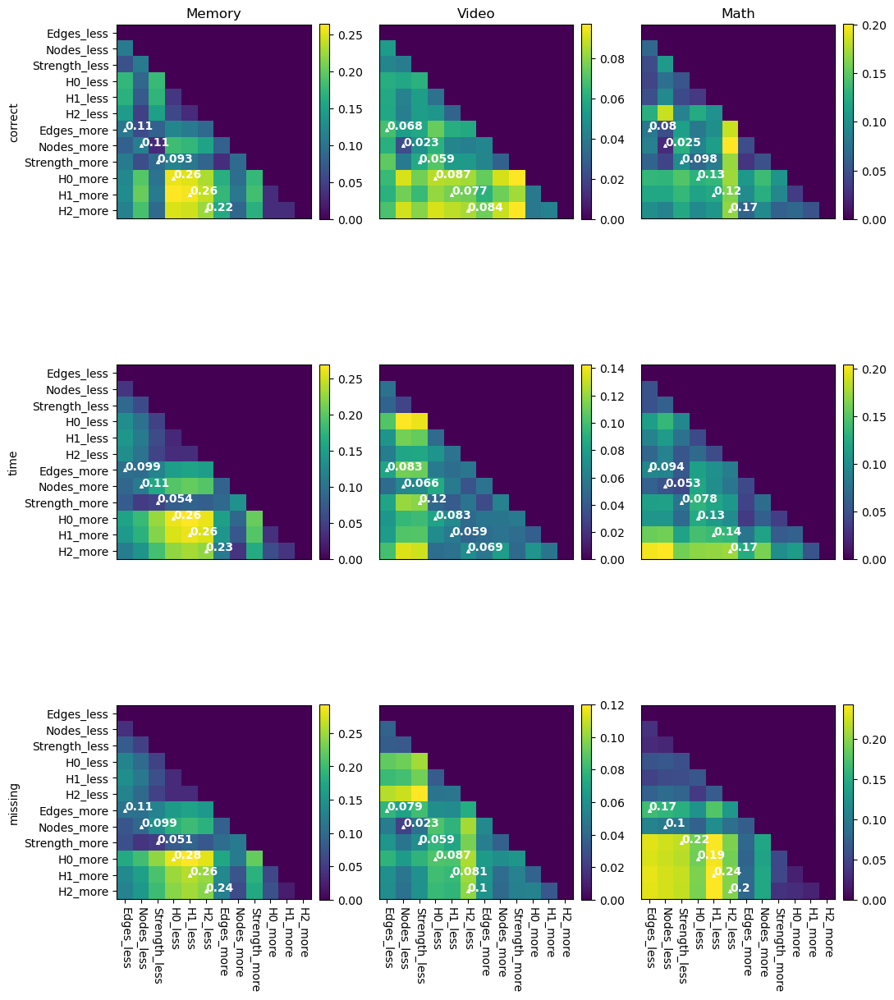

In [682]:
fig = plt.figure(num = 38,figsize=[5.5*2,7*2])

labels_x = []
labels_y = []
for cci, cc in enumerate(conditions_extended):    
    ccc = '{}_{}'.format(*conditions_extended[cc])    
    ccc = condition_labels_all[ccc]
    if cci<6:
        labels_x.append(ccc + '_less')
        labels_y.append(ccc + '_less')
    else:
        labels_x.append(ccc + '_more')
        labels_y.append(ccc + '_more')

for ei, e in enumerate(types_ce[2:], start=0):            

    for pi, perf in enumerate(performance, start=0):
        ax = plt.subplot(3, 3, 1+(3*pi+ei) )

        comparisons = np.zeros([len(conditions_extended),len(conditions_extended)])
        for c1, c2 in itertools.combinations_with_replacement(conditions_extended,2):
            cb1 = '{}_{}'.format(*conditions_extended[c1])
            if c1<6:
                data1 = outGraph_less[e][perf][cb1]        
            else:
                data1 = outGraph_more[e][perf][cb1]
            cb2 = '{}_{}'.format(*conditions_extended[c2])
            if c2<6:
                data2 = outGraph_less[e][perf][cb2]
            else:
                data2 = outGraph_more[e][perf][cb2]
            comparisons[c1,c2] = calcWeightedJaccard([data1,data2])

        im = plt.imshow(comparisons.T)    
        plt.colorbar(im,fraction=0.046, pad=0.04)
        for spotx, spoty in zip(np.arange(0,6),np.arange(6,12)):
            plt.text(spotx,spoty,'{:0.2}'.format(comparisons[spotx,spoty]),c='w', fontweight='bold')
        plt.scatter(np.arange(0,6),np.arange(6,12), marker='^', c='w', s=7)        

        if ei == 0:
            ax.set_yticks(np.arange(len(labels_y)))
            ax.set_yticklabels(labels_y)
            ax.set_ylabel(perf)
        else:
            ax.set_yticks([],[])
            
        if pi == 2:
            ax.set_xticks(np.arange(len(labels_x)))
            ax.set_xticklabels(labels_x,rotation = -90)
        else:
            ax.set_xticks([],[])
            
        if pi == 0:
            ax.set_title(goodStates[e])
            
plt.tight_layout()
plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure5_Performance.png')
plt.show()

In [202]:
performance.keys()

TypeError: 'dict_keys' object is not subscriptable

0it [00:00, ?it/s]/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
1it [00:13, 13.43s/it]/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
3it [00:39, 13.32s/it]


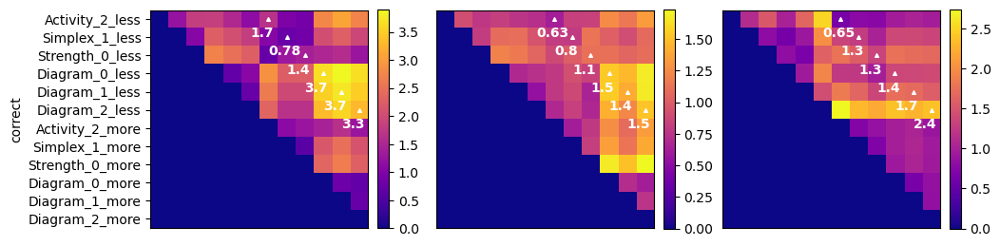

In [188]:
fig = plt.figure(num = 38,figsize=[5.5*2,7*2])

labels_x = []
labels_y = []
for cci, cc in enumerate(conditions_extended):    
    ccc = '{}_{}'.format(*conditions_extended[cc])    
    if cci<6:
        labels_x.append(ccc + '_less')
        labels_y.append(ccc + '_less')
    else:
        labels_x.append(ccc + '_more')
        labels_y.append(ccc + '_more')

for ei, e in tqdm(enumerate(types_ce[2:], start=0)):            

    for pi, perf in enumerate(['correct'], start=1):
        ax = plt.subplot(2, 3, 1+(3*pi+ei) )

        
        comparisons = np.zeros([len(conditions_extended),len(conditions_extended)])
        for c1, c2 in itertools.combinations_with_replacement(conditions_extended,2):
            cb1 = '{}_{}'.format(*conditions_extended[c1])
            if c1<6:
                data1 = outRips_less[e][perf][cb1]['dgms'][1]
            else:
                data1 = outRips_more[e][perf][cb1]['dgms'][1]
            cb2 = '{}_{}'.format(*conditions_extended[c2])
            if c2<6:
                data2 = outRips_less[e][perf][cb2]['dgms'][1]
            else:
                data2 = outRips_more[e][perf][cb2]['dgms'][1]
            comparisons[c1,c2] = slw(data1,data2,M=35)

        im = plt.imshow(comparisons,cmap='plasma')    
        plt.colorbar(im,fraction=0.046, pad=0.04)
        for spotx, spoty in zip(np.arange(0,6),np.arange(6,12)):
            plt.text(spoty-1,spotx+1,'{:0.2}'.format(comparisons[spotx,spoty]),c='w', fontweight='bold')
        plt.scatter(np.arange(6,12),np.arange(0,6), marker='^', c='w', s=7)        

        if ei == 0:
            ax.set_yticks(np.arange(len(labels_y)))
            ax.set_yticklabels(labels_y)
            ax.set_ylabel(perf)
        else:
            ax.set_yticks([],[])
            
        if pi == 2:
            ax.set_xticks(np.arange(len(labels_x)))
            ax.set_xticklabels(labels_x,rotation = -90)
        else:
            ax.set_xticks([],[])
            
        if pi == 0:
            ax.set_title(goodStates[e])
            
#plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure4_slw.png')
plt.show()


In [ ]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

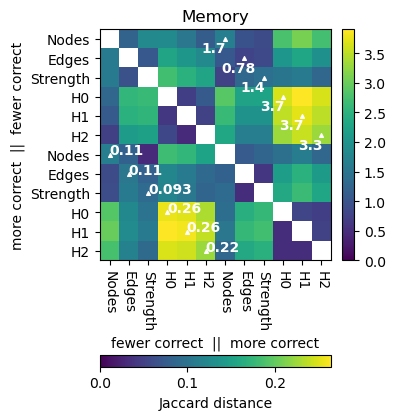

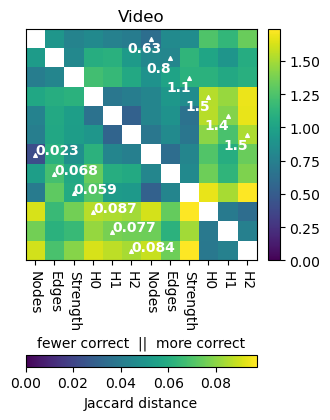

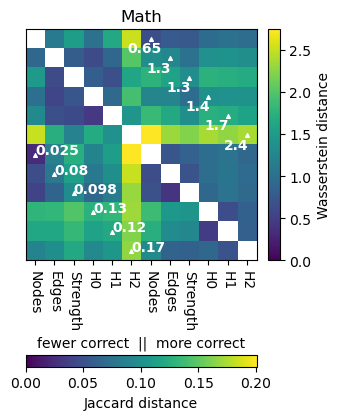

In [225]:
#fig = plt.figure(num = 39)#,figsize=[5.5*2,7*2], dpi=300)

labels_x = []
labels_y = []
for cci, cc in enumerate(conditions_extended):    
    ccc = '{}_{}'.format(*conditions_extended[cc])    
    if cci<6:
        labels_x.append(ccc + '_less')
        labels_y.append(ccc + '_less')
    else:
        labels_x.append(ccc + '_more')
        labels_y.append(ccc + '_more')

for ei, e in enumerate(types_ce[2:], start=0):            

    for pi, perf in enumerate(['correct'], start=0):
        fig = plt.figure(num = 39+ei,figsize=[3,3])
        ax = plt.subplot(111)
        #ax = plt.subplot(1, 3, 1+ei )        
        #ax.set_xticks([])
        #ax.set_xticklabels([])
        ax.set_yticks(np.arange(len(labels_y)))
        
        ax.set_xticks(np.arange(len(labels_x)))
        ax.set_xticklabels(labels_x,rotation = -90)
        ax.set_xticklabels([
                'Nodes',
                'Edges',
                'Strength',
                'H0',
                'H1',
                'H2',
                'Nodes',
                'Edges',
                'Strength',
                'H0',
                'H1',
                'H2',               
            ])
        ax.set_xlabel('fewer correct  ||  more correct')        
        
        ax.set_title(goodStates[e])

        comparisons = np.zeros([len(conditions_extended),len(conditions_extended)])
        for c1, c2 in itertools.combinations_with_replacement(conditions_extended,2):
            cb1 = '{}_{}'.format(*conditions_extended[c1])
            if c1<6:
                data1 = outGraph_less[e][perf][cb1]        
            else:
                data1 = outGraph_more[e][perf][cb1]
            cb2 = '{}_{}'.format(*conditions_extended[c2])
            if c2<6:
                data2 = outGraph_less[e][perf][cb2]
            else:
                data2 = outGraph_more[e][perf][cb2]
            comparisons[c1,c2] = calcWeightedJaccard([data1,data2])

        mcomp = np.ma.masked_where(comparisons == 0, comparisons)
        im1 = ax.imshow(mcomp.T, cmap=plt.cm.viridis, vmin=0)
        for spotx, spoty in zip(np.arange(0,6),np.arange(6,12)):
            ax.text(spotx,spoty,'{:0.2}'.format(comparisons[spotx,spoty]),c='w', fontweight='bold')
        ax.scatter(np.arange(0,6),np.arange(6,12), marker='^', c='w', s=7)                
        
        axins1 = inset_axes(ax,
                   width="100%",  # width = 5% of parent_bbox width
                   height="5%",  # height : 50%
                   loc='lower left',
                   bbox_to_anchor=(0, -0.46, 1, 1),
                   bbox_transform=ax.transAxes,
                   borderpad=0,
                   )
        
        cbar = fig.colorbar(im1, cax=axins1, orientation="horizontal")
        axins1.xaxis.set_ticks_position("bottom")
        cbar.ax.set_xlabel('Jaccard distance')


        # now do the same for Rips distances
        
        
        comparisons = np.zeros([len(conditions_extended),len(conditions_extended)])
        for c1, c2 in itertools.combinations_with_replacement(conditions_extended,2):
            cb1 = '{}_{}'.format(*conditions_extended[c1])
            if c1<6:
                data1 = outRips_less[e][perf][cb1]['dgms'][1]
            else:
                data1 = outRips_more[e][perf][cb1]['dgms'][1]
            cb2 = '{}_{}'.format(*conditions_extended[c2])
            if c2<6:
                data2 = outRips_less[e][perf][cb2]['dgms'][1]
            else:
                data2 = outRips_more[e][perf][cb2]['dgms'][1]
            comparisons[c1,c2] = slw(data1,data2,M=35)
        
        mcomp = np.ma.masked_where(comparisons == 0, comparisons)
        im2 = ax.imshow(mcomp, cmap=plt.cm.viridis, vmin=0)
        for spotx, spoty in zip(np.arange(0,6),np.arange(6,12)):
            ax.text(spoty-1.2,spotx+0.7,'{:0.2}'.format(comparisons[spotx,spoty]),c='w', fontweight='bold')
        ax.scatter(np.arange(6,12),np.arange(0,6), marker='^', c='w', s=7)        
        
        axins2 = inset_axes(ax,
                           width="5%",  # width = 5% of parent_bbox width
                           height="100%",  # height : 50%
                           loc='lower left',
                           bbox_to_anchor=(1.05, 0, 1, 1),
                           bbox_transform=ax.transAxes,
                           borderpad=0,
                           )
        cbar = fig.colorbar(im2, cax=axins2)
        
        if ei == 2:
             cbar.ax.set_ylabel('Wasserstein distance')
                
        if ei == 0:
            ax.set_yticks(np.arange(len(labels_y)))
            ax.set_yticklabels([
                'Nodes',
                'Edges',
                'Strength',
                'H0',
                'H1',
                'H2',
                'Nodes',
                'Edges',
                'Strength',
                'H0',
                'H1',
                'H2',               
            ])
            ax.set_ylabel('more correct  ||  fewer correct')        
        else:
            ax.set_yticks([])
            ax.set_yticklabels([])
        
        baseloc = '/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresAugust/'
        plt.savefig(baseloc + 'Figure5_part{}.png'.format(ei),
           dpi = 300, bbox_inches='tight')
        plt.show()

In [185]:
fig.dist

AttributeError: 'Figure' object has no attribute 'dist'

In [147]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

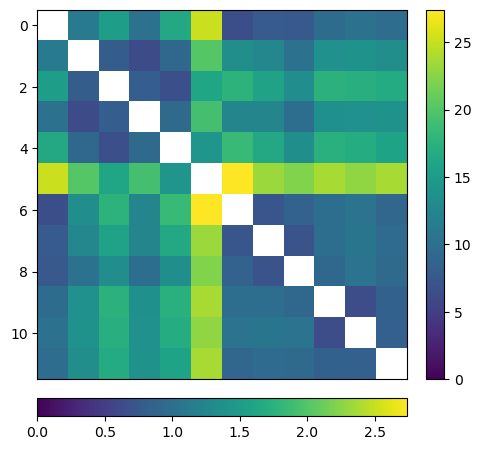

In [159]:
mcomp = np.ma.masked_where(comparisons == 0, comparisons)

fig = plt.figure(frameon=False)
ax = plt.subplot(111)
ax.set_xticks([])
ax.set_xticklabels([])

axins1 = inset_axes(ax,
                   width="100%",  # width = 5% of parent_bbox width
                   height="5%",  # height : 50%
                   loc='lower left',
                   bbox_to_anchor=(0, -0.1, 1, 1),
                   bbox_transform=ax.transAxes,
                   borderpad=0,
                   )

im1 = ax.imshow(mcomp, cmap=plt.cm.viridis, vmin=0)
fig.colorbar(im1, cax=axins1, orientation="horizontal")
axins1.xaxis.set_ticks_position("bottom")

axins2 = inset_axes(ax,
                   width="5%",  # width = 5% of parent_bbox width
                   height="100%",  # height : 50%
                   loc='lower left',
                   bbox_to_anchor=(1.05, 0., 1, 1),
                   bbox_transform=ax.transAxes,
                   borderpad=0,
                   )

im2 = ax.imshow(mcomp.T*10, cmap=plt.cm.viridis, vmin=0)
fig.colorbar(im2, cax=axins2)


/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


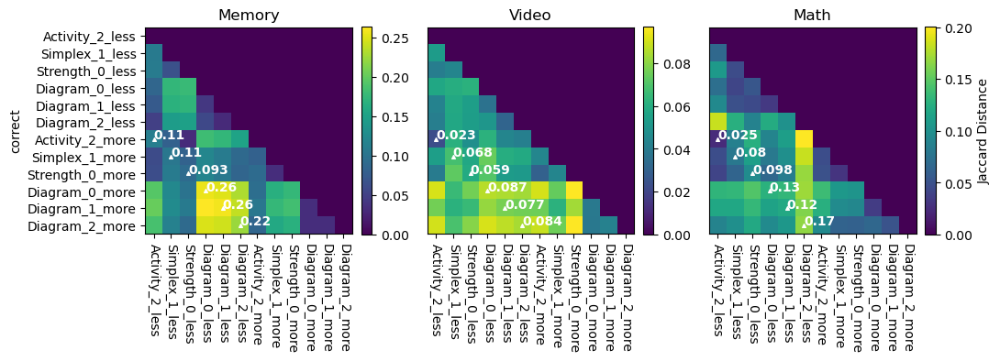

1it [00:14, 14.68s/it]/home/Jacob/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
3it [00:40, 13.59s/it]


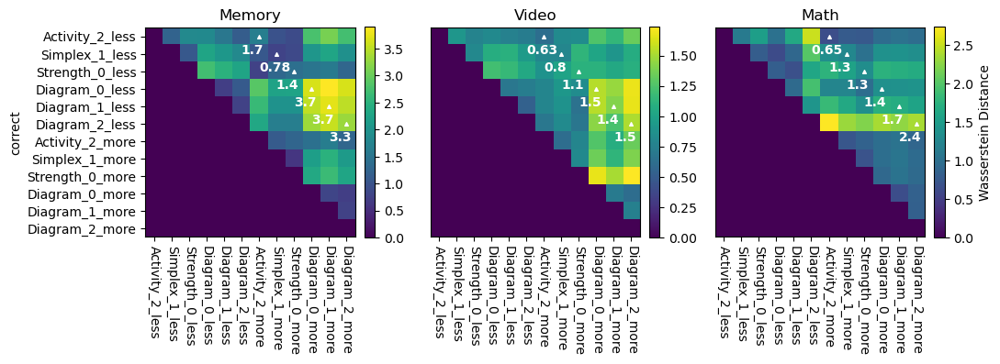

In [165]:
fig = plt.figure(num = 38,figsize=[5.5*2,7*2])

labels_x = []
labels_y = []
for cci, cc in enumerate(conditions_extended):    
    ccc = '{}_{}'.format(*conditions_extended[cc])    
    if cci<6:
        labels_x.append(ccc + '_less')
        labels_y.append(ccc + '_less')
    else:
        labels_x.append(ccc + '_more')
        labels_y.append(ccc + '_more')

for ei, e in enumerate(types_ce[2:], start=0):            

    for pi, perf in enumerate(['correct'], start=0):
        ax = plt.subplot(2, 3, 1+(3*pi+ei) )

        comparisons = np.zeros([len(conditions_extended),len(conditions_extended)])
        for c1, c2 in itertools.combinations_with_replacement(conditions_extended,2):
            cb1 = '{}_{}'.format(*conditions_extended[c1])
            if c1<6:
                data1 = outGraph_less[e][perf][cb1]        
            else:
                data1 = outGraph_more[e][perf][cb1]
            cb2 = '{}_{}'.format(*conditions_extended[c2])
            if c2<6:
                data2 = outGraph_less[e][perf][cb2]
            else:
                data2 = outGraph_more[e][perf][cb2]
            comparisons[c1,c2] = calcWeightedJaccard([data1,data2])

        im = plt.imshow(comparisons.T)    
        cbar = plt.colorbar(im,fraction=0.046, pad=0.04)
        for spotx, spoty in zip(np.arange(0,6),np.arange(6,12)):
            plt.text(spotx,spoty,'{:0.2}'.format(comparisons[spotx,spoty]),c='w', fontweight='bold')
        plt.scatter(np.arange(0,6),np.arange(6,12), marker='^', c='w', s=7)        

        if ei == 0:
            ax.set_yticks(np.arange(len(labels_y)))
            ax.set_yticklabels(labels_y)
            ax.set_ylabel(perf)        
        else:
            ax.set_yticks([],[])
            
        if pi == 0:
            ax.set_xticks(np.arange(len(labels_x)))
            ax.set_xticklabels(labels_x,rotation = -90)
        else:
            ax.set_xticks([],[])
            
        if pi == 0:
            ax.set_title(goodStates[e])
            
        if ei == 2:
             cbar.ax.set_ylabel('Jaccard Distance')

plt.tight_layout()                
#plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure5_PerformanceJaccard.png')
plt.show()

fig = plt.figure(num = 39,figsize=[5.5*2,7*2])

for ei, e in tqdm(enumerate(types_ce[2:], start=0)):            

    for pi, perf in enumerate(['correct'], start=1):
        ax = plt.subplot(2, 3, 1+(3*pi+ei) )

        comparisons = np.zeros([len(conditions_extended),len(conditions_extended)])
        for c1, c2 in itertools.combinations_with_replacement(conditions_extended,2):
            cb1 = '{}_{}'.format(*conditions_extended[c1])
            if c1<6:
                data1 = outRips_less[e][perf][cb1]['dgms'][1]
            else:
                data1 = outRips_more[e][perf][cb1]['dgms'][1]
            cb2 = '{}_{}'.format(*conditions_extended[c2])
            if c2<6:
                data2 = outRips_less[e][perf][cb2]['dgms'][1]
            else:
                data2 = outRips_more[e][perf][cb2]['dgms'][1]
            comparisons[c1,c2] = slw(data1,data2,M=35)

        im = plt.imshow(comparisons)    
        cbar = plt.colorbar(im,fraction=0.046, pad=0.04)
        for spotx, spoty in zip(np.arange(0,6),np.arange(6,12)):
            plt.text(spoty-1,spotx+1,'{:0.2}'.format(comparisons[spotx,spoty]),c='w', fontweight='bold')
        plt.scatter(np.arange(6,12),np.arange(0,6), marker='^', c='w', s=7)        

        if ei == 0:
            ax.set_yticks(np.arange(len(labels_y)))
            ax.set_yticklabels(labels_y)
            ax.set_ylabel(perf)
        else:
            ax.set_yticks([],[])
            
        if pi == 1:
            ax.set_xticks(np.arange(len(labels_x)))
            ax.set_xticklabels(labels_x,rotation = -90)
            ax.set_title(goodStates[e])
        else:
            ax.set_xticks([],[])
            
        if ei == 2:
             cbar.ax.set_ylabel('Wasserstein Distance')

plt.tight_layout()                
#plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure5_PerformanceWasserstein.png')
plt.show()

In [28]:
import umap

In [239]:
reducer_3 = umap.UMAP(n_neighbors=15, n_components=3, metric='precomputed', n_epochs=None, 
                    learning_rate=1.0, init=np.random.rand(328,3), min_dist=0.1, spread=1.0, 
                    set_op_mix_ratio=1.0, local_connectivity=1.0, repulsion_strength=1.0, 
                    negative_sample_rate=5, transform_queue_size=4.0, a=None, b=None, 
                    random_state=None, metric_kwds=None, angular_rp_forest=False, 
                    target_n_neighbors=-1, target_metric='categorical', target_metric_kwds=None,
                    target_weight=0.5, transform_seed=42, verbose=False)

In [357]:
gg = reducer_3.fit_transform(squareform(outGraph_more[3]['correct']['Diagram_1']))

In [30]:
gg.shape

(328, 2)

In [40]:
squareform(outGraph_less[3]['correct']['Diagram_1']).shape

(328, 328)

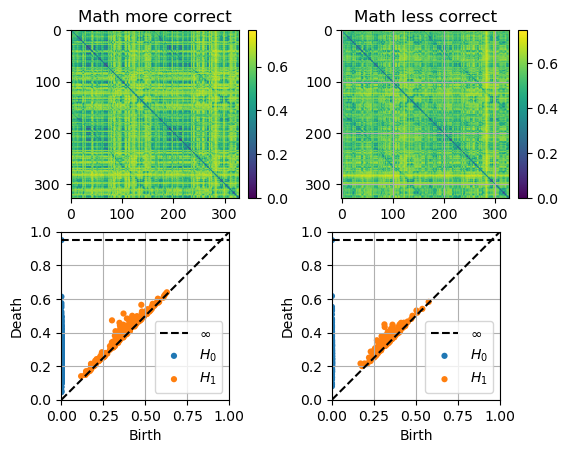

In [404]:
for e in range(3,6):
    plt.clf()
    plt.figure(1)
    plt.subplot(2,2,1)
    plt.imshow(squareform(outGraph_more[e]['correct']['Diagram_1']))
    plt.title(goodStates[e] + ' more correct')
    #plt.colorbar(orientation='horizontal')
    plt.colorbar(fraction=0.046, pad=0.04)

    plt.subplot(2,2,2)
    plt.imshow(squareform(outGraph_less[e]['correct']['Diagram_1']))
    plt.title(goodStates[e] + ' less correct')
    #plt.colorbar(orientation='horizontal')
    plt.colorbar(fraction=0.046, pad=0.04)
    plt.grid()
    
    plt.subplot(2,2,3)
    plot_diagrams(outRips_more[e]['correct']['Diagram_1']['dgms'],xy_range=[0,1,0,1])
    plt.grid()
    
    plt.subplot(2,2,4)
    plot_diagrams(outRips_less[e]['correct']['Diagram_1']['dgms'],xy_range=[0,1,0,1])
    plt.grid()
    
    
    plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/FigureS_meanGraphMatrices_{}.png'.format(goodStates[e]))
    
    
    

In [397]:
help(plt.xticks)

Help on function xticks in module matplotlib.pyplot:

xticks(ticks=None, labels=None, **kwargs)
    Get or set the current tick locations and labels of the x-axis.
    
    Pass no arguments to return the current values without modifying them.
    
    Parameters
    ----------
    ticks : array-like, optional
        The list of xtick locations.  Passing an empty list removes all xticks.
    labels : array-like, optional
        The labels to place at the given *ticks* locations.  This argument can
        only be passed if *ticks* is passed as well.
    **kwargs
        `.Text` properties can be used to control the appearance of the labels.
    
    Returns
    -------
    locs
        The list of xtick locations.
    labels
        The list of xlabel `.Text` objects.
    
    Notes
    -----
    Calling this function with no arguments (e.g. ``xticks()``) is the pyplot
    equivalent of calling `~.Axes.get_xticks` and `~.Axes.get_xticklabels` on
    the current axes.
    Calling this

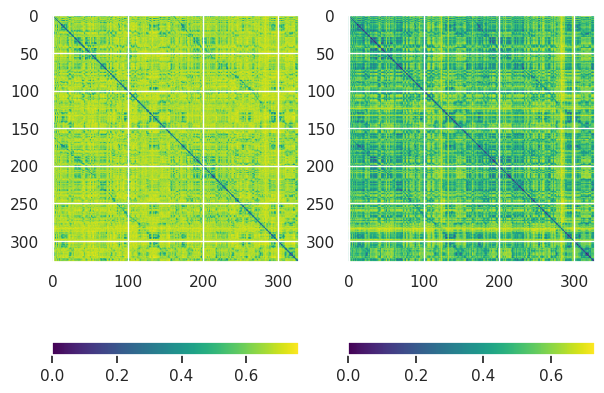

In [205]:
plt.figure(figsize=[7,7])

plt.subplot(1,2,1)
plt.imshow(squareform(outGraph_more[3]['correct']['Diagram_1']), cmap='viridis')
plt.colorbar(orientation='horizontal')

plt.subplot(1,2,2)
plt.imshow(squareform(outGraph_less[3]['correct']['Diagram_1']), cmap='viridis')
plt.colorbar(orientation='horizontal')

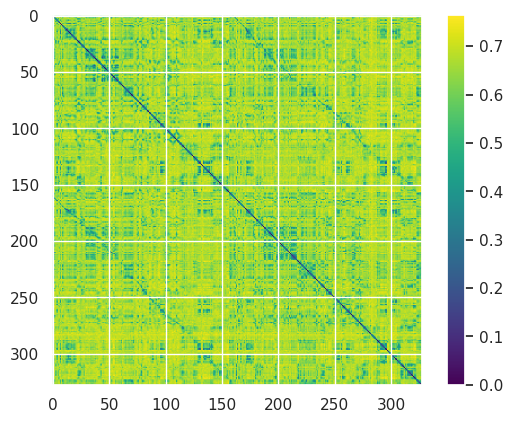

In [202]:
plt.imshow(squareform(outGraph_more[3]['correct']['Diagram_1']), cmap='viridis')
plt.colorbar()

In [13]:
import gudhi
nerve_complex = gudhi.CoverComplex()
nerve_complex.set_verbose(True)

In [14]:
nerve_complex.set_distances_from_range(squareform(outGraph_more[3]['correct']['Diagram_1']))

In [15]:
nerve_complex.set_type('Nerve')

In [16]:
nerve_complex.set_graph_from_automatic_rips()

0.641923625885077

In [24]:
clusterer = cluster.AgglomerativeClustering(n_clusters=60,affinity='precomputed', linkage='average')

In [25]:
clusts = clusterer.fit_predict(squareform(outGraph_more[3]['correct']['Diagram_1']))

In [28]:
np.savetxt('clusts.txt',clusts,fmt='%i')

In [ ]:
nerve_complex.set_cover_from_file('clusts.txt')


In [ ]:
    nerve_complex.set_color_from_coordinate(2)
    nerve_complex.set_function_from_coordinate(2)
    nerve_complex.set_graph_from_OFF()
    nerve_complex.set_resolution_with_interval_number(10)
    nerve_complex.set_gain(0.3)
    nerve_complex.set_cover_from_function()
    nerve_complex.find_simplices()
    nerve_complex.write_info()
    simplex_tree = nerve_complex.create_simplex_tree()
    nerve_complex.compute_PD()
    result_str = 'Nerve is of dimension ' + repr(simplex_tree.dimension()) + ' - ' + \
        repr(simplex_tree.num_simplices()) + ' simplices - ' + \
        repr(simplex_tree.num_vertices()) + ' vertices.'
    print(result_str)
    for filtered_value in simplex_tree.get_filtration():
        print(filtered_value[0])

In [45]:
np.histogram(masks['centroids'])

(array([ 26, 159, 154, 121,  26,  16,  45,  48,  44,  17]),
 array([-193.08157349, -104.62298889,  -16.1644043 ,   72.2941803 ,
         160.75276489,  249.21134949,  337.66993408,  426.12851868,
         514.58710327,  603.04568787,  691.50427246]))

In [24]:
msk = masks['centroids']
msk[:,0]-=250
gg=msk

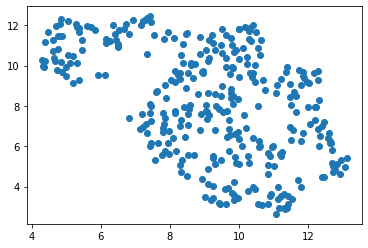

In [55]:
plt.scatter(*hh.T)

In [14]:
import umap

In [27]:
highD = squareform(outGraph_more[3]['correct']['Diagram_1'])

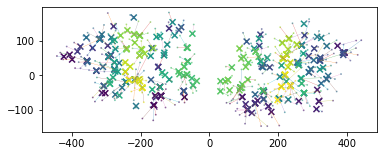

In [36]:
reducer_2 = umap.UMAP(n_neighbors=15, n_components=2, metric='precomputed', n_epochs=None, 
                    learning_rate=1.0, init=msk, min_dist=0.4, spread=1, 
                    set_op_mix_ratio=1.0, local_connectivity=1.0, repulsion_strength=1, 
                    negative_sample_rate=5, transform_queue_size=3.0, a=None, b=None, 
                    random_state=None, metric_kwds=None, angular_rp_forest=False, 
                    target_n_neighbors=-1, target_metric='categorical', target_metric_kwds=None,
                    target_weight=0.5, transform_seed=42, verbose=False)
highD = squareform(outGraph_less[3]['correct']['Diagram_1'])
hh = reducer_2.fit_transform(highD)


plt.scatter(*hh.T,c=np.arange(328), marker='x' )
plt.scatter(*msk.T,c=np.arange(328), marker='.', alpha=0.5, s=3)
plt.plot(np.array([msk.T[0,:],hh.T[0,:]]),np.array([msk.T[1,:],hh.T[1,:]]),linewidth=0.2)
plt.axis('scaled')
plt.show()

In [360]:
gg = masks['centroids']

In [329]:
hh = reducer_2.fit_transform(squareform(outGraph_more[3]['correct']['Diagram_1']))

In [28]:
szs = np.mean(highD,axis=0)
np.histogram(szs)

(array([ 6, 21, 42, 75, 84, 70, 19,  8,  2,  1]),
 array([0.60121376, 0.61191861, 0.62262346, 0.6333283 , 0.64403315,
        0.654738  , 0.66544285, 0.67614769, 0.68685254, 0.69755739,
        0.70826223]))

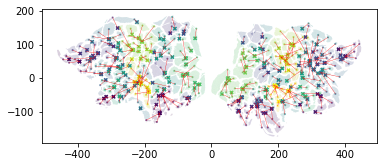

In [35]:
ax = plt.subplot(111)
ax.set_ylim(ylim)
ax.set_xlim(xlim)

cmap = plt.get_cmap('viridis',334)

polyobs = {}

for seg in polyset:
    patches = [Polygon(tri, edgecolor = None, facecolor=cmap(seg), alpha=0.2) for tri in polyset[seg]]
    polyobs[seg] = PatchCollection(patches,match_original=True)
    ax.add_collection(polyobs[seg])

szs = np.mean(highD,axis=0)
plt.scatter(*hh.T,c=np.arange(328), marker='x', s=szs*16)
plt.scatter(*gg.T,c=np.arange(328), marker='.', alpha=0.5, s=6)
plt.plot(np.array([gg.T[0,:],hh.T[0,:]]),np.array([gg.T[1,:],hh.T[1,:]]),linewidth=0.3, color='r')
plt.axis('scaled')
plt.show()

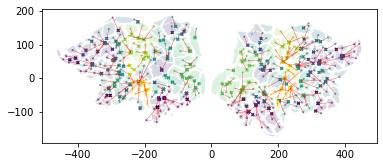

In [40]:
ax = plt.subplot(111)
ax.set_ylim(ylim)
ax.set_xlim(xlim)

cmap = plt.get_cmap('viridis',334)

polyobs = {}

missingVoxels = [133, 296, 299, 302, 304]

for seg in list(set(polyset.keys()) - set(missingVoxels)):
    patches = [Polygon(tri, edgecolor = None, facecolor=cmap(seg), alpha=0.2) for tri in polyset[seg]]
    polyobs[seg] = PatchCollection(patches,match_original=True)
    ax.add_collection(polyobs[seg])

szs = np.mean(highD,axis=0)
plt.scatter(*hh.T,c=np.arange(328), marker='x', s=szs*16)
plt.scatter(*gg.T,c=np.arange(328), marker='.', alpha=0.5, s=6)
plt.plot(np.array([gg.T[0,:],hh.T[0,:]]),np.array([gg.T[1,:],hh.T[1,:]]),linewidth=0.3, color='r')
plt.axis('scaled')
plt.show()

In [38]:
len(polyset)

333

In [31]:
help(plt.plot)

Help on function plot in module matplotlib.pyplot:

plot(*args, scalex=True, scaley=True, data=None, **kwargs)
    Plot y versus x as lines and/or markers.
    
    Call signatures::
    
        plot([x], y, [fmt], *, data=None, **kwargs)
        plot([x], y, [fmt], [x2], y2, [fmt2], ..., **kwargs)
    
    The coordinates of the points or line nodes are given by *x*, *y*.
    
    The optional parameter *fmt* is a convenient way for defining basic
    formatting like color, marker and linestyle. It's a shortcut string
    notation described in the *Notes* section below.
    
    >>> plot(x, y)        # plot x and y using default line style and color
    >>> plot(x, y, 'bo')  # plot x and y using blue circle markers
    >>> plot(y)           # plot y using x as index array 0..N-1
    >>> plot(y, 'r+')     # ditto, but with red plusses
    
    You can use `.Line2D` properties as keyword arguments for more
    control on the appearance. Line properties and *fmt* can be mixed.
    The f

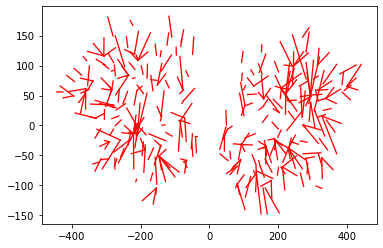

In [34]:
plt.plot(np.array([gg.T[0,:],hh.T[0,:]]),np.array([gg.T[1,:],hh.T[1,:]]),linewidth=1.3, color='r', solid_capstyle='projecting')
plt.show()

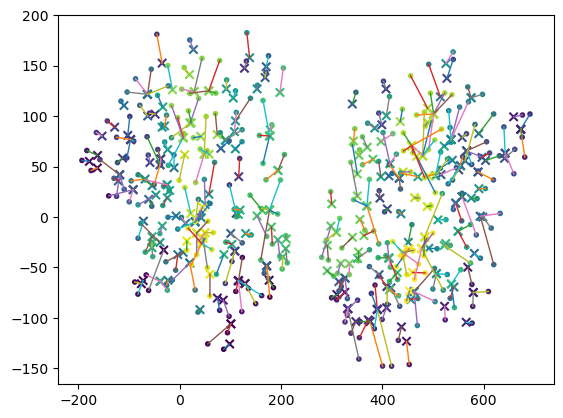

In [330]:
plt.scatter(*hh.T,c=np.arange(328), marker='x')
plt.scatter(*gg.T,c=np.arange(328), marker='.')
plt.plot(np.array([gg.T[0,:],hh.T[0,:]]),np.array([gg.T[1,:],hh.T[1,:]]),linewidth=1)
plt.show()

In [34]:
def getFlatBrain():
    # load data
    with open('flatBrainMasks.pkl','rb')as file:
        masks = pickle.load(file)

    # draw all polygons
    polyset = {}
    sides = ['L','R']

    ylim = [0,0]
    xlim = [0,0]

    for side in [1,2]:    
        sideMask = masks['brainlocs']==side
        segs = np.unique(masks['gordon'][sideMask])
        segs = segs[~np.isnan(segs)]
        segs = segs[segs>0].astype('int')
        for seg in segs:
            polyset[seg] = []
            #asegment = masks['gordon']==seg
            #asegmentside = asegment[sideMask]
            #polyset[sides[side-1]][seg]['points'] = masks['vert'+sides[side]][asegmentside,:2]
            #polyset[sides[side-1]][seg]['point_inds'] = set(np.arange(len(asegmentside))[asegmentside])    
            #polyset[sides[side-1]][seg]['polys'] = []

        segsArray = masks['gordon'][sideMask].astype('int')
        faces = masks['face'+sides[side-1]]
        for face in faces:
            seg = np.unique([segsArray[i-1] for i in face])
            kk = len(seg)
            if kk==1 and not any(seg<1):
                seg = seg[0]
                temp = np.array([masks['vert'+sides[side-1]][ff,:2] for ff in face])
                if not any(np.all(temp==0,axis=1)) and not any(pdist(temp)>10):
                    polyset[seg].append(temp)

                ylim[0] = min(ylim[0],min(temp[:,1]))
                ylim[1] = max(ylim[1],max(temp[:,1]))
                xlim[0] = min(xlim[0],min(temp[:,0]))
                xlim[1] = max(xlim[1],max(temp[:,0]))

    return masks, polyset, ylim, xlim

In [35]:
masks,polyset,ylim,xlim = getFlatBrain()

In [36]:
masks['centroids'][:,0] -= 250

In [37]:
conditions_extended = conditions.copy()
for condition in conditions:
    conditions_extended[condition+6] = conditions[condition]

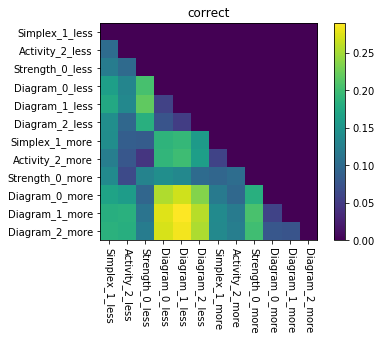

In [417]:
comparisons = np.zeros([len(conditions_extended),len(conditions_extended)])
for c1, c2 in itertools.combinations_with_replacement(conditions_extended,2):
    cb1 = '{}_{}'.format(*conditions_extended[c1])
    if c1<6:
        data1 = outGraph_less[cb1]        
    else:
        data1 = outGraph_more[cb1]
    cb2 = '{}_{}'.format(*conditions_extended[c2])
    if c2<6:
        data2 = outGraph_less[cb2]
    else:
        data2 = outGraph_more[cb2]
    comparisons[c1,c2] = calcWeightedJaccard([data1,data2])

    
labels_x = []
labels_y = []
for cc in conditions_extended:    
    ccc = '{}_{}'.format(*conditions_extended[cc])    
    if cc<6:
        labels_x.append(ccc + '_less')
        labels_y.append(ccc + '_less')
    else:
        labels_x.append(ccc + '_more')
        labels_y.append(ccc + '_more')
    
ax = plt.subplot(111)
plt.imshow(comparisons.T)
ax.set_title(perf)
plt.colorbar()

ax.set_yticks(np.arange(len(outGraph_less)*2))
ax.set_yticklabels(labels_y)
ax.set_xticks(np.arange(len(outGraph_less)*2))
ax.set_xticklabels(labels_x,rotation = -90)

plt.show()

###  Compare wrt single coarse graph

In [ ]:
def coarsen(GG,grain):
    
    clusts = fcluster(GG['linkage'], t=grain, criterion='maxclust')
    categories = np.unique(clusts)
    G_out = []
    for c1, c2 in itertools.combinations(categories,2):
        u = clusts==c1
        v = clusts==c2
        G_out.append( 1/(np.sum(u)*np.sum(v)) * np.sum(GG['graphs'][grain0][u,:][:,v]) )
        
    G_out = squareform(np.array(G_out))
    return G_out

GG = {}
GG['graphs'] = {}
GG['dgms'] = {}
GG['dgMax'] = {}
GG['landscape'] = {}
grain0 = 333

e=5

GG['graphs'][grain0] = squareform(outGraph_more[e]['correct']['Diagram_1'])
GG['linkage'] = average(squareform(GG['graphs'][grain0]))
rip = ripser(GG['graphs'][grain0], maxdim=1, thresh=np.inf, distance_matrix=True)
GG['dgms'][grain0] = rip['dgms'][1]
dgMax = np.argmax(np.diff(GG['dgms'][grain0],axis=1))
GG['dgMax'][grain0] = [dgMax, *GG['dgms'][grain0][dgMax], np.diff(GG['dgms'][grain0][dgMax])[0]]
GG['landscape'][grain0] = doLandscape(GG['dgms'][grain0])

In [ ]:
def coarsen(GG,grain):
    
    clusts = fcluster(GG['linkage'], t=grain, criterion='maxclust')
    categories = np.unique(clusts)
    G_out = []
    for c1, c2 in itertools.combinations(categories,2):
        u = clusts==c1
        v = clusts==c2
        G_out.append( 1/(np.sum(u)*np.sum(v)) * np.sum(GG['graphs'][grain0][u,:][:,v]) )
        
    G_out = squareform(np.array(G_out))
    return G_out


GG = {}
GG['graphs'] = {}
GG['dgms'] = {}
GG['dgMax'] = {}
GG['landscape'] = {}
grain0 = 333

e=4

GG['graphs'][grainA] = squareform(outGraph_average)
GG['graphs'][grain0] = squareform(outGraph_less[e]['correct']['Diagram_1'])
GG['linkage'] = average(squareform(GG['graphs'][grainA]))
rip = ripser(GG['graphs'][grain0], maxdim=1, thresh=np.inf, distance_matrix=True)

GG['dgms'][grain0] = rip['dgms'][1]
dgMax = np.argmax(np.diff(GG['dgms'][grain0],axis=1))
GG['dgMax'][grain0] = [dgMax, *GG['dgms'][grain0][dgMax], np.diff(GG['dgms'][grain0][dgMax])[0]]
GG['landscape'][grain0] = doLandscape(GG['dgms'][grain0])

clusts = fcluster(GG['linkage'], t=50, criterion='maxclust')

for grain in np.arange(grain0)[:4:-1]:
    GG['graphs'][grain] = coarsen(GG,grain)
    rip = ripser(GG['graphs'][grain], maxdim=1, thresh=np.inf, distance_matrix=True)
    GG['dgms'][grain] = rip['dgms'][1]
    dgMax = np.argmax(np.diff(GG['dgms'][grain],axis=1))
    GG['dgMax'][grain] = [dgMax, *GG['dgms'][grain][dgMax], np.diff(GG['dgms'][grain][dgMax])[0]]
    GG['landscape'][grain] = doLandscape(GG['dgms'][grain])
        
    print([grain, *GG['dgMax'][grain]])
    plt.plot(GG['landscape'][grain+1].T)
    

###  Compare coarsened networks

In [1]:
from scipy.cluster.hierarchy import average, fcluster


In [127]:
from ripser import ripser

In [301]:
from gudhi.representations import Landscape
L_resolution = 333
L_numLandscapes = 1 
L_fun = Landscape(resolution=L_resolution, num_landscapes=L_numLandscapes)

In [302]:
def doLandscape(dgm):
    if len(dgm)>0:
        L = L_fun.fit_transform([dgm])
    else:
        L = np.zeros(L_resolution)
    return L

In [ ]:
def coarsen(GG,grain):
    
    clusts = fcluster(GG['linkage'], t=grain, criterion='maxclust')
    categories = np.unique(clusts)
    G_out = []
    for c1, c2 in itertools.combinations(categories,2):
        u = clusts==c1
        v = clusts==c2
        G_out.append( 1/(np.sum(u)*np.sum(v)) * np.sum(GG['graphs'][grain0][u,:][:,v]) )
        
    G_out = squareform(np.array(G_out))

    return G_out

In [42]:
from sklearn.decomposition import NMF, FastICA

In [208]:
nreducer = NMF(n_components=8)
hh = nreducer.fit_transform(squareform(outGraph_more[e]['correct']['Diagram_1']))
hh.shape

/home/Jacob/anaconda3/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1077: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


(328, 8)

In [211]:
np.sum(hh,axis=0)

array([132.07482174, 134.54248706,  52.38670107,  88.66490151,
        75.33753688,  27.41277517,  64.9618885 ,  33.73329334])

In [464]:
GG = {}
GG['graphs'] = {}
GG['dgms'] = {}
GG['dgMax'] = {}
GG['landscape'] = {}
grain0 = 333

e=5

GG['graphs'][grain0] = squareform(outGraph_more[e]['correct']['Diagram_1'])
GG['linkage'] = average(squareform(GG['graphs'][grain0]))
rip = ripser(GG['graphs'][grain0], maxdim=1, thresh=np.inf, distance_matrix=True)
GG['dgms'][grain0] = rip['dgms'][1]
dgMax = np.argmax(np.diff(GG['dgms'][grain0],axis=1))
GG['dgMax'][grain0] = [dgMax, *GG['dgms'][grain0][dgMax], np.diff(GG['dgms'][grain0][dgMax])[0]]
GG['landscape'][grain0] = doLandscape(GG['dgms'][grain0])

In [77]:
apath  = '/keilholz-lab/Jacob/TDABrains_00/data/FCStateClassif/anat/'

vloc = apath   
volunteers, restDirs, taskDirs, EVtxt, Blocks, Blockstxt = p_utils.getLists(vloc=vloc)

nVols = len(volunteers)

print('nVols is {}'.format(nVols))

adata = []
for voln in volunteers:
    """Perform calculations of inter-volunteer dynamics"""
    temp = np.load(vloc + voln ).T        
    adata.append(np.delete(temp, p_utils.missingVoxels, axis=0))


    

['SBJ01_Gordon333.npy', 'SBJ02_Gordon333.npy', 'SBJ03_Gordon333.npy', 'SBJ04_Gordon333.npy', 'SBJ06_Gordon333.npy', 'SBJ07_Gordon333.npy', 'SBJ08_Gordon333.npy', 'SBJ09_Gordon333.npy', 'SBJ10_Gordon333.npy', 'SBJ12_Gordon333.npy', 'SBJ13_Gordon333.npy', 'SBJ14_Gordon333.npy', 'SBJ15_Gordon333.npy', 'SBJ16_Gordon333.npy', 'SBJ17_Gordon333.npy', 'SBJ18_Gordon333.npy', 'SBJ19_Gordon333.npy', 'SBJ20_Gordon333.npy']
nVols is 18


In [82]:
mdata = np.concatenate(adata,axis=1)

In [83]:
mdata.shape

(328, 18306)

In [78]:
np.histogram(temp)

(array([    38,    739,   9789,  88821, 195487,  38941,   4310,    467,
            61,      8]),
 array([-2.76604424, -2.1229765 , -1.47990876, -0.83684102, -0.19377328,
         0.44929446,  1.0923622 ,  1.73542994,  2.37849768,  3.02156542,
         3.66463316]))

In [85]:
h1.shape

(328, 13986)

In [217]:
h1.shape

(328, 13986)

In [87]:
yy=computeWCT(29,h1,adata=adata)

Cross wavelets:  27%|██▋       | 110/406 [00:00<00:00, 1099.58it/s]

(29, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([7802, 5173, 1498,  434,  150,   65,   61,   27,   19,   26]), array([7.30816918e-06, 6.57934431e-02, 1.31579578e-01, 1.97365713e-01,
       2.63151848e-01, 3.28937983e-01, 3.94724118e-01, 4.60510252e-01,
       5.26296387e-01, 5.92082522e-01, 6.57868657e-01]))


100%|██████████| 29/29 [00:00<00:00, 747.06it/s]


one W12 norms histogram, having shape (15, 1017)
(array([8065, 3051, 1814, 1194,  604,  310,  103,   38,   60,   16]), array([0.        , 0.04834918, 0.09669836, 0.14504754, 0.19339671,
       0.24174589, 0.29009507, 0.33844425, 0.38679343, 0.43514261,
       0.48349178]))
wct is shape (406, 1, 777).
One wct histogram
(array([ 75,  59,  93, 175, 126, 105,  37,  56,  16,  35]), array([0.10038783, 0.16319515, 0.22600247, 0.28880979, 0.35161711,
       0.41442443, 0.47723175, 0.54003907, 0.60284639, 0.66565371,
       0.72846103]))
(29, 15, 1017)
Smooth wavelets


Cross wavelets:  32%|███▏      | 128/406 [00:00<00:00, 1278.12it/s]

One smoothed values histogram
(array([9459, 3986,  957,  367,  164,  167,   81,   37,   23,   14]), array([8.73442233e-06, 8.43092974e-02, 1.68609860e-01, 2.52910423e-01,
       3.37210986e-01, 4.21511549e-01, 5.05812112e-01, 5.90112675e-01,
       6.74413238e-01, 7.58713801e-01, 8.43014364e-01]))


100%|██████████| 29/29 [00:00<00:00, 436.12it/s]

one W12 norms histogram, having shape (15, 1017)
(array([7494, 2621, 1953, 1367,  915,  464,  237,  129,   39,   36]), array([0.        , 0.0409102 , 0.08182041, 0.12273061, 0.16364081,
       0.20455102, 0.24546122, 0.28637142, 0.32728163, 0.36819183,
       0.40910204]))
wct is shape (406, 1, 777).
One wct histogram
(array([ 88, 111, 133,  87, 114, 103,  97,  15,   9,  20]), array([0.17446837, 0.2280186 , 0.28156883, 0.33511906, 0.38866929,
       0.44221952, 0.49576975, 0.54931998, 0.60287021, 0.65642044,
       0.70997067]))
(29, 15, 1017)
Smooth wavelets



Cross wavelets:  30%|██▉       | 120/406 [00:00<00:00, 1188.78it/s]

One smoothed values histogram
(array([9387, 4009, 1152,  423,  131,   50,   39,   15,   16,   33]), array([7.44180459e-06, 7.84323669e-02, 1.56857292e-01, 2.35282217e-01,
       3.13707142e-01, 3.92132067e-01, 4.70556992e-01, 5.48981917e-01,
       6.27406842e-01, 7.05831768e-01, 7.84256693e-01]))


100%|██████████| 406/406 [00:01<00:00, 361.99it/s]


one W12 norms histogram, having shape (15, 1017)
(array([7525, 2504, 1784, 1222,  966,  551,  457,  180,   47,   19]), array([0.        , 0.03884967, 0.07769934, 0.11654901, 0.15539868,
       0.19424835, 0.23309802, 0.27194769, 0.31079736, 0.34964703,
       0.3884967 ]))


 83%|████████▎ | 24/29 [00:00<00:00, 237.78it/s]

wct is shape (406, 1, 777).
One wct histogram
(array([ 32,  31,  88, 200, 142,  95,  83,  14,  29,  63]), array([0.09426912, 0.15444532, 0.21462153, 0.27479773, 0.33497394,
       0.39515014, 0.45532635, 0.51550255, 0.57567876, 0.63585496,
       0.69603117]))
(29, 15, 1017)
Smooth wavelets


Cross wavelets:  30%|██▉       | 121/406 [00:00<00:00, 1209.36it/s]

One smoothed values histogram
(array([7385, 3535, 2053, 1147,  544,  307,  172,   65,   34,   13]), array([2.30831880e-06, 6.48796874e-02, 1.29757066e-01, 1.94634445e-01,
       2.59511824e-01, 3.24389204e-01, 3.89266583e-01, 4.54143962e-01,
       5.19021341e-01, 5.83898720e-01, 6.48776099e-01]))


  0%|          | 0/29 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([7780, 2742, 2107, 1247,  581,  365,  217,  105,   44,   67]), array([0.        , 0.04413431, 0.08826862, 0.13240293, 0.17653724,
       0.22067155, 0.26480586, 0.30894017, 0.35307448, 0.39720879,
       0.44134311]))
wct is shape (406, 1, 777).
One wct histogram
(array([ 19,  38,  92,  70, 165, 136, 123,  70,  35,  29]), array([0.14482575, 0.20572018, 0.26661462, 0.32750905, 0.38840348,
       0.44929792, 0.51019235, 0.57108679, 0.63198122, 0.69287565,
       0.75377009]))
(29, 15, 1017)
Smooth wavelets


Cross wavelets:  30%|██▉       | 120/406 [00:00<00:00, 1193.96it/s]

One smoothed values histogram
(array([6638, 3357, 2339, 1260,  650,  429,  331,  159,   56,   36]), array([4.24653326e-06, 3.78439115e-02, 7.56835766e-02, 1.13523242e-01,
       1.51362907e-01, 1.89202572e-01, 2.27042237e-01, 2.64881902e-01,
       3.02721567e-01, 3.40561232e-01, 3.78400897e-01]))


100%|██████████| 29/29 [00:00<00:00, 482.60it/s]

one W12 norms histogram, having shape (15, 1017)
(array([7847, 2537, 1776, 1208,  892,  419,  254,  142,  103,   77]), array([0.        , 0.04146756, 0.08293511, 0.12440267, 0.16587022,
       0.20733778, 0.24880533, 0.29027289, 0.33174045, 0.373208  ,
       0.41467556]))
wct is shape (406, 1, 777).
One wct histogram
(array([ 65,  91,  66,  96,  89,  80,  70, 134,  61,  25]), array([0.12399785, 0.17143244, 0.21886704, 0.26630163, 0.31373622,
       0.36117081, 0.4086054 , 0.45603999, 0.50347458, 0.55090917,
       0.59834377]))



Cross wavelets:   0%|          | 0/406 [00:00<?, ?it/s]

(29, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([9585, 3262, 1138,  595,  306,  140,   68,   62,   45,   54]), array([5.38957181e-06, 8.12193273e-02, 1.62433265e-01, 2.43647203e-01,
       3.24861140e-01, 4.06075078e-01, 4.87289016e-01, 5.68502954e-01,
       6.49716891e-01, 7.30930829e-01, 8.12144767e-01]))


  0%|          | 0/29 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([8852, 2948, 1568, 1049,  316,  213,  187,   62,   18,   42]), array([0.        , 0.05463214, 0.10926428, 0.16389641, 0.21852855,
       0.27316069, 0.32779283, 0.38242496, 0.4370571 , 0.49168924,
       0.54632138]))
wct is shape (406, 1, 777).
One wct histogram
(array([ 43, 137, 128, 133,  74,  75,  54,  45,  48,  40]), array([0.15248507, 0.20710549, 0.26172591, 0.31634633, 0.37096675,
       0.42558717, 0.48020759, 0.53482801, 0.58944843, 0.64406885,
       0.69868927]))
(29, 15, 1017)
Smooth wavelets


Cross wavelets:  31%|███       | 125/406 [00:00<00:00, 1242.51it/s]

One smoothed values histogram
(array([10116,  3243,  1016,   356,   209,   112,    81,    62,    42,
          18]), array([3.78285548e-06, 6.74032504e-02, 1.34802718e-01, 2.02202186e-01,
       2.69601653e-01, 3.37001121e-01, 4.04400588e-01, 4.71800056e-01,
       5.39199523e-01, 6.06598991e-01, 6.73998458e-01]))


100%|██████████| 29/29 [00:00<00:00, 1099.55it/s]


one W12 norms histogram, having shape (15, 1017)
(array([8053, 2792, 1913, 1192,  607,  360,  181,   88,   45,   24]), array([0.        , 0.04671392, 0.09342783, 0.14014175, 0.18685566,
       0.23356958, 0.28028349, 0.32699741, 0.37371133, 0.42042524,
       0.46713916]))
wct is shape (406, 1, 777).
One wct histogram
(array([ 12,  16,  89,  83,  73, 122, 170,  75,  80,  57]), array([0.12786961, 0.18261842, 0.23736722, 0.29211603, 0.34686483,
       0.40161363, 0.45636244, 0.51111124, 0.56586005, 0.62060885,
       0.67535765]))
(29, 15, 1017)
Smooth wavelets


Cross wavelets:  30%|██▉       | 121/406 [00:00<00:00, 1207.86it/s]

One smoothed values histogram
(array([6995, 4536, 1811,  936,  504,  296,  110,   29,   12,   26]), array([6.97004435e-06, 6.74274003e-02, 1.34847831e-01, 2.02268261e-01,
       2.69688691e-01, 3.37109121e-01, 4.04529552e-01, 4.71949982e-01,
       5.39370412e-01, 6.06790842e-01, 6.74211273e-01]))


100%|██████████| 29/29 [00:00<00:00, 751.35it/s]


one W12 norms histogram, having shape (15, 1017)
(array([8032, 2531, 1487, 1102,  833,  590,  311,  196,  133,   40]), array([0.        , 0.04085842, 0.08171684, 0.12257526, 0.16343368,
       0.2042921 , 0.24515052, 0.28600895, 0.32686737, 0.36772579,
       0.40858421]))
wct is shape (406, 1, 777).
One wct histogram
(array([ 45, 110, 135,  80, 114,  95,  57,  41,  79,  21]), array([0.12531159, 0.18205775, 0.23880392, 0.29555008, 0.35229624,
       0.40904241, 0.46578857, 0.52253474, 0.5792809 , 0.63602706,
       0.69277323]))
(29, 15, 1017)
Smooth wavelets


Cross wavelets:  32%|███▏      | 130/406 [00:00<00:00, 1290.01it/s]

One smoothed values histogram
(array([11416,  2573,   796,   139,    78,    74,    56,    62,    25,
          36]), array([2.47889663e-06, 1.47083060e-01, 2.94163641e-01, 4.41244222e-01,
       5.88324804e-01, 7.35405385e-01, 8.82485966e-01, 1.02956655e+00,
       1.17664713e+00, 1.32372771e+00, 1.47080829e+00]))


100%|██████████| 29/29 [00:00<00:00, 445.77it/s]

one W12 norms histogram, having shape (15, 1017)
(array([8060, 2776, 2097, 1061,  665,  376,  125,   53,   16,   26]), array([0.        , 0.04751631, 0.09503262, 0.14254893, 0.19006524,
       0.23758155, 0.28509786, 0.33261417, 0.38013048, 0.42764679,
       0.4751631 ]))
wct is shape (406, 1, 777).
One wct histogram
(array([ 78, 130, 104,  88,  15,  89,  65,  68,  48,  92]), array([0.09638052, 0.16117905, 0.22597758, 0.29077611, 0.35557464,
       0.42037316, 0.48517169, 0.54997022, 0.61476875, 0.67956728,
       0.74436581]))



Cross wavelets:   0%|          | 0/406 [00:00<?, ?it/s]

(29, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([8928, 3338, 1286,  723,  337,  246,  140,  132,   73,   52]), array([4.86959691e-07, 4.03857785e-02, 8.07710700e-02, 1.21156361e-01,
       1.61541653e-01, 2.01926945e-01, 2.42312236e-01, 2.82697528e-01,
       3.23082819e-01, 3.63468111e-01, 4.03853402e-01]))


100%|██████████| 29/29 [00:00<00:00, 672.34it/s]


one W12 norms histogram, having shape (15, 1017)
(array([8554, 3102, 1984,  931,  389,  168,   48,   35,   15,   29]), array([0.        , 0.05574875, 0.1114975 , 0.16724625, 0.222995  ,
       0.27874375, 0.3344925 , 0.39024125, 0.44599   , 0.50173875,
       0.5574875 ]))
wct is shape (406, 1, 777).
One wct histogram
(array([120, 152, 222, 122,  82,   8,  21,  13,  13,  24]), array([0.17650078, 0.23367663, 0.29085248, 0.34802833, 0.40520418,
       0.46238002, 0.51955587, 0.57673172, 0.63390757, 0.69108342,
       0.74825926]))
(29, 15, 1017)
Smooth wavelets


Cross wavelets:  30%|██▉       | 120/406 [00:00<00:00, 1193.69it/s]

One smoothed values histogram
(array([5821, 4153, 2836, 1115,  649,  369,  185,   38,   54,   35]), array([3.23039029e-06, 3.49981080e-02, 6.99929856e-02, 1.04987863e-01,
       1.39982741e-01, 1.74977618e-01, 2.09972496e-01, 2.44967374e-01,
       2.79962251e-01, 3.14957129e-01, 3.49952007e-01]))


100%|██████████| 29/29 [00:00<00:00, 684.85it/s]


one W12 norms histogram, having shape (15, 1017)
(array([8056, 2467, 1844, 1321,  716,  447,  242,   83,   29,   50]), array([0.        , 0.04424618, 0.08849236, 0.13273854, 0.17698472,
       0.22123089, 0.26547707, 0.30972325, 0.35396943, 0.39821561,
       0.44246179]))
wct is shape (406, 1, 777).
One wct histogram
(array([111,  93,  82, 122,  98,  92,  75,  23,  40,  41]), array([0.08044996, 0.1453723 , 0.21029464, 0.27521698, 0.34013932,
       0.40506166, 0.46998401, 0.53490635, 0.59982869, 0.66475103,
       0.72967337]))
(29, 15, 1017)
Smooth wavelets


Cross wavelets:  32%|███▏      | 130/406 [00:00<00:00, 1296.67it/s]

One smoothed values histogram
(array([6757, 3308, 2700, 1496,  523,  222,  146,   63,   24,   16]), array([1.27708770e-05, 7.11112929e-02, 1.42209815e-01, 2.13308337e-01,
       2.84406859e-01, 3.55505381e-01, 4.26603903e-01, 4.97702425e-01,
       5.68800947e-01, 6.39899469e-01, 7.10997991e-01]))


  0%|          | 0/29 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([8631, 2672, 1384,  893,  617,  412,  261,  237,  116,   32]), array([0.        , 0.04598231, 0.09196463, 0.13794694, 0.18392926,
       0.22991157, 0.27589389, 0.3218762 , 0.36785852, 0.41384083,
       0.45982315]))
wct is shape (406, 1, 777).
One wct histogram
(array([ 93,  60,  62,  75, 100,  93,  95,  77,  71,  51]), array([0.19309624, 0.23756828, 0.28204032, 0.32651236, 0.3709844 ,
       0.41545644, 0.45992848, 0.50440052, 0.54887256, 0.5933446 ,
       0.63781664]))


Cross wavelets:   0%|          | 0/406 [00:00<?, ?it/s]

(29, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([7856, 3727, 1500,  851,  632,  271,  159,  143,   72,   44]), array([3.97712988e-06, 3.70318526e-02, 7.40597280e-02, 1.11087603e-01,
       1.48115479e-01, 1.85143354e-01, 2.22171230e-01, 2.59199105e-01,
       2.96226981e-01, 3.33254856e-01, 3.70282732e-01]))


  0%|          | 0/29 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([8087, 2491, 1700, 1121,  841,  434,  329,  128,   68,   56]), array([0.        , 0.042907  , 0.08581401, 0.12872101, 0.17162801,
       0.21453501, 0.25744202, 0.30034902, 0.34325602, 0.38616303,
       0.42907003]))
wct is shape (406, 1, 777).
One wct histogram
(array([ 21,  17, 136,  88,  76,  55,  83, 116, 106,  79]), array([0.06241652, 0.13012855, 0.19784057, 0.2655526 , 0.33326462,
       0.40097665, 0.46868867, 0.5364007 , 0.60411273, 0.67182475,
       0.73953678]))
(29, 15, 1017)
Smooth wavelets


Cross wavelets:  31%|███       | 125/406 [00:00<00:00, 1241.83it/s]

One smoothed values histogram
(array([11354,  2697,   789,   252,    40,    27,    32,    24,    22,
          18]), array([1.62386636e-06, 1.18015174e-01, 2.36028724e-01, 3.54042274e-01,
       4.72055824e-01, 5.90069374e-01, 7.08082924e-01, 8.26096474e-01,
       9.44110025e-01, 1.06212357e+00, 1.18013712e+00]))


  0%|          | 0/29 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([7993, 2164, 1881, 1355,  857,  490,  235,  215,   37,   28]), array([0.        , 0.04176414, 0.08352829, 0.12529243, 0.16705657,
       0.20882071, 0.25058486, 0.292349  , 0.33411314, 0.37587728,
       0.41764143]))
wct is shape (406, 1, 777).
One wct histogram
(array([119, 147, 189,  80,  23,  25,  40,  44,  63,  47]), array([0.11723677, 0.18517785, 0.25311892, 0.32106   , 0.38900108,
       0.45694216, 0.52488324, 0.59282432, 0.66076539, 0.72870647,
       0.79664755]))
(29, 15, 1017)
Smooth wavelets


Cross wavelets:  22%|██▏       | 90/406 [00:00<00:00, 896.46it/s]

One smoothed values histogram
(array([7819, 2875, 2054, 1213,  691,  301,  176,   45,   36,   45]), array([9.88017803e-06, 5.36088313e-02, 1.07207782e-01, 1.60806734e-01,
       2.14405685e-01, 2.68004636e-01, 3.21603587e-01, 3.75202538e-01,
       4.28801489e-01, 4.82400440e-01, 5.35999392e-01]))


  0%|          | 0/29 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([8262, 2875, 1733, 1168,  634,  386,  128,   41,   13,   15]), array([0.        , 0.04921984, 0.09843968, 0.14765952, 0.19687936,
       0.24609921, 0.29531905, 0.34453889, 0.39375873, 0.44297857,
       0.49219841]))
wct is shape (406, 1, 777).
One wct histogram
(array([ 82,  74, 109, 122,  83,  91,  81,  56,  42,  37]), array([0.1254339 , 0.17497912, 0.22452434, 0.27406956, 0.32361478,
       0.37316   , 0.42270522, 0.47225044, 0.52179566, 0.57134088,
       0.6208861 ]))
(29, 15, 1017)
Smooth wavelets


Cross wavelets:  32%|███▏      | 128/406 [00:00<00:00, 1266.06it/s]

One smoothed values histogram
(array([6454, 3659, 2164, 1182,  835,  480,  203,  117,   76,   85]), array([6.10599133e-06, 5.13034099e-02, 1.02600714e-01, 1.53898018e-01,
       2.05195322e-01, 2.56492626e-01, 3.07789930e-01, 3.59087233e-01,
       4.10384537e-01, 4.61681841e-01, 5.12979145e-01]))


  0%|          | 0/29 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([7588, 2415, 1610, 1230, 1032,  635,  314,  216,  143,   72]), array([0.        , 0.03788606, 0.07577213, 0.11365819, 0.15154426,
       0.18943032, 0.22731638, 0.26520245, 0.30308851, 0.34097457,
       0.37886064]))
wct is shape (406, 1, 777).
One wct histogram
(array([ 67,  43,  70, 122,  97,  34,  62,  98,  62, 122]), array([0.08391933, 0.14435458, 0.20478983, 0.26522509, 0.32566034,
       0.3860956 , 0.44653085, 0.5069661 , 0.56740136, 0.62783661,
       0.68827187]))
(29, 15, 1017)
Smooth wavelets


Cross wavelets:  19%|█▉        | 77/406 [00:00<00:00, 766.68it/s]

One smoothed values histogram
(array([8440, 4204, 1824,  353,  202,  130,   52,   25,   12,   13]), array([5.86967013e-06, 1.06732918e-01, 2.13459967e-01, 3.20187016e-01,
       4.26914064e-01, 5.33641113e-01, 6.40368162e-01, 7.47095210e-01,
       8.53822259e-01, 9.60549308e-01, 1.06727636e+00]))


100%|██████████| 29/29 [00:00<00:00, 1785.54it/s]


one W12 norms histogram, having shape (15, 1017)
(array([8752, 2998, 1787,  997,  502,  134,   41,   16,   11,   17]), array([0.        , 0.05715326, 0.11430651, 0.17145977, 0.22861302,
       0.28576628, 0.34291953, 0.40007279, 0.45722605, 0.5143793 ,
       0.57153256]))
wct is shape (406, 1, 777).
One wct histogram
(array([ 45, 142,  90, 110,  51, 163,  72,  43,  22,  39]), array([0.07243436, 0.12704271, 0.18165106, 0.23625941, 0.29086776,
       0.34547612, 0.40008447, 0.45469282, 0.50930117, 0.56390952,
       0.61851788]))


Cross wavelets:   0%|          | 0/406 [00:00<?, ?it/s]

(29, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([5516, 4408, 2572, 1034,  568,  406,  317,  238,  108,   88]), array([8.60055459e-06, 5.66551543e-02, 1.13301708e-01, 1.69948262e-01,
       2.26594816e-01, 2.83241369e-01, 3.39887923e-01, 3.96534477e-01,
       4.53181031e-01, 5.09827584e-01, 5.66474138e-01]))


100%|██████████| 406/406 [00:01<00:00, 386.19it/s]


one W12 norms histogram, having shape (15, 1017)
(array([8608, 2554, 1576, 1098,  577,  304,  258,  169,   67,   44]), array([0.        , 0.04745774, 0.09491548, 0.14237322, 0.18983095,
       0.23728869, 0.28474643, 0.33220417, 0.37966191, 0.42711965,
       0.47457738]))
wct is shape (406, 1, 777).
One wct histogram
(array([ 33, 108, 134, 112, 122, 132,  81,  20,  10,  25]), array([0.06545651, 0.14450395, 0.2235514 , 0.30259884, 0.38164629,
       0.46069373, 0.53974118, 0.61878862, 0.69783607, 0.77688352,
       0.85593096]))


In [97]:
h2i = np.squeeze(np.concatenate(yy,axis=2))

In [98]:
h2i.shape

(406, 13986)

In [88]:
len(yy)

18

In [89]:
yy[0].shape

(406, 1, 777)

In [232]:
h1.shape

(328, 13986)

In [241]:

len(h2['Simplex_1'])/18

777.0

In [242]:
def get

18.0

In [86]:
def computeWCT(grain,timeseries, adata=h1):

    reducer = FastICA(n_components=grain,whiten=True)
    ics = reducer.fit_transform(timeseries)
    
    frq_edges = p_utils.frq_edges
    pool = Pool(10)
    
    WCT = []
    for qdata in adata:
        idata = np.matmul(ics.T, qdata)    

        sj, frequencies, coi, mother, s0, dj, J, s1, TR = p_utils.getCWT_auxInfoPlus(idata[0,:])

        W = pool.map(p_utils.getCWT_coeff,tqdm(idata))        

        W = np.array(W)
        print(W.shape)
        #W = W[:10,:]
        _, m, n = nP, nW, nT = W.shape 

        k = 2 * np.pi * fft.fftfreq(fft_kwargs(W[0, 0, :])['n'])
        k2 = k ** 2            
        scales1 = np.ones([1, n]) * sj[:, None]
        snorm = sj / TR
        F = np.exp(-0.5 * (snorm[:, np.newaxis] ** 2) * k2)  # Outer product

        wsize = mother.deltaj0 / dj * 2
        win = rect(np.int(np.round(wsize)), normalize=True)                                                

        print('Smooth wavelets')
        mapFun = partial(p_utils.cwt2smooth_local, n=n, F=F, win=win)
        S = pool.map(mapFun,tqdm( list(np.abs(W[ic,:,:].squeeze())**2/scales1 for ic in range(nP)) ))                
        print('One smoothed values histogram')
        print(np.histogram(S[0].ravel()))

        samps = np.arange(nP)

        mapCross = partial(p_utils.cross)
        W12 = list(pool.imap(mapCross,tqdm(list([W[sma,:,:].squeeze(),W[smb,:,:].squeeze()] for sma, smb in itertools.combinations(samps,2)), desc='Cross wavelets')))
        mapCoher = partial(p_utils.coher_postCross,n=n,F=F,win=win,scales1=scales1)
        wct = list(pool.imap(mapCoher,tqdm(list([W12[i],S[sma],S[smb]] for i,[sma,smb] in enumerate(itertools.combinations(samps,2))), desc='Wavelet coherence' )))
        mapNorms = partial(p_utils.crossNorms, frq_edges=frq_edges)
        nW12 = list(pool.imap(mapNorms,tqdm(W12)))
        print('one W12 norms histogram, having shape {}'.format(nW12[0].shape))
        print(np.histogram(nW12[0]))

    
        # Trim input data
        temp = np.array(wct)
        temp = temp[:,:,trimLen:-trimLen]
        tnW12 = np.array(nW12)[:,:,trimLen:-trimLen]
        aa, bb, cc = temp.shape
        wct = np.zeros((aa, 1, cc))
        [uu0, uu1] = frq_edges
        wct[:,0,:] = np.sum(np.multiply(temp[:,uu0:uu1,:], tnW12[:,uu0:uu1,:]),axis=1)
        _, m, n = _, nW, nT = wct.shape
        print('wct is shape {}.'.format(wct.shape))
        print('One wct histogram')
        print(np.histogram(wct[0].ravel()))
        
        WCT.append(wct)
        
    pool.close()
    pool.join()
    pool.terminate

    return WCT


In [263]:
adata[1][:,trimLen:-trimLen].shape

(328, 777)

In [43]:
help(NMF)

Help on class NMF in module sklearn.decomposition._nmf:

class NMF(sklearn.base.TransformerMixin, sklearn.base.BaseEstimator)
 |  NMF(n_components=None, *, init=None, solver='cd', beta_loss='frobenius', tol=0.0001, max_iter=200, random_state=None, alpha=0.0, l1_ratio=0.0, verbose=0, shuffle=False)
 |  
 |  Non-Negative Matrix Factorization (NMF)
 |  
 |  Find two non-negative matrices (W, H) whose product approximates the non-
 |  negative matrix X. This factorization can be used for example for
 |  dimensionality reduction, source separation or topic extraction.
 |  
 |  The objective function is::
 |  
 |      0.5 * ||X - WH||_Fro^2
 |      + alpha * l1_ratio * ||vec(W)||_1
 |      + alpha * l1_ratio * ||vec(H)||_1
 |      + 0.5 * alpha * (1 - l1_ratio) * ||W||_Fro^2
 |      + 0.5 * alpha * (1 - l1_ratio) * ||H||_Fro^2
 |  
 |  Where::
 |  
 |      ||A||_Fro^2 = \sum_{i,j} A_{ij}^2 (Frobenius norm)
 |      ||vec(A)||_1 = \sum_{i,j} abs(A_{ij}) (Elementwise L1 norm)
 |  
 |  For multi

In [39]:
def coarsenICA(graph,grain,timeseries=h1):

    reducer = NMF(n_components=grain,whiten=True)
    ics = reducer.fit_transform(timeseries)

    clusts = np.argmax(ics,axis=1)
    categories = np.unique(clusts)
    print(categories)
    G_out = []
    for c1, c2 in itertools.combinations(categories,2):
        u = ics[:,c1]
        v = ics[:,c2]
        uv = np.multiply(u,v.T)
        G_out.append( np.sum( np.multiply(graph, uv) ) )
        
    G_out = squareform(np.array(G_out))

    return G_out

In [ ]:
def makeVector():
    pass

    return ''

In [61]:
#gtt = np.random.normal(0,1,size=[5,5])
gtt = np.random.rand(5,5)
gtt = np.abs(gtt+gtt.T)/2
gtt[np.eye(len(gtt),dtype=bool)] = 0


In [66]:
red=NMF(n_components=3)

In [74]:
red=FastICA(n_components=3)

In [67]:
gtt

array([[0.        , 0.41386401, 0.88247959, 0.29930413, 0.80426756],
       [0.41386401, 0.        , 0.46950543, 0.42399805, 0.63423977],
       [0.88247959, 0.46950543, 0.        , 0.54280504, 0.81255689],
       [0.29930413, 0.42399805, 0.54280504, 0.        , 0.14128058],
       [0.80426756, 0.63423977, 0.81255689, 0.14128058, 0.        ]])

In [76]:
red.components_

array([[-0.71451364, -1.80620655, -0.73045012, -0.4546067 , -0.80614636],
       [-0.6716136 ,  0.48378837,  0.92175503,  0.01958903,  0.51163928],
       [ 0.15951127,  0.15418486,  0.2769265 , -0.43275133, -0.90487807]])

In [75]:
red.fit_transform(gtt)

array([[-0.22301706,  0.81608877, -0.28071215],
       [ 0.61083295, -0.12730178, -0.29297828],
       [-0.4268329 , -0.55409675, -0.48862581],
       [ 0.46346741, -0.0381952 ,  0.4039745 ],
       [-0.42445039, -0.09649503,  0.65834173]])

In [41]:
tt = np.random.normal(0,1,size=[30,100])
coarsenICA(gtt,5,timeseries=tt)


NameError: name 'FastICA' is not defined

In [215]:
_.shape

(21, 21)

In [193]:
tt = np.random.normal(0,1,size=[3,3])
tt = np.abs(tt+tt.T)
tt[np.eye(len(tt),dtype=bool)] = 0


hh = np.random.rand(5,2)


#np.matmul(np.matmul(hh.T,np.invert(tt)),hh)


In [201]:
G_out = []
for c1,c2  in itertools.combinations(range(2),2):
    u = hh[:,c1]
    v = hh[:,c2]
    uv = np.multiply(u,v.T)
    G_out.append( np.sum( np.multiply(tt, uv) ) )

In [204]:
uv

array([0, 0, 0])

In [203]:
tt

array([[0.        , 3.34567241, 1.19485166],
       [3.34567241, 0.        , 0.55545052],
       [1.19485166, 0.55545052, 0.        ]])

In [202]:
G_out

[0.0]

In [199]:
u

array([0.14513469, 0.26137213, 0.15050298, 0.31088585, 0.44468913])

In [200]:
hh=np.array([[0,1,0],[1,0,0]]).T

In [192]:
hh

array([[0, 1],
       [1, 0],
       [0, 0]])

In [181]:
tt*hh

array([[0.        , 1.13886889],
       [1.13886889, 0.        ]])

In [171]:
reducer=FastICA(n_components=16, whiten=True)

In [172]:
qq=reducer.fit_transform(h1)

/home/Jacob/anaconda3/lib/python3.7/site-packages/sklearn/decomposition/_fastica.py:120: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


In [173]:
qq.shape


(328, 16)

In [158]:
yy

array([[ 0.        , -0.63206124],
       [-0.63206124,  0.        ]])

In [160]:
yy

array([[ 0.        ,  0.08113232,  0.90356855,  1.70404984, -0.91786283,
         0.44072398,  0.35891827, -0.34524538],
       [ 0.08113232,  0.        , -0.20364973, -1.45419626,  0.08923541,
         0.28575563,  0.42181197,  0.72022137],
       [ 0.90356855, -0.20364973,  0.        , -0.44034713,  0.5388686 ,
        -0.68605801, -0.06231352,  0.29028209],
       [ 1.70404984, -1.45419626, -0.44034713,  0.        , -1.72957918,
         2.35818536,  0.92672416, -0.80261074],
       [-0.91786283,  0.08923541,  0.5388686 , -1.72957918,  0.        ,
        -1.65982952,  0.3873859 ,  1.09879794],
       [ 0.44072398,  0.28575563, -0.68605801,  2.35818536, -1.65982952,
         0.        , -0.18184969, -1.0513507 ],
       [ 0.35891827,  0.42181197, -0.06231352,  0.92672416,  0.3873859 ,
        -0.18184969,  0.        , -0.07234274],
       [-0.34524538,  0.72022137,  0.29028209, -0.80261074,  1.09879794,
        -1.0513507 , -0.07234274,  0.        ]])

In [161]:
tt.shape

(128, 128)

In [162]:
yy.shape

(8, 8)

In [166]:
yy=coarsenICA(tt,8,h1=h1)

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [87]:
resucer.fit_transform(tt.T)

array([[ 0.36450308,  0.11260327],
       [-0.35049146,  0.36781299],
       [-0.67271264, -0.01054898],
       [ 0.52275091,  0.37397325],
       [ 0.13595012, -0.84384053]])

In [53]:
hh = hh.T
np.matmul(hh,np.matmul(hh,tt).T)

array([[6.68348778, 4.47815981],
       [4.47815981, 3.16509844]])

In [ ]:
GG = {}
GG['series'] = {}
GG['dgms'] = {}
GG['dgMax'] = {}
GG['landscape'] = {}
grain0 = 333

e=5

GG['series'][grain0] = outWave['more'][e]['correct']
GG['linkage'] = average(squareform(GG['graphs'][grain0]))
rip = ripser(GG['graphs'][grain0], maxdim=1, thresh=np.inf, distance_matrix=True)
GG['dgms'][grain0] = rip['dgms'][1]
dgMax = np.argmax(np.diff(GG['dgms'][grain0],axis=1))
GG['dgMax'][grain0] = [dgMax, *GG['dgms'][grain0][dgMax], np.diff(GG['dgms'][grain0][dgMax])[0]]
GG['landscape'][grain0] = doLandscape(GG['dgms'][grain0])

#reducer0 = FastICA(n_components=grain0-5, whiten=True, )

In [31]:
from sklearn.decomposition import FastICA

In [ ]:
for grain in np.arange(grain0)[:4:-1]:
    
    
    rip = ripser(GG['graphs'][grain], maxdim=1, thresh=np.inf, distance_matrix=True)
    GG['dgms'][grain] = rip['dgms'][1]
    dgMax = np.argmax(np.diff(GG['dgms'][grain],axis=1))
    GG['dgMax'][grain] = [dgMax, *GG['dgms'][grain][dgMax], np.diff(GG['dgms'][grain][dgMax])[0]]
    GG['landscape'][grain] = doLandscape(GG['dgms'][grain])
        
    print([grain, *GG['dgMax'][grain]])
    plt.plot(GG['landscape'][grain+1].T)
    

In [892]:
GG_more = GG_all['memory_more']
GG_less = GG_all['memory_less']
e=3

In [913]:
GG_more = GG_all['video_more']
GG_less = GG_all['video_less']
e=4

In [915]:
GG_more = GG_all['math_more']
GG_less = GG_all['math_less']
e=5

In [521]:
GG_all['math_more'] = GG_more
GG_all['math_less'] = GG_less

In [132]:
len(GG['landscape'][60])

1

[332, 145, 0.30114081501960754, 0.472390741109848, 0.17124992609024048]
[331, 145, 0.30114081501960754, 0.472390741109848, 0.17124992609024048]
[330, 145, 0.30114081501960754, 0.472390741109848, 0.17124992609024048]
[329, 145, 0.30114081501960754, 0.472390741109848, 0.17124992609024048]
[328, 145, 0.30114081501960754, 0.472390741109848, 0.17124992609024048]
[327, 145, 0.30114081501960754, 0.472390741109848, 0.17124992609024048]
[326, 145, 0.30114081501960754, 0.472390741109848, 0.17124992609024048]
[325, 145, 0.30114081501960754, 0.472390741109848, 0.17124992609024048]
[324, 144, 0.30114081501960754, 0.472390741109848, 0.17124992609024048]
[323, 144, 0.30114081501960754, 0.472390741109848, 0.17124992609024048]
[322, 144, 0.30114081501960754, 0.472390741109848, 0.17124992609024048]
[321, 144, 0.30114081501960754, 0.472390741109848, 0.17124992609024048]
[320, 144, 0.30114081501960754, 0.472390741109848, 0.17124992609024048]
[319, 144, 0.30114081501960754, 0.472390741109848, 0.17124992609

[217, 116, 0.3697472810745239, 0.5129618644714355, 0.14321458339691162]
[216, 116, 0.3697472810745239, 0.5129618644714355, 0.14321458339691162]
[215, 116, 0.3697472810745239, 0.5129618644714355, 0.14321458339691162]
[214, 116, 0.3697472810745239, 0.5129618644714355, 0.14321458339691162]
[213, 116, 0.3697472810745239, 0.5129618644714355, 0.14321458339691162]
[212, 116, 0.3697472810745239, 0.5129618644714355, 0.14321458339691162]
[211, 116, 0.3697472810745239, 0.5129618644714355, 0.14321458339691162]
[210, 119, 0.3697472810745239, 0.5129618644714355, 0.14321458339691162]
[209, 120, 0.3697472810745239, 0.5129618644714355, 0.14321458339691162]
[208, 122, 0.3697472810745239, 0.5129618644714355, 0.14321458339691162]
[207, 120, 0.3697472810745239, 0.5129618644714355, 0.14321458339691162]
[206, 120, 0.3697472810745239, 0.5129618644714355, 0.14321458339691162]
[205, 120, 0.3697472810745239, 0.5144343972206116, 0.14468711614608765]
[204, 120, 0.3697472810745239, 0.5144343972206116, 0.14468711614

[102, 79, 0.4688144624233246, 0.5557040572166443, 0.0868895947933197]
[101, 76, 0.4688144624233246, 0.5557040572166443, 0.0868895947933197]
[100, 75, 0.4688144624233246, 0.5557040572166443, 0.0868895947933197]
[99, 77, 0.4688144624233246, 0.5557040572166443, 0.0868895947933197]
[98, 68, 0.481096476316452, 0.5650330185890198, 0.08393654227256775]
[97, 66, 0.481096476316452, 0.5650330185890198, 0.08393654227256775]
[96, 70, 0.47397562861442566, 0.5612777471542358, 0.08730211853981018]
[95, 70, 0.47397562861442566, 0.5612777471542358, 0.08730211853981018]
[94, 69, 0.47397562861442566, 0.5612777471542358, 0.08730211853981018]
[93, 69, 0.47397562861442566, 0.5612777471542358, 0.08730211853981018]
[92, 69, 0.47397562861442566, 0.5612777471542358, 0.08730211853981018]
[91, 68, 0.47397562861442566, 0.5612777471542358, 0.08730211853981018]
[90, 68, 0.47397562861442566, 0.5612777471542358, 0.08730211853981018]
[89, 71, 0.47397562861442566, 0.5612777471542358, 0.08730211853981018]
[88, 69, 0.4828

ValueError: attempt to get argmax of an empty sequence

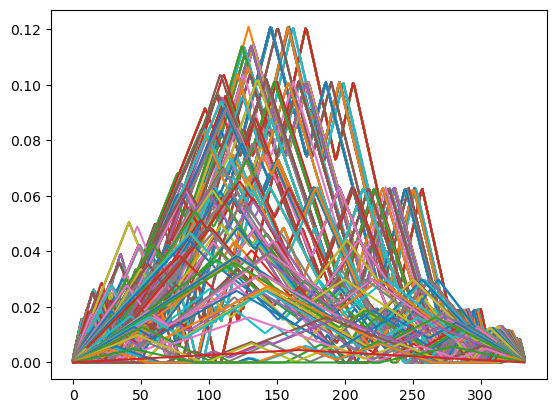

In [465]:
for grain in np.arange(grain0)[:4:-1]:
    GG['graphs'][grain] = coarsen(GG,grain)
    rip = ripser(GG['graphs'][grain], maxdim=1, thresh=np.inf, distance_matrix=True)
    GG['dgms'][grain] = rip['dgms'][1]
    dgMax = np.argmax(np.diff(GG['dgms'][grain],axis=1))
    GG['dgMax'][grain] = [dgMax, *GG['dgms'][grain][dgMax], np.diff(GG['dgms'][grain][dgMax])[0]]
    GG['landscape'][grain] = doLandscape(GG['dgms'][grain])
        
    print([grain, *GG['dgMax'][grain]])
    plt.plot(GG['landscape'][grain+1].T)
    

In [720]:
goodStates

['None', 'Fixation', 'Rest', 'Memory', 'Video', 'Math']

In [896]:
np.min(np.array(list(GG_more['landscape'].keys())))


6

In [898]:
GG_more['dgms'][grain1]

array([[0.68357897, 0.69166714]])

[9, 9]
[18, 18]


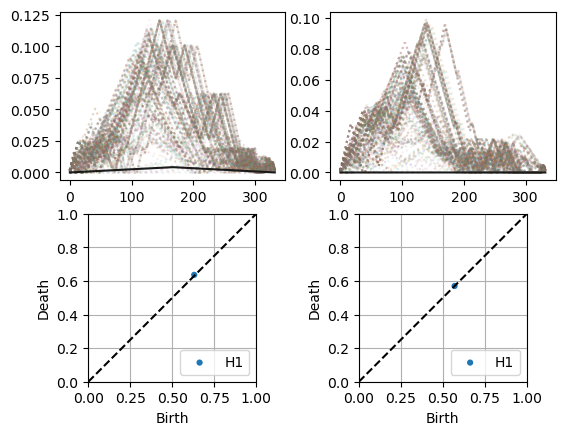

In [918]:
grain = grain1 = np.min(np.array(list(GG_more['landscape'].keys())))
temp = GG_more['dgms'][grain1].shape[1]
while temp == 1:
    temp = GG_more['dgms'][grain1].shape[1]
    if temp == 1:
        grain1 += 1
print([grain, grain1])

plt.subplot(2,2,1)
for grain in np.arange(grain0)[328:10:-1]:    
    plt.plot(GG_more['landscape'][grain].T,':',alpha=0.1)
plt.plot(GG_more['landscape'][grain1].T,'k')

grain = grain2 = np.min(np.array(list(GG_less['landscape'].keys())))
temp = GG_less['dgms'][grain2].shape[1]
while temp == 1:
    temp = GG_less['dgms'][grain2].shape[1]
    if btemp == 1:
        grain2 += 1
print([grain, grain2])

plt.subplot(2,2,2)
for grain in np.arange(grain0)[328:18:-1]:    
    plt.plot(GG_less['landscape'][grain].T,':',alpha=0.1)
plt.plot(GG_less['landscape'][grain2].T,'k')

plt.subplot(223)
plot_diagrams(GG_more['dgms'][grain1],labels='H1', xy_range=[0,1,0,1])
plt.grid()

plt.subplot(224)
plot_diagrams(GG_less['dgms'][grain2],labels='H1', xy_range=[0,1,0,1])
plt.grid()

#plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/FigureS_ReducedLandscapes_{}_grain{}.png'.format(goodStates[e],grain1))

In [920]:
GG_less['dgms'][grain2]

array([[0.56978744, 0.56986284]])

In [917]:
temp

2

In [350]:
print([list(GG_more['landscape'].keys())[-1],list(GG_less['landscape'].keys())[-1]])

[6, 11]


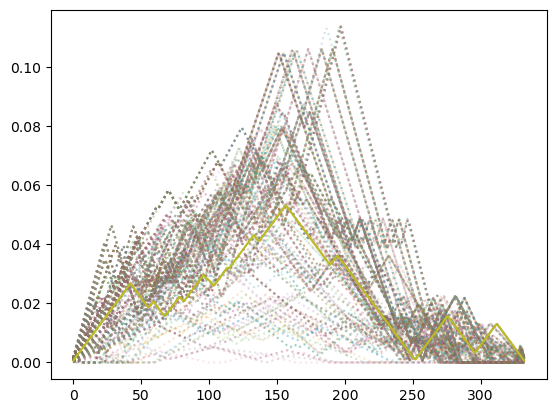

In [337]:
for grain in np.arange(grain0)[328:10:-1]:    
    plt.plot(GG_more['landscape'][grain].T,':',alpha=0.2)
plt.plot(GG_more['landscape'][100].T)

In [466]:
GG_more = GG.copy()

In [463]:
GG_less = GG.copy()

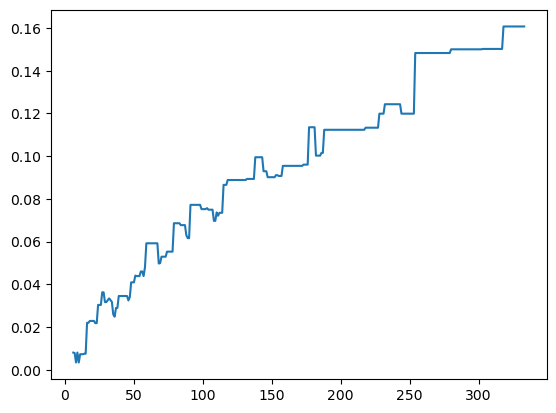

In [306]:
plt.plot(list(GG_more['dgMax']),np.array([GG_more['dgMax'][nn][-1] for nn in GG_more['dgMax']]))
plt.show()

In [143]:
np.histogram(GG_less['graphs'][333])

(array([  338,    98,   736,  2478,  6412, 13556, 21832, 30560, 27798,
         3776]),
 array([0.        , 0.72230445, 1.4446089 , 2.16691334, 2.88921779,
        3.61152224, 4.33382669, 5.05613113, 5.77843558, 6.50074003,
        7.22304448]))

[332, 150, 0.2416486293077469, 0.3591230809688568, 0.11747445166110992]
[331, 150, 0.2416486293077469, 0.3591230809688568, 0.11747445166110992]
[330, 150, 0.2416486293077469, 0.3591230809688568, 0.11747445166110992]
[329, 150, 0.2416486293077469, 0.3591230809688568, 0.11747445166110992]
[328, 150, 0.2416486293077469, 0.3591230809688568, 0.11747445166110992]
[327, 150, 0.2416486293077469, 0.3591230809688568, 0.11747445166110992]
[326, 150, 0.2416486293077469, 0.3591230809688568, 0.11747445166110992]
[325, 150, 0.2416486293077469, 0.3591230809688568, 0.11747445166110992]
[324, 150, 0.2416486293077469, 0.3591230809688568, 0.11747445166110992]
[323, 151, 0.2416486293077469, 0.3591230809688568, 0.11747445166110992]
[322, 151, 0.2416486293077469, 0.3591230809688568, 0.11747445166110992]
[321, 151, 0.2416486293077469, 0.3591230809688568, 0.11747445166110992]
[320, 140, 0.25498855113983154, 0.3591230809688568, 0.10413452982902527]
[319, 138, 0.2586592137813568, 0.3591230809688568, 0.1004638671

[218, 127, 0.28336718678474426, 0.3944362699985504, 0.11106908321380615]
[217, 129, 0.28336718678474426, 0.3944362699985504, 0.11106908321380615]
[216, 126, 0.28336718678474426, 0.3944362699985504, 0.11106908321380615]
[215, 127, 0.28336718678474426, 0.3944362699985504, 0.11106908321380615]
[214, 127, 0.28336718678474426, 0.3944362699985504, 0.11106908321380615]
[213, 126, 0.28336718678474426, 0.3944362699985504, 0.11106908321380615]
[212, 110, 0.30950334668159485, 0.41842150688171387, 0.10891816020011902]
[211, 111, 0.30950334668159485, 0.41842150688171387, 0.10891816020011902]
[210, 114, 0.30950334668159485, 0.41842150688171387, 0.10891816020011902]
[209, 113, 0.30950334668159485, 0.41842150688171387, 0.10891816020011902]
[208, 112, 0.30950334668159485, 0.41842150688171387, 0.10891816020011902]
[207, 111, 0.30950334668159485, 0.41842150688171387, 0.10891816020011902]
[206, 113, 0.30950334668159485, 0.41842150688171387, 0.10891816020011902]
[205, 118, 0.30950334668159485, 0.4184215068

[103, 63, 0.3769353926181793, 0.45752134919166565, 0.08058595657348633]
[102, 63, 0.37894707918167114, 0.4537665545940399, 0.07481947541236877]
[101, 60, 0.3812018036842346, 0.4537665545940399, 0.0725647509098053]
[100, 60, 0.3812018036842346, 0.4537665545940399, 0.0725647509098053]
[99, 58, 0.3812018036842346, 0.4537665545940399, 0.0725647509098053]
[98, 56, 0.38260528445243835, 0.4537665545940399, 0.07116127014160156]
[97, 55, 0.3858429491519928, 0.4550694525241852, 0.06922650337219238]
[96, 56, 0.3858429491519928, 0.4550694525241852, 0.06922650337219238]
[95, 56, 0.3868519067764282, 0.4537665545940399, 0.0669146478176117]
[94, 54, 0.3868519067764282, 0.4537665545940399, 0.0669146478176117]
[93, 53, 0.3868519067764282, 0.4537665545940399, 0.0669146478176117]
[92, 45, 0.39754149317741394, 0.4752705991268158, 0.07772910594940186]
[91, 45, 0.39754149317741394, 0.4752705991268158, 0.07772910594940186]
[90, 43, 0.39754149317741394, 0.4758482873439789, 0.07830679416656494]
[89, 45, 0.39754

ValueError: attempt to get argmax of an empty sequence

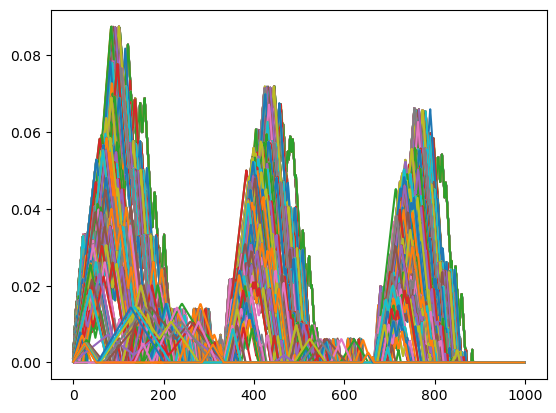

In [176]:
for grain in np.arange(grain0)[:4:-1]:
    GG['graphs'][grain] = coarsen(GG,grain)
    rip = ripser(GG['graphs'][grain], maxdim=1, thresh=np.inf, distance_matrix=True)
    GG['dgms'][grain] = rip['dgms'][1]
    dgMax = np.argmax(np.diff(GG['dgms'][grain],axis=1))
    GG['dgMax'][grain] = [dgMax, *GG['dgms'][grain][dgMax], np.diff(GG['dgms'][grain][dgMax])[0]]
    GG['landscape'][grain] = doLandscape(GG['dgms'][grain])
        
    print([grain, *GG['dgMax'][grain]])
    plt.plot(GG['landscape'][grain+1].T)
    

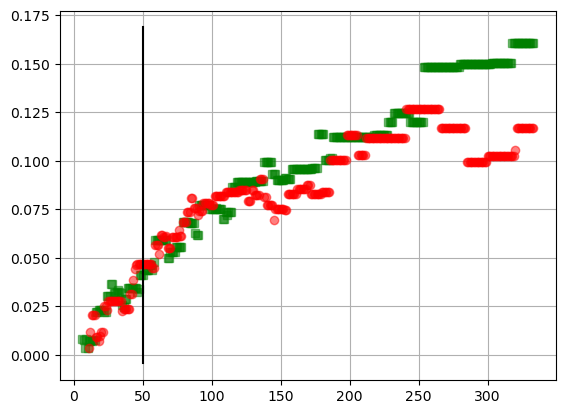

In [528]:
grain = GG_more['cycle']['grain']
e=3

ax  = plt.subplot(111)
                  
plt.plot(np.array(list(GG_more['dgMax'].keys())),np.array([GG_more['dgMax'][nn][-1] for nn in GG_more['dgMax']]),'sg',alpha=0.5)
plt.plot(np.array(list(GG_less['dgMax'].keys())),np.array([GG_less['dgMax'][nn][-1] for nn in GG_less['dgMax']]),'or',alpha=0.5)

plt.plot([grain,grain],ax.get_ylim(),'-k')

plt.grid()

plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/FigureS_StepwiseReduction_{}.png'.format(goodStates[e]))

plt.show()


In [472]:
ax.get_ylim()

(-0.008483326435089112, 0.17980865240097046)

In [128]:
from persim import plot_diagrams

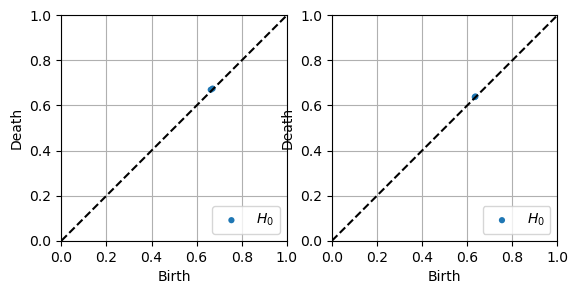

In [351]:
grain=11
plt.subplot(121)
plot_diagrams(GG_more['dgms'][grain],xy_range=[0,1,0,1])
plt.grid()

plt.subplot(122)
plot_diagrams(GG_less['dgms'][grain],xy_range=[0,1,0,1])
plt.grid()


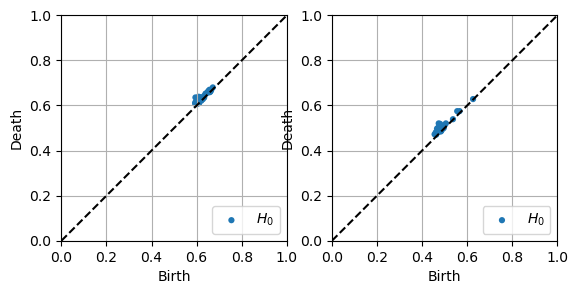

In [367]:
grain=50
plt.subplot(121)
plot_diagrams(GG_more['dgms'][grain],xy_range=[0,1,0,1])
plt.grid()
plt.subplot(122)
plot_diagrams(GG_less['dgms'][grain],xy_range=[0,1,0,1])
plt.grid()


In [439]:
GG_more

KeyboardInterrupt: 

In [438]:
GG_less = GG.copy()

In [203]:
min(polyset.keys())

1

In [1010]:
GG_more = GG_all['memory_more']
grain = np.min(np.array(list(GG_more['landscape'].keys())))+9
np.savetxt(X=GG_more['graphs'][grain],fname='agraph.txt',delimiter=',')

In [1011]:
cycle_more = [[ [0,7] , [7,10] , [5,10] , [0,5] ], [ [0,7] , [1,11] , [7,11] , [0,1]] ]

In [1012]:
GG_more['cycle'] = {}
GG_more['cycle']['cycle'] = cycle_more
GG_more['cycle']['grain'] = grain

In [1005]:
GG_less = GG_all['memory_less']
grain = np.min(np.array(list(GG_less['landscape'].keys())))+2
np.savetxt(X=GG_less['graphs'][grain],fname='agraph.txt',delimiter=',')

In [1006]:
cycle_less = [ [8,10] , [2,6] , [6,10] , [0,2] , [0,1] , [1,8] ]

In [1007]:
GG_less['cycle'] = {}
GG_less['cycle']['cycle'] = cycle_less
GG_less['cycle']['grain'] = grain

In [1013]:
GG_all['memory_more'] = GG_more
GG_all['memory_less'] = GG_less

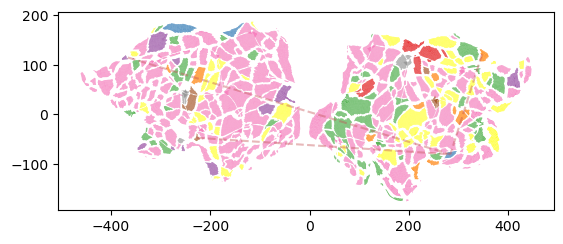

In [931]:
ax = plt.subplot(111)
ax.set_ylim(ylim)
ax.set_xlim(xlim)

#grain = grain1
#this = GG_more
clusts = fcluster(this['linkage'], t=grain, criterion='maxclust')

cmap = plt.get_cmap('Set1',grain+1)

polyobs = {}

missingVoxels = [133, 296, 299, 302, 304]

for segi, seg in enumerate(list(set(polyset.keys()) - set(np.array(missingVoxels)+1))):
    patches = [Polygon(tri, edgecolor = None, 
                       facecolor=cmap(clusts[segi]), 
                       alpha=1) for tri in polyset[seg]]
    polyobs[seg] = PatchCollection(patches,match_original=True)
    ax.add_collection(polyobs[seg])

targs = []
for clu in np.unique(clusts):
    those = clusts==clu
    temp = this['graphs'][333][those,:][:,those]
    temp = np.mean(temp,axis=0)
    temp = np.argmax(temp)
    targs.append(np.arange(len(clusts))[those][temp])
    
g = this['graphs'][grain].copy()
g[np.diag_indices(len(g))] = 2
rows,cols = np.nonzero(g<=this['dgMax'][grain][1])

rip = ripser(this['graphs'][grain],distance_matrix=True,maxdim=1,do_cocycles=True)
assert(this['dgMax'][grain][0]==np.argmax(np.diff(rip['dgms'][1],axis=1)))
cocycle = rip['cocycles'][1][this['dgMax'][grain][0]][:,:2]
for row,col in cocycle:
    #row-=1
    #col-=1
    xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
    ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
    plt.plot(xs,ys,'--r',alpha=0.4)

plt.axis('scaled')    
plt.show()



In [354]:
cocycle

array([[6, 4]])

In [515]:
cycle = [ [16,25] , [12,20] , [12,18] , [40,77] , [24,25] , [24,51] , [12,13] , [15,22] , [50,52] , [77,79] , [71,73] , [15,16] , [14,15] , [13,71] , [79,80] , [19,20] , [14,19] , [41,50] , [12,15] , [18,22] , [40,41] , [73,80] , [51,52] ]

In [516]:
GG_more['cycle'] = {}
GG_more['cycle']['cycle'] = cycle
GG_more['cycle']['grain'] = grain

In [517]:
print([e,grain])

[5, 88]


In [651]:
masks['centroids'].shape

(328, 2)

In [661]:
targs_full[segi]

160.0

In [ ]:
cycle = [ [10,13] , [11,12] , [12,13] , [10,11] ]

In [941]:
cycle1 = [ [10,13] , [11,12] , [12,13] , [10,11] ]
cycle2 = [ [16,18] , [5,17] , [6,7] , [10,18] , [9,11] , [6,9] , [5,7] , [16,17] , [10,11] ]

In [968]:
cycle = [ [1,11] , [11,15] , [1,2] , [2,15] ]

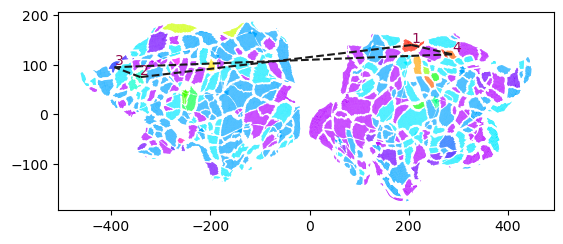

In [1082]:
ax = plt.subplot(111)
ax.set_ylim(ylim)
ax.set_xlim(xlim)

#grain = grain2
#this = GG_less
clusts = fcluster(this['linkage'], t=grain, criterion='maxclust')

cmap = plt.get_cmap('gist_rainbow',grain+1)

polyobs = {}

missingVoxels = [133, 296, 299, 302, 304]

targs = []
targs_full = np.empty(clusts.shape, dtype='int')
for clu in np.unique(clusts):
    those = clusts==clu
    temp = this['graphs'][333][those,:][:,those]
    temp = np.mean(temp,axis=0)
    temp = np.argmax(temp)
    val = np.arange(len(clusts))[those][temp]
    targs.append(val)
    targs_full[those] = val

for segi, seg in enumerate(list(set(polyset.keys()) - set(np.array(missingVoxels)+1))):
    if segi in set(targs):
        alpha = 1
    else:        
        alpha = 1
    patches = [Polygon(tri, edgecolor = None, 
                       facecolor=cmap(clusts[segi]), 
                       alpha=alpha) for tri in polyset[seg]]
    polyobs[seg] = PatchCollection(patches,match_original=True)
    ax.add_collection(polyobs[seg])
    
g = this['graphs'][grain].copy()
g[np.diag_indices(len(g))] = 2
rows,cols = np.nonzero(g<=this['dgMax'][grain][1])

for row,col in zip(rows,cols):
    xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
    ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
    #plt.plot(xs,ys,'b',alpha=0.5)

#rip = ripser(this['graphs'][grain],distance_matrix=True,maxdim=1,do_cocycles=True)
#assert(this['dgMax'][grain][0]==np.argmax(np.diff(rip['dgms'][1],axis=1)))
#cocycle = rip['cocycles'][1][this['dgMax'][grain][0]][:,:2]
labelSet = set()
for row,col in cycle:
    row-=1
    if row not in labelSet:
        labelSet.add(row)
        plt.text(masks['centroids'][:,0][targs[row]],
                 masks['centroids'][:,1][targs[row]]+5, len(labelSet), color='xkcd:mulberry') 
    col-=1
    if col not in labelSet:
        labelSet.add(col)
        plt.text(masks['centroids'][:,0][targs[col]], 
                 masks['centroids'][:,1][targs[col]]+5, len(labelSet), color='xkcd:mulberry') 
    xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
    ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
    plt.plot(xs,ys,'--k',alpha=1)

plt.axis('scaled')    

#plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure7_VisualizeCycle_{}_more_grain{}.png'.format(goodStates[e],grain))

plt.show()

In [1077]:
help(plt.text)

Help on function text in module matplotlib.pyplot:

text(x, y, s, fontdict=None, withdash=<deprecated parameter>, **kwargs)
    Add text to the axes.
    
    Add the text *s* to the axes at location *x*, *y* in data coordinates.
    
    Parameters
    ----------
    x, y : scalars
        The position to place the text. By default, this is in data
        coordinates. The coordinate system can be changed using the
        *transform* parameter.
    
    s : str
        The text.
    
    fontdict : dictionary, optional, default: None
        A dictionary to override the default text properties. If fontdict
        is None, the defaults are determined by your rc parameters.
    
    withdash : boolean, optional, default: False
        Creates a `~matplotlib.text.TextWithDash` instance instead of a
        `~matplotlib.text.Text` instance.
    
    Returns
    -------
    text : `.Text`
        The created `.Text` instance.
    
    Other Parameters
    ----------------
    **kwargs : 

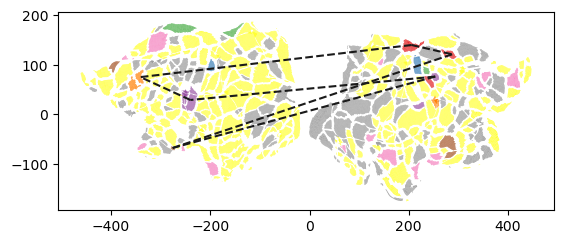

In [ ]:
ax = plt.subplot(111)
ax.set_ylim(ylim)
ax.set_xlim(xlim)

#grain = grain2
#this = GG_less
clusts = fcluster(this['linkage'], t=grain, criterion='maxclust')

cmap = plt.get_cmap('Set1',grain+1)

polyobs = {}

missingVoxels = [133, 296, 299, 302, 304]

targs = []
targs_full = np.empty(clusts.shape, dtype='int')
for clu in np.unique(clusts):
    those = clusts==clu
    temp = this['graphs'][333][those,:][:,those]
    temp = np.mean(temp,axis=0)
    temp = np.argmax(temp)
    val = np.arange(len(clusts))[those][temp]
    targs.append(val)
    targs_full[those] = val

for segi, seg in enumerate(list(set(polyset.keys()) - set(np.array(missingVoxels)+1))):
    if segi in set(targs):
        alpha = 1
    else:        
        alpha = 1
    patches = [Polygon(tri, edgecolor = None, 
                       facecolor=cmap(clusts[segi]), 
                       alpha=alpha) for tri in polyset[seg]]
    polyobs[seg] = PatchCollection(patches,match_original=True)
    ax.add_collection(polyobs[seg])
    
g = this['graphs'][grain].copy()
g[np.diag_indices(len(g))] = 2
rows,cols = np.nonzero(g<=this['dgMax'][grain][1])

for row,col in zip(rows,cols):
    xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
    ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
    #plt.plot(xs,ys,'b',alpha=0.5)

#rip = ripser(this['graphs'][grain],distance_matrix=True,maxdim=1,do_cocycles=True)
#assert(this['dgMax'][grain][0]==np.argmax(np.diff(rip['dgms'][1],axis=1)))
#cocycle = rip['cocycles'][1][this['dgMax'][grain][0]][:,:2]
for row,col in cycle1:
    row-=1
    col-=1
    xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
    ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
    plt.plot(xs,ys,'--k',alpha=1)

for row,col in cycle2:
    row-=1
    col-=1
    xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
    ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
    plt.plot(xs,ys,'--r',alpha=1)
    
plt.axis('scaled')    

#plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure7_VisualizeCycle_{}_more_grain{}.png'.format(goodStates[e],grain))


plt.show()

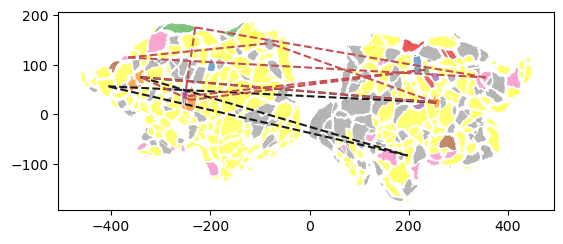

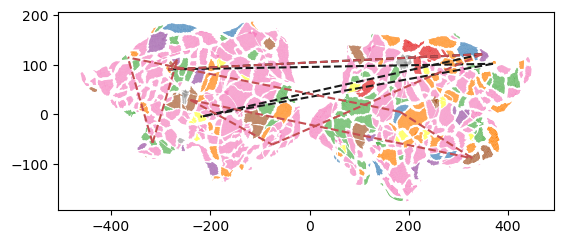

In [518]:
cycle = [ [60,80] , [64,83] , [69,70] , [47,70] , [59,74] , [64,65] , [47,82] , [32,65] , [33,34] , [59,61] , [69,71] , [60,61] , [71,78] , [32,34] , [33,74] , [78,84] , [80,84] , [82,83] ]

In [519]:
GG_less['cycle'] = {}
GG_less['cycle']['cycle'] = cycle
GG_less['cycle']['grain'] = grain

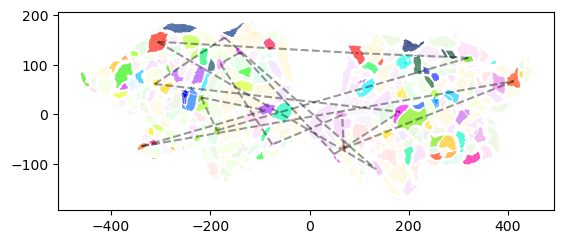

In [520]:
cycle = [ [60,80] , [64,83] , [69,70] , [47,70] , [59,74] , [64,65] , [47,82] , [32,65] , [33,34] , [59,61] , [69,71] , [60,61] , [71,78] , [32,34] , [33,74] , [78,84] , [80,84] , [82,83] ]

ax = plt.subplot(111)
ax.set_ylim(ylim)
ax.set_xlim(xlim)

grain = 88
this = GG_less
clusts = fcluster(this['linkage'], t=grain, criterion='maxclust')

cmap = plt.get_cmap('gist_ncar',grain+1)

polyobs = {}

missingVoxels = [133, 296, 299, 302, 304]

targs = []
for clu in np.unique(clusts):
    those = clusts==clu
    temp = this['graphs'][333][those,:][:,those]
    temp = np.mean(temp,axis=0)
    temp = np.argmax(temp)
    targs.append(np.arange(len(clusts))[those][temp])

for segi, seg in enumerate(list(set(polyset.keys()) - set(np.array(missingVoxels)+1))):
    if segi in set(targs):
        alpha = 0.9
    else:
        alpha = 0.1
    patches = [Polygon(tri, edgecolor = None, 
                       facecolor=cmap(clusts[segi]), 
                       alpha=alpha) for tri in polyset[seg]]
    polyobs[seg] = PatchCollection(patches,match_original=True)
    ax.add_collection(polyobs[seg])

targs = []
for clu in np.unique(clusts):
    those = clusts==clu
    temp = this['graphs'][333][those,:][:,those]
    temp = np.mean(temp,axis=0)
    temp = np.argmax(temp)
    targs.append(np.arange(len(clusts))[those][temp])
    
g = this['graphs'][grain].copy()
g[np.diag_indices(len(g))] = 2
rows,cols = np.nonzero(g<=this['dgMax'][grain][1])

for row,col in zip(rows,cols):
    xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
    ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
    #plt.plot(xs,ys,'b',alpha=0.5)

#rip = ripser(this['graphs'][grain],distance_matrix=True,maxdim=1,do_cocycles=True)
#assert(this['dgMax'][grain][0]==np.argmax(np.diff(rip['dgms'][1],axis=1)))
#cocycle = rip['cocycles'][1][this['dgMax'][grain][0]][:,:2]
for row,col in cycle:
    row-=1
    col-=1
    xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
    ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
    plt.plot(xs,ys,'--k',alpha=0.4)

plt.axis('scaled')    

plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure7_VisualizeCycle_{}_less_grain{}.png'.format(goodStates[e],grain))

plt.show()

In [665]:

GG_all.keys()

dict_keys(['memory_more', 'memory_less', 'video_more', 'video_less', 'math_more', 'math_less'])

In [669]:
GG_all['math_less'].keys()

dict_keys(['graphs', 'dgms', 'dgMax', 'landscape', 'linkage', 'cycle'])

In [670]:
GG_all['math_less']['cycle'].keys()

dict_keys(['cycle', 'grain'])

In [1074]:
help(plt.text)

Help on function text in module matplotlib.pyplot:

text(x, y, s, fontdict=None, withdash=<deprecated parameter>, **kwargs)
    Add text to the axes.
    
    Add the text *s* to the axes at location *x*, *y* in data coordinates.
    
    Parameters
    ----------
    x, y : scalars
        The position to place the text. By default, this is in data
        coordinates. The coordinate system can be changed using the
        *transform* parameter.
    
    s : str
        The text.
    
    fontdict : dictionary, optional, default: None
        A dictionary to override the default text properties. If fontdict
        is None, the defaults are determined by your rc parameters.
    
    withdash : boolean, optional, default: False
        Creates a `~matplotlib.text.TextWithDash` instance instead of a
        `~matplotlib.text.Text` instance.
    
    Returns
    -------
    text : `.Text`
        The created `.Text` instance.
    
    Other Parameters
    ----------------
    **kwargs : 

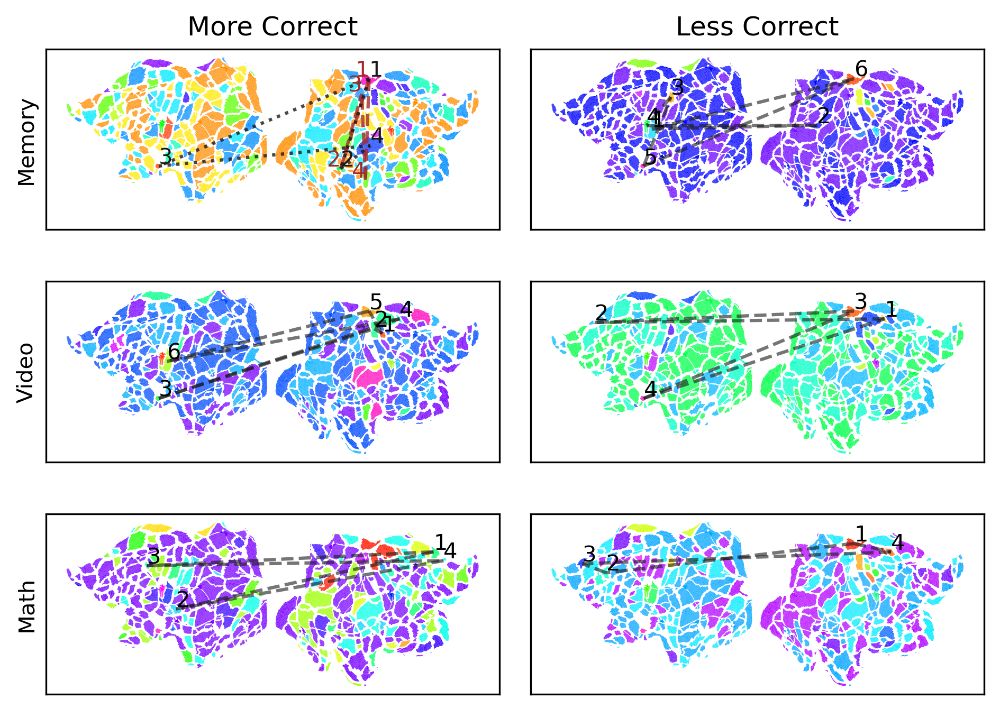

In [1086]:
fig = plt.figure(dpi=300)

ax.set_ylim(ylim)
ax.set_xlim(xlim)
missingVoxels = [133, 296, 299, 302, 304]

for gi, gg in enumerate(GG_all, start=1):
    this = GG_all[gg]    
    ax = plt.subplot(3, 2, gi)

    grain = this['cycle']['grain']
    clusts = fcluster(this['linkage'], t=grain, criterion='maxclust')
    
    cycle = this['cycle']['cycle']

    cmap = plt.get_cmap('gist_rainbow',grain+1)

    polyobs = {}

    targs = []
    targs_full = np.empty(clusts.shape, dtype='int')
    for clu in np.unique(clusts):
        those = clusts==clu
        temp = this['graphs'][333][those,:][:,those]
        temp = np.mean(temp,axis=0)
        temp = np.argmax(temp)
        val = np.arange(len(clusts))[those][temp]
        targs.append(val)
        targs_full[those] = val

    for segi, seg in enumerate(list(set(polyset.keys()) - set(np.array(missingVoxels)+1))):
        if segi in set(targs):
            alpha = 1
        else:        
            alpha = 1
        patches = [Polygon(tri, edgecolor = None, 
                           facecolor=cmap(clusts[segi]), 
                           alpha=alpha) for tri in polyset[seg]]
        polyobs[seg] = PatchCollection(patches,match_original=True)
        ax.add_collection(polyobs[seg])
        
    g = this['graphs'][grain].copy()
    g[np.diag_indices(len(g))] = 2
    rows,cols = np.nonzero(g<=this['dgMax'][grain][1])

    #for row,col in zip(rows,cols):
    #    xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
    #    ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
    #    #plt.plot(xs,ys,'b',alpha=0.5)

    #rip = ripser(this['graphs'][grain],distance_matrix=True,maxdim=1,do_cocycles=True)
    #assert(this['dgMax'][grain][0]==np.argmax(np.diff(rip['dgms'][1],axis=1)))
    #cocycle = rip['cocycles'][1][this['dgMax'][grain][0]][:,:2]
    if type(cycle[0][0]) == int:
        labelSet = set()
        for row,col in cycle:
            row-=1
            if row not in labelSet:
                labelSet.add(row)
                plt.text(masks['centroids'][:,0][targs[row]],
                         masks['centroids'][:,1][targs[row]]+5, len(labelSet)) 
            col-=1
            if col not in labelSet:
                labelSet.add(col)
                plt.text(masks['centroids'][:,0][targs[col]], 
                         masks['centroids'][:,1][targs[col]]+5, len(labelSet)) 
            xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
            ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
            plt.plot(xs,ys,'--k',alpha=0.6)
        for texti in labelDict:
            plt.text
    elif type(cycle[0][0]) ==list:
        colors = ['brown','k']        
        markers = ['dashed','dotted']
        xoffset = [-30,0]
        for ci, cc in enumerate(cycle):
            labelSet = set()
            for row,col in cc:
                row-=1
                if row not in labelSet:
                    labelSet.add(row)
                    plt.text(masks['centroids'][:,0][targs[row]]+xoffset[ci],
                             masks['centroids'][:,1][targs[row]]+5, len(labelSet), color=colors[ci]) 
                col-=1
                if col not in labelSet:
                    labelSet.add(col)
                    plt.text(masks['centroids'][:,0][targs[col]]+xoffset[ci], 
                             masks['centroids'][:,1][targs[col]]+5, len(labelSet), color=colors[ci]) 
                xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
                ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
                plt.plot(xs,ys,linestyle=markers[ci],color=colors[ci],alpha=0.8)
    else:
        break
            
    ax.set_xticks([])
    ax.set_xticklabels('')
    ax.set_yticks([])
    ax.set_yticklabels('')
    
    if gi == 1:
        ax.set_title('More Correct')
        ax.set_ylabel('Memory')
    elif gi == 2:
        ax.set_title('Less Correct')
    elif gi == 3:
        ax.set_ylabel('Video')
    elif gi == 5:
        ax.set_ylabel('Math')
        
    plt.axis('scaled')    

plt.tight_layout()
plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure6_VisualizeCycles_v02r.png')
plt.show()

In [1049]:
2

2

In [1057]:
sum(clusts==12)

80

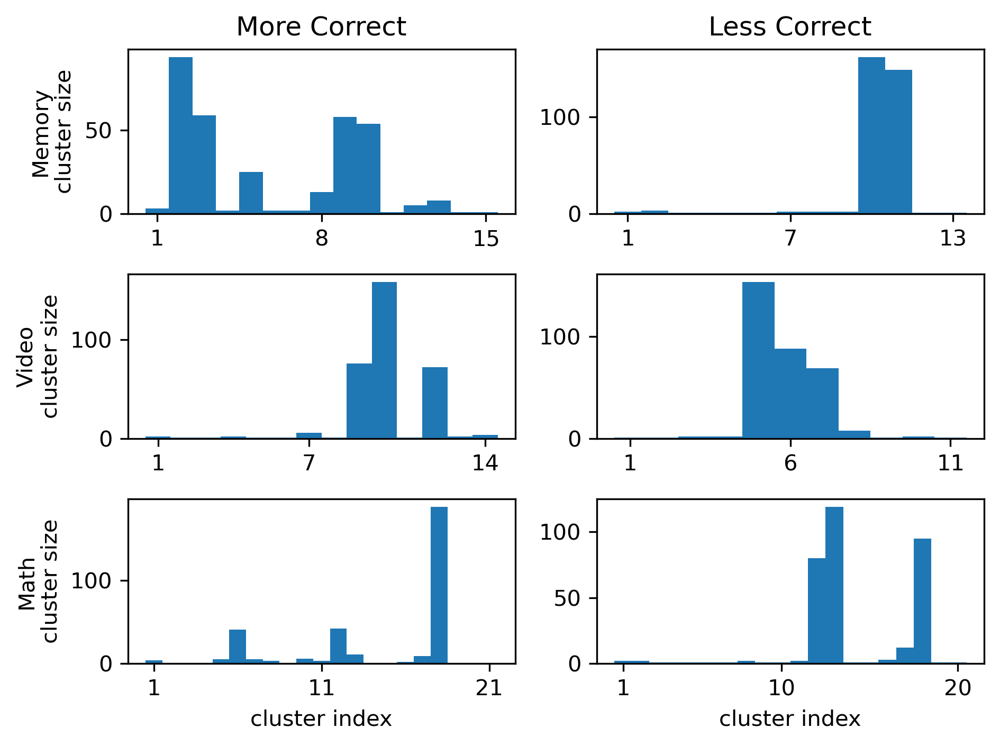

In [1067]:
fig = plt.figure(dpi=300)

#ax.set_ylim(ylim)
#ax.set_xlim(xlim)
missingVoxels = [133, 296, 299, 302, 304]

for gi, gg in enumerate(GG_all, start=1):
    this = GG_all[gg]    
    ax = plt.subplot(3, 2, gi)

    grain = this['cycle']['grain']
    clusts = fcluster(this['linkage'], t=grain, criterion='maxclust')
    
    uclusts = np.unique(clusts)
    xticks = [min(uclusts), int(np.median(uclusts)), max(uclusts)]
    
    plt.hist(clusts,bins=np.arange(xticks[0]-0.5, xticks[2]+1.5))                
    ax.set_xticks(xticks)
    
    if gi == 1:
        ax.set_title('More Correct')
        ax.set_ylabel('Memory\ncluster size')
    elif gi == 2:
        ax.set_title('Less Correct')
    elif gi == 3:
        ax.set_ylabel('Video\ncluster size')
    elif gi == 5:
        ax.set_ylabel('Math\ncluster size')
        ax.set_xlabel('cluster index')
    elif gi == 6:
        ax.set_xlabel('cluster index')
        #cmap = plt.get_cmap('gist_rainbow')
        #plt.colormap()
    
    
    #plt.axis('box')    


plt.tight_layout()
plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/FigureA2_VisualizeCycles_ClusterHistograms.png')
plt.show()

(array([  4.,   2.,   2.,   3.,   2.,  82., 120.,   4., 107.,   2.]),
 array([ 1. ,  2.9,  4.8,  6.7,  8.6, 10.5, 12.4, 14.3, 16.2, 18.1, 20. ]),
 <a list of 10 Patch objects>)

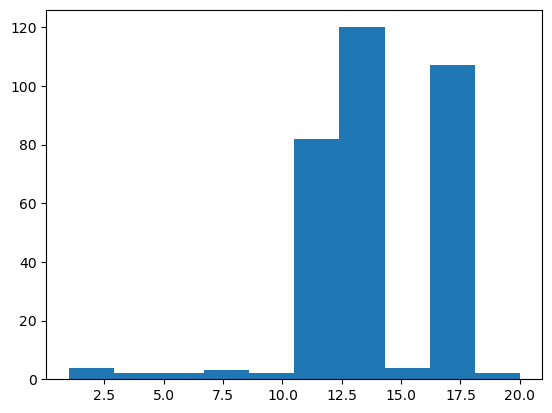

In [1063]:
plt.hist(clusts)

In [1053]:
yticks

[1, 10.5, 20]

In [1038]:
help(plt.hist)

Help on function hist in module matplotlib.pyplot:

hist(x, bins=None, range=None, density=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, *, data=None, **kwargs)
    Plot a histogram.
    
    Compute and draw the histogram of *x*.  The return value is a tuple
    (*n*, *bins*, *patches*) or ([*n0*, *n1*, ...], *bins*, [*patches0*,
    *patches1*,...]) if the input contains multiple data.  See the
    documentation of the *weights* parameter to draw a histogram of
    already-binned data.
    
    Multiple data can be provided via *x* as a list of datasets
    of potentially different length ([*x0*, *x1*, ...]), or as
    a 2-D ndarray in which each column is a dataset.  Note that
    the ndarray form is transposed relative to the list form.
    
    Masked arrays are not supported.
    
    The *bins*, *range*, *weights*, and *density* parameters behave as in
    `n

In [1030]:
for cc in cycle:
    for aa, bb in cc:
        print([aa,bb])

[0, 7]
[7, 10]
[5, 10]
[0, 5]
[0, 7]
[1, 11]
[7, 11]
[0, 1]


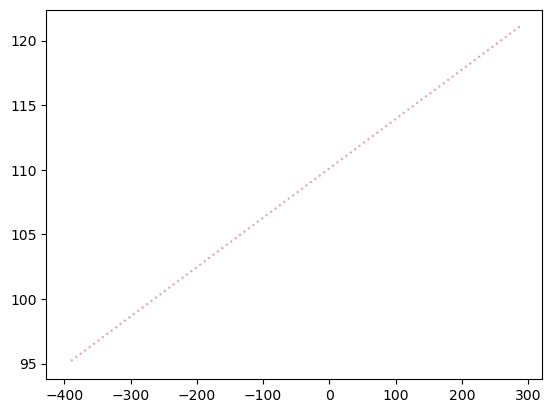

In [1017]:
colors=['r']
markers = [':']
cc=0

plt.plot(xs,ys,linestyle=markers[cc],color=colors[cc],alpha=0.5)

In [210]:
GG_more['dgMax'][grain][1]

0.5201218724250793

### Make Brain images in Python

In [262]:
import nibabel as bib

In [264]:
fname = '/keilholz-lab/Jacob/TDABrains_00/data/null_WG33/S900.R.flat.32k_fs_LR.surf.gii'
gg=bib.load(fname)

In [287]:
with open('flatBrainMasks.pkl','rb')as file:
    masks = pickle.load(file)

In [288]:
masks['centroids']

array([[  86.7643, -130.9706],
       [ 177.8958,  -79.2719],
       [ 184.9884,  -70.0006],
       [  94.3   , -114.5806],
       [-140.2632,   20.9084],
       [  55.2686, -125.6611],
       [ -66.2998,  -57.3942],
       [ -61.4906,  -72.6928],
       [ -88.8287,  -64.3856],
       [ -82.5777,  -76.3731],
       [-193.0816,   56.0515],
       [-175.0976,   46.0509],
       [-183.3779,   65.8407],
       [ 110.6158,  -73.6834],
       [  97.4176,  -98.377 ],
       [ 123.5969,  -40.1015],
       [ 122.5831,  -93.6678],
       [ 135.731 ,  -70.8502],
       [ 149.879 ,  -85.8316],
       [ 161.7904,  -77.855 ],
       [  78.7472,  -92.411 ],
       [ 453.0947, -146.0773],
       [ 299.7383,  -79.9698],
       [ 309.7915,  -82.0641],
       [ 676.6238,  100.9858],
       [ 576.8695,  -66.8272],
       [ 524.1052, -101.826 ],
       [ 578.5137,  -88.4998],
       [ 609.424 ,  -73.7549],
       [ 577.1733, -105.1031],
       [ 691.5043,  101.9744],
       [ 681.1138,   59.3315],
       [

In [272]:
hh=gg.darrays

In [276]:
hh[0].data.shape

(32492, 3)

In [277]:
hh[1].data.shape

(58914, 3)

array([-51.2622, 108.8392,   0.    ], dtype=float32)

### Make Brain images of comparisons

In [96]:
goodStates[5]

'Math'

In [562]:
# Many operations require 333 Gordan atlas Indices, so we build 1d and 2d base vectors 
totRegions = 333
g1 = np.full(totRegions,True)
g1[p_utils.missingVoxels] = False

# There are seperate analyses for several kinds of metric spaces. 
# We treat them individually

# Plot A) Main graph edges

condition_label = 'Diagram_1'
e = 3
perf = 'correct'

vals = sorted(outGraph_more[e][perf][condition_label])
thresh = vals[10]
graph = outGraph_more[e][perf][condition_label].copy()
graph[graph>thresh] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(thresh-graph[cycr,cycc])/(thresh-vals[0])]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
MoreEdgesName = 'EdgesMore.txt' 
np.savetxt(MoreEdgesName, cycles_out, delimiter=',', fmt='%1.5f')

vals = sorted(outGraph_less[e][perf][condition_label])
thresh = vals[10]
graph = outGraph_less[e][perf][condition_label].copy()
graph[graph>thresh] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(thresh-graph[cycr,cycc])/(thresh-vals[0])]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
LessEdgesName = 'EdgesLess.txt' 
np.savetxt(LessEdgesName, cycles_out, delimiter=',', fmt='%1.5f')

# Plot B) Differences between graphs

condition_label = 'Diagram_1'
graphA = outGraph_more[e][perf][condition_label].copy()

condition_label = 'Diagram_1'
graphB = outGraph_less[e][perf][condition_label].copy()

gDiff = np.abs(graphA-graphB)

gDiffName = 'DiffNodes.txt'
gDiffMat = squareform(gDiff)
NodesAll = np.zeros(totRegions) 
NodesAll[g1] = np.mean(gDiffMat,axis=0)
np.savetxt(gDiffName, NodesAll, delimiter=',', fmt='%1.5f')

gDiffSorted = sorted(np.abs(gDiff))
threshSmall = gDiffSorted[10]
threshLarge = gDiffSorted[-10]

graph = gDiff.copy()
graph[graph>threshSmall] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(threshSmall-graph[cycr,cycc])/(threshSmall-gDiffSorted[0])]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
SmallDiffName = 'DiffSmall.txt' 
np.savetxt(SmallDiffName, cycles_out, delimiter=',', fmt='%1.5f')

graph = gDiff.copy()
graph[graph<threshLarge] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(graph[cycr,cycc]-threshLarge)/(gDiffSorted[-1]-threshLarge)]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
LargeDiffName = 'DiffLarge.txt' 
np.savetxt(LargeDiffName, cycles_out, delimiter=',', fmt='%1.5f')


In [466]:
NodesAll = np.zeros(totRegions,dtype=int) 
temp = np.mean(gDiffMat,axis=0).ravel()
NodesAll[g1] = temp
np.histogram(NodesAll)

(array([  0,   0,   0,   0,   0, 333,   0,   0,   0,   0]),
 array([-0.5, -0.4, -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5]))

In [469]:
sum(g1)

328

In [470]:
len(NodesAll[g1])

328

In [565]:
# Many operations require 333 Gordan atlas Indices, so we build 1d and 2d base vectors 
totRegions = 333
g1 = np.full(totRegions,True)
g1[p_utils.missingVoxels] = False

# There are seperate analyses for several kinds of metric spaces. 
# We treat them individually

# Plot A) Main graph edges

condition_label = 'Diagram_1'
e = 3
perf = 'correct'

vals = sorted(outGraph_more[e][perf][condition_label])
thresh = vals[10]
graph = outGraph_more[e][perf][condition_label].copy()
graph[graph>thresh] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(thresh-graph[cycr,cycc])/(thresh-vals[0])]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
MoreEdgesName = 'EdgesMore.txt' 
np.savetxt(MoreEdgesName, cycles_out, delimiter=',', fmt='%1.5f')

condition_label = 'Simplex_1'
e = 3
perf = 'correct'

vals = sorted(outGraph_less[e][perf][condition_label])
thresh = vals[10]
graph = outGraph_less[e][perf][condition_label].copy()
graph[graph>thresh] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(thresh-graph[cycr,cycc])/(thresh-vals[0])]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
LessEdgesName = 'EdgesLess.txt' 
np.savetxt(LessEdgesName, cycles_out, delimiter=',', fmt='%1.5f')

# Plot B) Differences between graphs

condition_label = 'Diagram_1'
graphA = outGraph_more[e][perf][condition_label].copy()

condition_label = 'Simplex_1'
graphB = outGraph_less[e][perf][condition_label].copy()

gDiff = np.abs(graphA-graphB)

gDiffName = 'DiffNodes.txt'
gDiffMat = squareform(gDiff)
NodesAll = np.zeros(totRegions) 
NodesAll[g1] = np.mean(gDiffMat,axis=0)
np.savetxt(gDiffName, NodesAll, delimiter=',', fmt='%1.5f')

gDiffSorted = sorted(np.abs(gDiff))
threshSmall = gDiffSorted[10]
threshLarge = gDiffSorted[-10]

graph = gDiff.copy()
graph[graph>threshSmall] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(threshSmall-graph[cycr,cycc])/(threshSmall-gDiffSorted[0])]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
SmallDiffName = 'DiffSmall.txt' 
np.savetxt(SmallDiffName, cycles_out, delimiter=',', fmt='%1.5f')

graph = gDiff.copy()
graph[graph<threshLarge] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(graph[cycr,cycc]-threshLarge)/(gDiffSorted[-1]-threshLarge)]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
LargeDiffName = 'DiffLarge.txt' 
np.savetxt(LargeDiffName, cycles_out, delimiter=',', fmt='%1.5f')


In [566]:
# for 'PlotFigure5AB.m'

# Many operations require 333 Gordan atlas Indices, so we build 1d and 2d base vectors 
totRegions = 333
g1 = np.full(totRegions,True)
g1[p_utils.missingVoxels] = False

# There are seperate analyses for several kinds of metric spaces. 
# We treat them individually

# Plot A) Main graph edges

condition_label = 'Diagram_1'
e = 3
perf = 'correct'

vals = sorted(outGraph_more[e][perf][condition_label])
thresh = vals[10]
graph = outGraph_more[e][perf][condition_label].copy()
graph[graph>thresh] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(thresh-graph[cycr,cycc])/(thresh-vals[0])]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
MoreEdgesName = 'EdgesMore_Diagram.txt' 
np.savetxt(MoreEdgesName, cycles_out, delimiter=',', fmt='%1.5f')

vals = sorted(outGraph_less[e][perf][condition_label])
thresh = vals[10]
graph = outGraph_less[e][perf][condition_label].copy()
graph[graph>thresh] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(thresh-graph[cycr,cycc])/(thresh-vals[0])]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
LessEdgesName = 'EdgesLess_Diagram.txt' 
np.savetxt(LessEdgesName, cycles_out, delimiter=',', fmt='%1.5f')

# Plot B) Differences between graphs

condition_label = 'Diagram_1'
graphA = outGraph_more[e][perf][condition_label].copy()

condition_label = 'Diagram_1'
graphB = outGraph_less[e][perf][condition_label].copy()

gDiff = np.abs(graphA-graphB)

gDiffName = 'DiffNodes_Diagram.txt'
gDiffMat = squareform(gDiff)
NodesAll = np.zeros(totRegions) 
NodesAll[g1] = np.mean(gDiffMat,axis=0)
np.savetxt(gDiffName, NodesAll, delimiter=',', fmt='%1.5f')

gDiffSorted = sorted(np.abs(gDiff))
threshSmall = gDiffSorted[10]
threshLarge = gDiffSorted[-10]

graph = gDiff.copy()
graph[graph>threshSmall] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(threshSmall-graph[cycr,cycc])/(threshSmall-gDiffSorted[0])]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
SmallDiffName = 'DiffSmall_Diagram.txt' 
np.savetxt(SmallDiffName, cycles_out, delimiter=',', fmt='%1.5f')

graph = gDiff.copy()
graph[graph<threshLarge] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(graph[cycr,cycc]-threshLarge)/(gDiffSorted[-1]-threshLarge)]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
LargeDiffName = 'DiffLarge_Diagram.txt' 
np.savetxt(LargeDiffName, cycles_out, delimiter=',', fmt='%1.5f')




# Many operations require 333 Gordan atlas Indices, so we build 1d and 2d base vectors 
totRegions = 333
g1 = np.full(totRegions,True)
g1[p_utils.missingVoxels] = False

# There are seperate analyses for several kinds of metric spaces. 
# We treat them individually

# Plot A) Main graph edges

condition_label = 'Simplex_1'
e = 3
perf = 'correct'

vals = sorted(outGraph_more[e][perf][condition_label])
thresh = vals[10]
graph = outGraph_more[e][perf][condition_label].copy()
graph[graph>thresh] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(thresh-graph[cycr,cycc])/(thresh-vals[0])]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
MoreEdgesName = 'EdgesMore_Simplex.txt' 
np.savetxt(MoreEdgesName, cycles_out, delimiter=',', fmt='%1.5f')

vals = sorted(outGraph_less[e][perf][condition_label])
thresh = vals[10]
graph = outGraph_less[e][perf][condition_label].copy()
graph[graph>thresh] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(thresh-graph[cycr,cycc])/(thresh-vals[0])]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
LessEdgesName = 'EdgesLess_Simplex.txt' 
np.savetxt(LessEdgesName, cycles_out, delimiter=',', fmt='%1.5f')

# Plot B) Differences between graphs

condition_label = 'Simplex_1'
graphA = outGraph_more[e][perf][condition_label].copy()

condition_label = 'Simplex_1'
graphB = outGraph_less[e][perf][condition_label].copy()

gDiff = np.abs(graphA-graphB)

gDiffName = 'DiffNodes_Simplex.txt'
gDiffMat = squareform(gDiff)
NodesAll = np.zeros(totRegions) 
NodesAll[g1] = np.mean(gDiffMat,axis=0)
np.savetxt(gDiffName, NodesAll, delimiter=',', fmt='%1.5f')

gDiffSorted = sorted(np.abs(gDiff))
threshSmall = gDiffSorted[10]
threshLarge = gDiffSorted[-10]

graph = gDiff.copy()
graph[graph>threshSmall] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(threshSmall-graph[cycr,cycc])/(threshSmall-gDiffSorted[0])]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
SmallDiffName = 'DiffSmall_Simplex.txt' 
np.savetxt(SmallDiffName, cycles_out, delimiter=',', fmt='%1.5f')

graph = gDiff.copy()
graph[graph<threshLarge] = 0
graph = squareform(graph)
cycr, cycc = np.nonzero(np.tril(graph))
cycles_out = np.array([cycr+1,cycc+1,(graph[cycr,cycc]-threshLarge)/(gDiffSorted[-1]-threshLarge)]).T 
zeroedRow = np.argmin(cycles_out[:,2])
cycles_out = np.delete(cycles_out, zeroedRow, axis=0)
LargeDiffName = 'DiffLarge_Simplex.txt' 
np.savetxt(LargeDiffName, cycles_out, delimiter=',', fmt='%1.5f')


In [567]:
2

2

In [452]:
graph = gDiffMat.copy()
graph[graph>threshSmall] = 0
graph = squareform(graph)


In [453]:
graph.shape

(53628,)

In [450]:
cycr, cycc = np.nonzero(graph)

ValueError: not enough values to unpack (expected 2, got 1)

In [449]:
np.sum(np.tril(graph)!=0)

256427

In [ ]:
nodesktop -r 'path(pathdef_2020); plotConnectome('cycleFile.txt','colorTransform.txt','temp.png',5)

'"path(pathdef_2020); plotConnectome("t{:04}.png",5,1); exit"'.format(t0+777)

subprocess.run(['matlab' , '-nodesktop', '-r', '"path(pathdef_2020); plotConnectome("t{:04}.png",5,1); exit"'.format(t0)])

###  Figure 5 compare homology

In [77]:
from ripser import ripser

In [637]:
condition_label = 'Diagram_1'
e = 3
perf = 'correct'

rip = ripser(squareform(outGraph_more[e][perf][condition_label]), maxdim=1,distance_matrix=True,)

dict_keys(['dgms', 'cocycles', 'num_edges', 'dperm2all', 'idx_perm', 'r_cover'])

In [733]:
cycleSet = list(set(rips['cocycles'][dim][maxpers].ravel()))
cycleSubgraph = curgraph[cycleSet,:][:,cycleSet]
rows,cols = np.nonzero(cycleSubgraph<thresh+0.001)
cycle = np.array([ [cycleSet[row],cycleSet[col],cycleSubgraph[row,col]] for row, col in zip(rows,cols)])

In [747]:
cycleSet

[1,
 257,
 5,
 270,
 271,
 273,
 275,
 23,
 154,
 155,
 156,
 163,
 165,
 166,
 168,
 41,
 42,
 51,
 180,
 309,
 311,
 312,
 314,
 61,
 62,
 320,
 321,
 322,
 197,
 198,
 73,
 77,
 82,
 217,
 218,
 93,
 95,
 105,
 234,
 108,
 238,
 239,
 113,
 243,
 245,
 255]

In [738]:
cycle.shape

(128, 3)

In [776]:
thresh


0.4091475307941437

In [76]:
goodStates

['Null', 'Fixation', 'Rest', 'Memory', 'Video', 'Math']

In [214]:
# for 'PlotFigure5AB.m'

# Many operations require 333 Gordan atlas Indices, so we build 1d and 2d base vectors 
totRegions = 333
g1 = np.full(totRegions,True)
g1[p_utils.missingVoxels] = False

# There are seperate analyses for several kinds of metric spaces. 
# We treat them individually

# Plot A) Representat more correct

condition_label = 'Diagram_1'
condition_label = 'Strength_0'
e = 4
perf = 'correct'
dim = 1

curgraph = squareform(outGraph_more[e][perf][condition_label])
rips = ripser(curgraph, maxdim=2,distance_matrix=True, do_cocycles=True) #rips1.copy() 
rips1 = rips.copy()
maxpers = np.argmax(np.diff(rips['dgms'][dim],axis=1))

'''maxpers = len(rips['dgms'][dim])-10
checkCycle , _ = rips['cocycles'][dim][maxpers].shape
while checkCycle < 10:
    maxpers-=1
    checkCycle , _ = rips['cocycles'][dim][maxpers].shape
'''
thresh0 = rips['dgms'][dim][maxpers,0]
thresh1 = rips['dgms'][dim][maxpers,1]
cycleSet = list(set(rips['cocycles'][dim][maxpers][:,:2].ravel()))
cycleSubgraph = curgraph[cycleSet,:][:,cycleSet]
rows,cols = np.nonzero(cycleSubgraph<=thresh0)
cycle_out = np.array([ [cycleSet[row]+1.0,cycleSet[col]+1.0,1-cycleSubgraph[row,col]] 
                  for row, col in zip(rows,cols) if row != col])
'''
cycles = rips['cocycles'][dim][maxpers]
cycle_out = rips['cocycles'][dim][maxpers]+1.0
for i, j in enumerate(cycles):
    cycle_out[i,2] = curgraph[j[0],j[1]]
'''
print([min(cycle_out[:,2]), max(cycle_out[:,2])])
MoreEdgesName = 'EdgesMore.txt' 
np.savetxt(MoreEdgesName, cycle_out, delimiter=',', fmt='%1.5f')

clusterer = cluster.AgglomerativeClustering(
    distance_threshold=thresh0, linkage='single', affinity='precomputed',n_clusters=None)
simpleClusts = clusterer.fit(curgraph)

simpleClusts_out = np.zeros(totRegions,dtype=int) 
simpleClusts_out[g1] = simpleClusts.labels_+1
clustName = 'NodesMore.txt'
np.savetxt(clustName, simpleClusts_out, delimiter=',', fmt='%1.5f')

[0.6615704303786589, 0.9037421759224807]


In [139]:
curgraph[:3,:3]

array([[0.        , 0.57527717, 0.61899965],
       [0.57527717, 0.        , 0.39399081],
       [0.61899965, 0.39399081, 0.        ]])

In [ ]:
curgraph = squareform(outGraph_more[e][perf][condition_label])
rips = ripser(curgraph, maxdim=2,distance_matrix=True, do_cocycles=True) #rips1.copy() 
rips1 = rips.copy()
maxpers = np.argmax(np.diff(rips['dgms'][dim],axis=1))

In [152]:
thresh0 = rips['dgms'][dim][maxpers,0]
thresh1 = rips['dgms'][dim][maxpers,1]
cycleSet = sorted(list(set(rips['cocycles'][dim][maxpers][:,:2].ravel())))
cycleSubgraph = curgraph[cycleSet,:][:,cycleSet]
cycleSubgraph[np.triu_indices(len(cycleSet))] = 2
rows,cols = np.nonzero(cycleSubgraph<(thresh1-0.00001))
cycle_out = np.array([ [cycleSet[row]+1.0,cycleSet[col]+1.0,1-cycleSubgraph[row,col]] 
                  for row, col in zip(rows,cols) if row != col])

In [151]:
cycleSet

[181, 182, 186, 243, 312]

In [141]:
cycleSet

[181, 182, 186, 243, 312]

In [138]:
rips['cocycles'][dim][maxpers]

array([[186, 181,   1],
       [243, 181,   1],
       [312, 181,   1],
       [186, 182,   1]])

In [142]:
[thresh0,thresh1]

[0.30175143480300903, 0.471321702003479]

In [146]:
[rows,cols]

[array([1, 2, 3, 3, 4, 4, 4]), array([0, 0, 0, 2, 0, 2, 3])]

In [147]:
cycleSubgraph

array([[2.        , 2.        , 2.        , 2.        , 2.        ],
       [0.25383651, 2.        , 2.        , 2.        , 2.        ],
       [0.30175143, 0.47132171, 2.        , 2.        , 2.        ],
       [0.43815574, 0.51773088, 0.28705573, 2.        , 2.        ],
       [0.45997787, 0.52683276, 0.44386453, 0.44360973, 2.        ]])

In [160]:
np.info(np.set_printoptions)

 set_printoptions(precision=None, threshold=None, edgeitems=None,
                  linewidth=None, suppress=None, nanstr=None, infstr=None,
                  formatter=None, sign=None, floatmode=None, **kwarg)

Set printing options.

These options determine the way floating point numbers, arrays and
other NumPy objects are displayed.

Parameters
----------
precision : int or None, optional
    Number of digits of precision for floating point output (default 8).
    May be None if `floatmode` is not `fixed`, to print as many digits as
    necessary to uniquely specify the value.
threshold : int, optional
    Total number of array elements which trigger summarization
    rather than full repr (default 1000).
    To always use the full repr without summarization, pass `sys.maxsize`.
edgeitems : int, optional
    Number of array items in summary at beginning and end of
    each dimension (default 3).
linewidth : int, optional
    The number of characters per line for the purpose of insert

In [165]:

np.set_printoptions(precision=4,suppress=True)

In [166]:
print(1-cycle_out)

[[-182.     -181.        0.2538]
 [-186.     -181.        0.3018]
 [-243.     -181.        0.4382]
 [-243.     -186.        0.2871]
 [-312.     -181.        0.46  ]
 [-312.     -186.        0.4439]
 [-312.     -243.        0.4436]]


In [128]:
rips.keys()

dict_keys(['dgms', 'cocycles', 'num_edges', 'dperm2all', 'idx_perm', 'r_cover'])

In [121]:
cycle_out-1

array([[243.        , 186.        ,  -0.28705573],
       [181.        , 182.        ,  -0.25383651],
       [181.        , 186.        ,  -0.30175143],
       [182.        , 181.        ,  -0.25383651],
       [186.        , 243.        ,  -0.28705573],
       [186.        , 181.        ,  -0.30175143]])

In [846]:
len(rows)

202

In [839]:
cycles = rips['cocycles'][dim][maxpers]
cycle_out = rips['cocycles'][dim][maxpers]+1.0
for i, j in enumerate(cycles):
    cycle_out[i,2] = curgraph[j[0],j[1]]

In [840]:
len(cycle_out)

230

In [804]:
curgraph[a,b]

0.5669100387010266

In [792]:
c

1

In [215]:
# Plot B) Representat fewer correct

curgraph = squareform(outGraph_less[e][perf][condition_label])
#rips = rips2.copy() #
rips2 = rips = ripser(curgraph, maxdim=2, distance_matrix=True, do_cocycles=True)
maxpers = np.argmax(np.diff(rips['dgms'][dim],axis=1)) #len(rips['dgms'][dim])-1
'''
maxpers = len(rips['dgms'][dim])-10
checkCycle , _ = rips['cocycles'][dim][maxpers].shape
while checkCycle < 10:
    maxpers-=1
    checkCycle , _ = rips['cocycles'][dim][maxpers].shape
'''
thresh0 = rips['dgms'][dim][maxpers,0]
thresh1 = rips['dgms'][dim][maxpers,1]
cycleSet = list(set(rips['cocycles'][dim][maxpers][:,:2].ravel()))
cycleSubgraph = curgraph[cycleSet,:][:,cycleSet]
cycleSubgraph[np.diag_indices(len(cycleSet))] = 1
rows,cols = np.nonzero(cycleSubgraph<=thresh0)
cycle_out = np.array([ [cycleSet[row]+1.0,cycleSet[col]+1.0,1-cycleSubgraph[row,col]] 
                  for row, col in zip(rows,cols)])
'''
cycles = rips['cocycles'][dim][maxpers]
cycle_out = rips['cocycles'][dim][maxpers]+1.0
for i, j in enumerate(cycles):
    cycle_out[i,2] = curgraph[j[0],j[1]]
'''
print([min(cycle_out[:,2]),max(cycle_out[:,2])])       
MoreEdgesName = 'EdgesLess.txt' 
np.savetxt(MoreEdgesName, cycle_out, delimiter=',', fmt='%1.5f')

clusterer = cluster.AgglomerativeClustering(
    distance_threshold=thresh0, linkage='single', affinity='precomputed',n_clusters=None)
simpleClusts = clusterer.fit(curgraph)

simpleClusts_out = np.zeros(totRegions,dtype=int) 
simpleClusts_out[g1] = simpleClusts.labels_+1
clustName = 'NodesLess.txt'
np.savetxt(clustName, simpleClusts_out, delimiter=',', fmt='%1.5f')

[0.6437444387717453, 0.771736025006342]


In [746]:
cycle_out

array([[258.        , 321.        ,   0.77003622],
       [258.        , 199.        ,   0.79272396],
       [258.        , 219.        ,   0.7971343 ],
       [258.        ,  94.        ,   0.75514972],
       [  6.        ,  24.        ,   0.78263689],
       [  6.        , 156.        ,   0.79418617],
       [  6.        ,  62.        ,   0.74579247],
       [271.        , 322.        ,   0.79355732],
       [272.        , 274.        ,   0.79337578],
       [272.        , 166.        ,   0.80635836],
       [272.        ,  52.        ,   0.76727419],
       [272.        , 198.        ,   0.75827441],
       [272.        , 235.        ,   0.8153718 ],
       [272.        , 109.        ,   0.75150368],
       [274.        , 272.        ,   0.79337578],
       [274.        , 106.        ,   0.75317185],
       [274.        , 235.        ,   0.79410529],
       [ 24.        ,   6.        ,   0.78263689],
       [ 24.        , 156.        ,   0.74954616],
       [155.        ,  42.     

In [720]:
rips['cocycles'][dim][maxpers]

array([[191, 161,   1]])

In [75]:
from persim import plot_diagrams

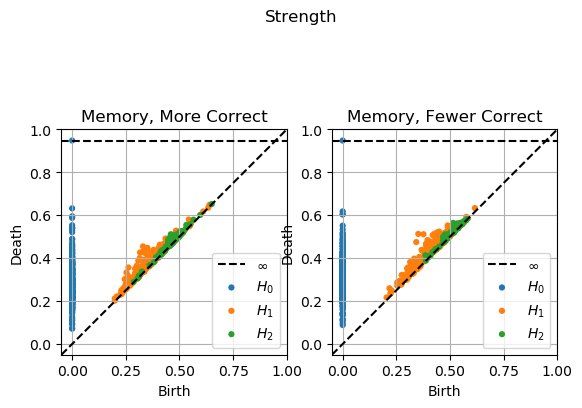

In [210]:
ax=plt.subplot(1,2,1)
plot_diagrams(rips1['dgms'], xy_range=[-0.05,1,-0.05,1])
plt.title('{}, More Correct'.format(goodStates[e]))
ax.grid(b=True,which='both',axis='both')
ax=plt.subplot(1,2,2)
plot_diagrams(rips2['dgms'], xy_range=[-0.05,1,-0.05,1])
plt.title('{}, Fewer Correct'.format(goodStates[e]))
ax.grid(b=True,which='both',axis='both')
plt.suptitle('Strength')
plt.show()

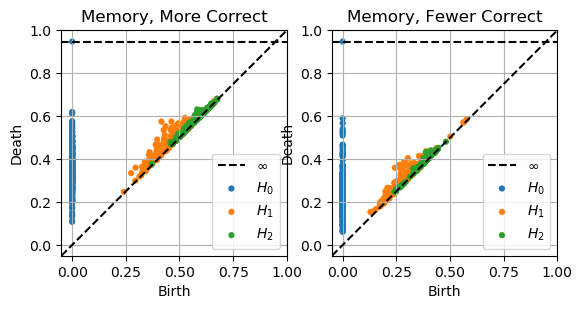

In [176]:
ax=plt.subplot(1,2,1)
plot_diagrams(rips1['dgms'], xy_range=[-0.05,1,-0.05,1])
plt.title('{}, More Correct'.format(goodStates[e]))
ax.grid(b=True,which='both',axis='both')
ax=plt.subplot(1,2,2)
plot_diagrams(rips2['dgms'], xy_range=[-0.05,1,-0.05,1])
plt.title('{}, Fewer Correct'.format(goodStates[e]))
ax.grid(b=True,which='both',axis='both')
plt.show()

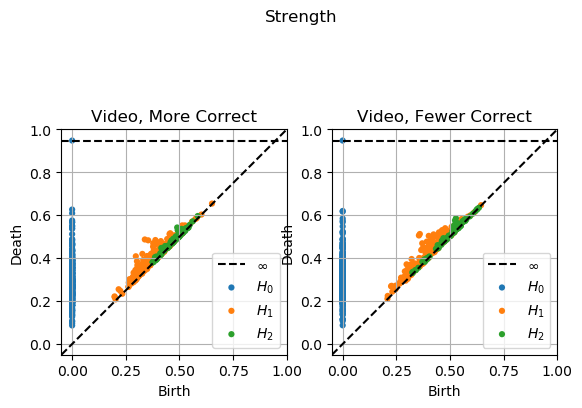

In [216]:
ax=plt.subplot(1,2,1)
plot_diagrams(rips1['dgms'], xy_range=[-0.05,1,-0.05,1])
plt.title('{}, More Correct'.format(goodStates[e]))
ax.grid(b=True,which='both',axis='both')
ax=plt.subplot(1,2,2)
plot_diagrams(rips2['dgms'], xy_range=[-0.05,1,-0.05,1])
plt.title('{}, Fewer Correct'.format(goodStates[e]))
ax.grid(b=True,which='both',axis='both')
plt.suptitle('Strength')
plt.show()

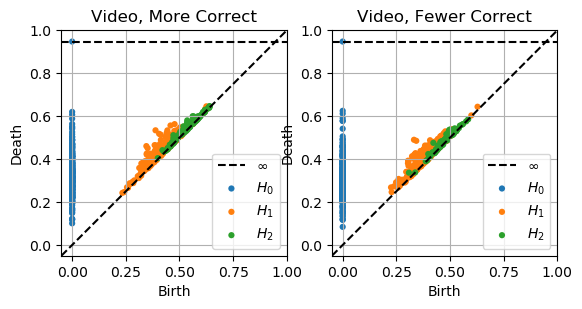

In [87]:
ax=plt.subplot(1,2,1)
plot_diagrams(rips1['dgms'], xy_range=[-0.05,1,-0.05,1])
plt.title('{}, More Correct'.format(goodStates[e]))
ax.grid(b=True,which='both',axis='both')
ax=plt.subplot(1,2,2)
plot_diagrams(rips2['dgms'], xy_range=[-0.05,1,-0.05,1])
plt.title('{}, Fewer Correct'.format(goodStates[e]))
ax.grid(b=True,which='both',axis='both')
plt.show()

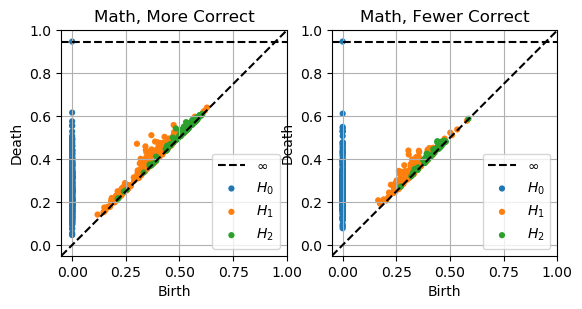

In [99]:
ax=plt.subplot(1,2,1)
plot_diagrams(rips1['dgms'], xy_range=[-0.05,1,-0.05,1])
plt.title('{}, More Correct'.format(goodStates[e]))
ax.grid(b=True,which='both',axis='both')
ax=plt.subplot(1,2,2)
plot_diagrams(rips2['dgms'], xy_range=[-0.05,1,-0.05,1])
plt.title('{}, Fewer Correct'.format(goodStates[e]))
ax.grid(b=True,which='both',axis='both')
plt.show()

In [697]:
rips['dgms'][dim]

array([[0.58625555, 0.59066015],
       [0.50573838, 0.51761103],
       [0.49251735, 0.50512689],
       [0.44256845, 0.45419547],
       [0.41976261, 0.41990787],
       [0.41165748, 0.42680058],
       [0.40371007, 0.42281568],
       [0.40188652, 0.40283823],
       [0.38728836, 0.39337534],
       [0.37921807, 0.39708412],
       [0.37465388, 0.39652258],
       [0.36521417, 0.36692268],
       [0.36369589, 0.37164751],
       [0.36174846, 0.37381619],
       [0.35976395, 0.37176538],
       [0.35664374, 0.37449205],
       [0.34603491, 0.34768721],
       [0.34587851, 0.37003812],
       [0.34314534, 0.34859544],
       [0.33618098, 0.33856544],
       [0.33364418, 0.34224737],
       [0.33175394, 0.35617566],
       [0.33108765, 0.3371332 ],
       [0.33075321, 0.35198876],
       [0.32716566, 0.3283827 ],
       [0.32622594, 0.35125944],
       [0.32464921, 0.33856544],
       [0.32448494, 0.36050159],
       [0.32242957, 0.33533934],
       [0.3213729 , 0.32755354],
       [0.

In [676]:
np.min(rips['dgms'][1][:,1])


0.1269901990890503

In [667]:
rips['cocycles']

[]

In [660]:
curgraph[cycle[:,0],cycle[:,1]]

array([0.25498025, 0.27612914, 0.28582058, 0.29143151, 0.29493136,
       0.29679566, 0.29692688, 0.29751806, 0.29798993, 0.29903334,
       0.30018139, 0.30102915, 0.30363112, 0.30684257, 0.30849907,
       0.3089691 , 0.31148508, 0.312454  , 0.31283288, 0.31336135,
       0.31376831, 0.31462211, 0.32137291, 0.32145208, 0.32178992,
       0.32196715, 0.32319994, 0.323474  , 0.32356517, 0.32375738,
       0.32524871, 0.32671994, 0.32755355, 0.32785715, 0.32833807,
       0.32879892, 0.33097597, 0.33391373, 0.33407966, 0.33433299,
       0.334546  , 0.3369298 , 0.33942237, 0.33999903, 0.34074965,
       0.34242002, 0.3426524 , 0.34277181, 0.34308952, 0.34472648,
       0.34529019, 0.34544332, 0.34582767, 0.34623973, 0.34637763,
       0.3474835 , 0.34769555])

In [656]:
cycle_out.shape

(230, 3)

In [683]:
# for 'PlotFigure5AB.m'

# Many operations require 333 Gordan atlas Indices, so we build 1d and 2d base vectors 
totRegions = 333
g1 = np.full(totRegions,True)
g1[p_utils.missingVoxels] = False

# There are seperate analyses for several kinds of metric spaces. 
# We treat them individually

# Plot A) Representat more correct

condition_label = 'Diagram_1'
e = 3
perf = 'correct'
dim = 1

thresh = 0.15

curgraph = squareform(outGraph_more[e][perf][condition_label])
rips = ripser(curgraph, maxdim=dim, 
             distance_matrix=True, do_cocycles=True)
samples = (rips['dgms'][dim][:,0]>thresh) & (rips['dgms'][dim][:,1] < thresh)
maxpers = np.argmax(np.diff(rips['dgms'][dim],axis=1) * samples)
#thresh = rips['dgms'][dim][maxpers,0]
cycle = rips['cocycles'][dim][maxpers]

cycle_out = cycle + 0.0
cycle_out[:,2] = 1-curgraph[cycle[:,0],cycle[:,1]]
print([min(cycle_out[:,2]), max(cycle_out[:,2])])
MoreEdgesName = 'EdgesMore.txt' 
np.savetxt(MoreEdgesName, cycle_out, delimiter=',', fmt='%1.5f')

clusterer = cluster.AgglomerativeClustering(
    distance_threshold=thresh, linkage='single', affinity='precomputed',n_clusters=None)
simpleClusts = clusterer.fit(curgraph)

simpleClusts_out = np.zeros(totRegions,dtype=int) 
simpleClusts_out[g1] = simpleClusts.labels_+1
clustName = 'NodesMore.txt'
np.savetxt(clustName, simpleClusts_out, delimiter=',', fmt='%1.5f')


# Plot B) Representat fewer correct

curgraph = squareform(outGraph_less[e][perf][condition_label])
rips = ripser(curgraph, maxdim=dim, 
             distance_matrix=True, do_cocycles=True)
samples = (rips['dgms'][dim][:,0]>thresh) & (rips['dgms'][dim][:,1] < thresh)
maxpers = np.argmax(np.diff(rips['dgms'][dim],axis=1) * samples)
#thresh = rips['dgms'][dim][maxpers,0]
cycle = rips['cocycles'][dim][maxpers]

cycle_out = cycle + 0.0
cycle_out[:,2] = 1-curgraph[cycle[:,0],cycle[:,1]]
print([min(cycle_out[:,2]),max(cycle_out[:,2])])       
MoreEdgesName = 'EdgesLess.txt' 
np.savetxt(MoreEdgesName, cycle_out, delimiter=',', fmt='%1.5f')

clusterer = cluster.AgglomerativeClustering(
    distance_threshold=thresh, linkage='single', affinity='precomputed',n_clusters=None)
simpleClusts = clusterer.fit(curgraph)

simpleClusts_out = np.zeros(totRegions,dtype=int) 
simpleClusts_out[g1] = simpleClusts.labels_+1
clustName = 'NodesLess.txt'
np.savetxt(clustName, simpleClusts_out, delimiter=',', fmt='%1.5f')



[0.36254051315326563, 0.36254051315326563]
[0.41374446313671964, 0.41374446313671964]


In [684]:
thresh

0.15

In [689]:
rips['dgms'][dim]

array([[0.58625555, 0.59066015],
       [0.50573838, 0.51761103],
       [0.49251735, 0.50512689],
       [0.44256845, 0.45419547],
       [0.41976261, 0.41990787],
       [0.41165748, 0.42680058],
       [0.40371007, 0.42281568],
       [0.40188652, 0.40283823],
       [0.38728836, 0.39337534],
       [0.37921807, 0.39708412],
       [0.37465388, 0.39652258],
       [0.36521417, 0.36692268],
       [0.36369589, 0.37164751],
       [0.36174846, 0.37381619],
       [0.35976395, 0.37176538],
       [0.35664374, 0.37449205],
       [0.34603491, 0.34768721],
       [0.34587851, 0.37003812],
       [0.34314534, 0.34859544],
       [0.33618098, 0.33856544],
       [0.33364418, 0.34224737],
       [0.33175394, 0.35617566],
       [0.33108765, 0.3371332 ],
       [0.33075321, 0.35198876],
       [0.32716566, 0.3283827 ],
       [0.32622594, 0.35125944],
       [0.32464921, 0.33856544],
       [0.32448494, 0.36050159],
       [0.32242957, 0.33533934],
       [0.3213729 , 0.32755354],
       [0.